In [1]:
%load_ext autoreload
%autoreload 2
import sklearn
import matplotlib
import matplotlib.font_manager as font_manager
import ncempy.io as nio
import joblib
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from scipy.signal import savgol_filter
import math
from sklearn.model_selection import train_test_split
from Analysis_objects_and_functions import *
from sklearn.metrics import r2_score
import glob
from mp_api.client import MPRester
from sklearn import tree
import pydotplus
import pickle
from platform import python_version
import ncempy.io as nio

No module named 'phonopy'
No module named 'phonopy'


In [2]:
print('python version ' + python_version())
print('pandas version ' + pd.__version__)
print('numpy version ' + np.__version__)
print('sklearn version ' + sklearn.__version__)
print('matplotlib version ' + matplotlib.__version__)
print('joblib version ' + joblib.__version__)

import mp_api
from mp_api.client import MPRester

python version 3.10.12
pandas version 1.5.3
numpy version 1.24.3
sklearn version 1.0.2
matplotlib version 3.7.1
joblib version 1.1.0


In [3]:
spec_df = joblib.load('Dataset_generation/Cu_reproducable_alignment_df_extracted_110222.joblib')
spec_df.drop('Structure', axis = 1, inplace = True)

In [4]:
spec_df

,index,mp_id,Energies,Spectrum,pretty_formula,L3_Fermis,L2_Fermis,L3_avg_Fermi,L2_avg_Fermi,Absorbing_indicies,...,Scaled Intensity,NEW Aligned Energies,NEW Aligned intensities,NEW Aligned Broadened,NEW BV Used For Alignment,Scaled Aligned Energy,Scaled Aligned Intensity,TEAM_1_aligned_925_970,new Scaled Energies use,Cumulative_Spectra_TEAM_1_aligned_925_970
0,0,mp-10092,"[933.0, 933.1, 933.2, 933.3, 933.4, 933.5, 933...","[0.04649283458275886, 0.04829645531248924, 0.0...",KCu4Se3,[935.253],[955.221],935.253,955.221,[1],...,"[0.0, 2.0829691853547365e-10, 6.95280520017721...","[917.1599999999994, 917.2599999999995, 917.359...","[0.0, 2.0829691853547365e-10, 6.95280520017721...","[0.00016803669180811838, 0.0001693675611498534...",1.0,"[910.0, 910.1, 910.2, 910.3, 910.4, 910.5, 910...","[1.668123258457915e-11, 1.643184090997103e-11,...","[0.0, 9.573550429379205e-05, 0.000197323967170...","[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 3.507241996738049e-07, 1.0736147403..."
1,1,mp-1018685,"[933.8, 933.9, 934.0, 934.1, 934.2, 934.3, 934...","[0.056876610683152605, 0.0595111463612618, 0.0...",ErCuSn,[936.068],[956.037],936.068,956.037,[2],...,"[0.0, 2.0059781836944448e-10, 6.61613859804468...","[916.1689999999996, 916.2689999999996, 916.368...","[0.0, 2.0059781836944448e-10, 6.61613859804468...","[0.0001675051183793197, 0.00016881482662546755...",0.0,"[910.0, 910.1, 910.2, 910.3, 910.4, 910.5, 910...","[3.781467630460561e-11, 3.7080269733034e-11, 3...","[0.0, 0.00014207732221648055, 0.00029189215800...","[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 5.113980893258978e-07, 1.5620449452..."
2,2,mp-1018723,"[936.8, 936.9, 937.0, 937.1, 937.2, 937.3, 937...","[0.08242481734137702, 0.08690201565992121, 0.0...",HoCo3Cu2,[939.079],[959.047],939.079,959.047,[4],...,"[0.0, 1.6493164955755022e-10, 5.12435329755384...","[913.1579999999997, 913.2579999999996, 913.357...","[0.0, 1.6493164955755022e-10, 5.12435329755384...","[0.0001384592899834398, 0.0001394406986397064,...",0.0,"[910.0, 910.1, 910.2, 910.3, 910.4, 910.5, 910...","[3.072870718515389e-11, 2.9620940709632816e-11...","[0.0, 0.0002856909667407635, 0.000583031544982...","[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 9.42091962666584e-07, 2.86469154211..."
3,3,mp-1018724,"[933.8, 933.9, 934.0, 934.1, 934.2, 934.3, 934...","[0.05905130722742862, 0.061863812668146785, 0....",HoCuSn,[936.107],[956.075],936.107,956.075,[2],...,"[0.0, 2.0256765867375462e-10, 6.70179539577931...","[916.1299999999997, 916.2299999999998, 916.329...","[0.0, 2.0256765867375462e-10, 6.70179539577931...","[0.00017154137321316175, 0.0001728896422325650...",0.0,"[910.0, 910.1, 910.2, 910.3, 910.4, 910.5, 910...","[0.0, 5.813910018628572e-13, 1.165596074282045...","[0.0, 0.00015011752042189174, 0.00030837870995...","[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 5.321042364520825e-07, 1.6251786326..."
4,4,mp-1018741,"[933.9, 934.0, 934.1, 934.2, 934.3, 934.4, 934...","[0.06627432876379193, 0.06958478139169977, 0.0...",LaCuPb,[936.178],[956.146],936.178,956.146,[2],...,"[0.0, 2.0688473621141926e-10, 6.89067648712017...","[916.0589999999997, 916.1589999999999, 916.258...","[0.0, 2.0688473621141926e-10, 6.89067648712017...","[0.0001715005983675257, 0.00017285653414491036...",0.0,"[910.0, 910.1, 910.2, 910.3, 910.4, 910.5, 910...","[1.5177258152852418e-11, 1.4911374399600648e-1...","[0.0, 0.00016796935104424458, 0.00034498768705...","[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 5.962184664748785e-07, 1.8207753779..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3434,3434,mp-554097,"[924.4, 924.5, 924.6, 924.7, 924.8, 924.9, 925...","[0.0, 1.091595222533806e-10, 3.034799821635035...",Sm3CuSiS7,[935.726],None,935.726,None,6,...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[916.6869999999994, 916.7869999999996, 916.886...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.111093699272

In [5]:
def broaden_spec(E,osc,sigma,x,gamma):
    """
    Generates a spectrum broadened by gaussian broadening
    :param E: energy vales for the spectrum (list/ndarray)
    :param osc: intensity values for the spectrum (list/ndarray)
    :param sigma: gausian distribution standard deviation (float)
    :param x: energy vales for the spectrum (list/ndarray)
    :param gamma: FWHM of Cauchy distribution (float)
    :return: broadened spectrum (list)
    """
    gE=[]
    for Ei in x:
        tot=0
        for Ej,os in zip(E,osc):
            tot+=os*scipy.special.voigt_profile(Ej-Ei, sigma, gamma)
        gE.append(tot)
    return gE

In [6]:
def build_cumulative_spectrum(df, column_to_transform= 'TEAM_1_aligned_925_970',
                energy_col = 'new Scaled Energies use'):
    full_cum_spectra = []
    for i in range(0, len(df)):
        print(i)
        row = df.iloc[i]
        spectrum = np.asarray(row[column_to_transform])
        energies = np.asarray(row[energy_col])
        cum_spectrum = []
        for k in range(0, len(spectrum)):
            cum_spectrum.append(sum(spectrum[0:k]))
        
        # plt.figure(figsize=(8, 7))
        # plt.title(' Spectrum', fontsize = 30)
        # plt.xticks(fontsize=28)
        # plt.yticks(fontsize=28)
        # plt.ylabel('Intensity', fontsize=30)
        # plt.xlabel('Energy (eV)', fontsize=30)
        # plt.plot(energies, spectrum, label = 'Pre Transformation', linewidth = 3)        
        # plt.plot(energies, np.asarray(cum_spectrum)/100, label = 'Cumulative Spectrum', linewidth = 3)
        # plt.legend(fontsize = 16)
        # plt.show()
        full_cum_spectra.append(cum_spectrum/max(cum_spectrum))
        
    df['Broadened_Cumulative_Spectra_TEAM_1_aligned_925_970'] = full_cum_spectra


In [7]:
def polynomial(energies, coords):
    intens = []
    for en in energies:
        inten = 0
        count = 0
        for coord in coords:
            inten += (en**count)*(coord)
            count += 1 
        intens.append(inten)
    return intens

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

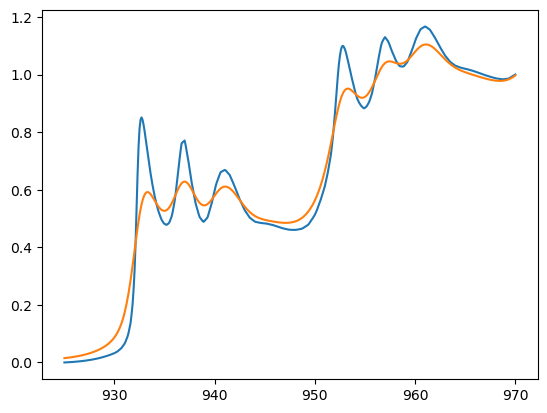

1645
1646
1647
1648
1649
1650
1651
1652
1653
1654
1655
1656
1657
1658
1659
1660
1661
1662
1663
1664
1665
1666
1667
1668
1669
1670
1671
1672
1673
1674
1675
1676
1677
1678
1679
1680
1681
1682
1683
1684
1685
1686
1687
1688
1689
1690
1691
1692
1693
1694
1695
1696
1697
1698
1699
1700
1701
1702
1703
1704
1705
1706
1707
1708
1709
1710
1711
1712
1713
1714
1715
1716
1717
1718
1719
1720
1721
1722
1723
1724
1725
1726
1727
1728
1729
1730
1731
1732
1733
1734
1735
1736
1737
1738
1739
1740
1741
1742
1743
1744
1745
1746
1747
1748
1749
1750
1751
1752
1753
1754
1755
1756
1757
1758
1759
1760
1761
1762
1763
1764
1765
1766
1767
1768
1769
1770
1771
1772
1773
1774
1775
1776
1777
1778
1779
1780
1781
1782
1783
1784
1785
1786
1787
1788
1789
1790
1791
1792
1793
1794
1795
1796
1797
1798
1799
1800
1801
1802
1803
1804
1805
1806
1807
1808
1809
1810
1811
1812
1813
1814
1815
1816
1817
1818
1819
1820
1821
1822
1823
1824
1825
1826
1827
1828
1829
1830
1831
1832
1833
1834
1835
1836
1837
1838
1839
1840
1841
1842
1843
1844


In [280]:
new_df = []
for k in range(0, len(spec_df)):
    print(k)
    row = spec_df.iloc[k]
    intens = spec_df.iloc[k]['TEAM_1_aligned_925_970']
    energies = spec_df.iloc[k]['new Scaled Energies use']

    intens=list(intens)
    energies=list(energies)

    coords_tail = np.polyfit(energies[400:451], intens[400:451], 4)
    coords_tail = list(coords_tail)
    coords_tail.reverse()
    last_5 = polynomial(np.linspace(965,975,101), coords_tail)
    
    for i in range(0, 50):
        intens.append(last_5[51+i])
    for i in range(0, 50):
        energies.append(970.1+(i/10))
    if row.mp_id == 'mp-30':
        plt.plot(energies[0:451], intens[0:451], label = 'raw')

    new_row = list(row)
    new_row.append(intens[0:451])
    new_row.append(0)
    new_row.append(k)

    for amt in [0.5]:
        broadened_intens = broaden_spec(energies, intens, amt, energies, amt)
        # plt.plot(np.linspace(965,975,101), last_5)
        broadened_intens = broadened_intens/broadened_intens[len(broadened_intens)-50]
        if row.mp_id == 'mp-30':
            plt.plot(energies[0:451], broadened_intens[0:451], label=str(amt))
        

        new_row = list(row)
        new_row.append(broadened_intens[0:451])
        new_row.append(amt)
        new_row.append(k)
        new_df.append(new_row)
        
    if row.mp_id == 'mp-30':
        plt.show()

columns = list(spec_df.columns)
columns.append('Broadened_Spectrum')
columns.append('Broadening')
columns.append('Index')
df_test = pd.DataFrame(np.asarray(new_df, dtype='object'), columns = columns)
# print(df_test)
# plt.xlim([965,972])


In [281]:
df_test

,index,mp_id,Energies,Spectrum,pretty_formula,L3_Fermis,L2_Fermis,L3_avg_Fermi,L2_avg_Fermi,Absorbing_indicies,...,NEW Aligned Broadened,NEW BV Used For Alignment,Scaled Aligned Energy,Scaled Aligned Intensity,TEAM_1_aligned_925_970,new Scaled Energies use,Cumulative_Spectra_TEAM_1_aligned_925_970,Broadened_Spectrum,Broadening,Index
0,0,mp-10092,"[933.0, 933.1, 933.2, 933.3, 933.4, 933.5, 933...","[0.04649283458275886, 0.04829645531248924, 0.0...",KCu4Se3,[935.253],[955.221],935.253,955.221,[1],...,"[0.00016803669180811838, 0.0001693675611498534...",1.0,"[910.0, 910.1, 910.2, 910.3, 910.4, 910.5, 910...","[1.668123258457915e-11, 1.643184090997103e-11,...","[0.0, 9.573550429379205e-05, 0.000197323967170...","[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 3.507241996738049e-07, 1.0736147403...","[0.012617189222917656, 0.01287693868082128, 0....",0.5,0
1,1,mp-1018685,"[933.8, 933.9, 934.0, 934.1, 934.2, 934.3, 934...","[0.056876610683152605, 0.0595111463612618, 0.0...",ErCuSn,[936.068],[956.037],936.068,956.037,[2],...,"[0.0001675051183793197, 0.00016881482662546755...",0.0,"[910.0, 910.1, 910.2, 910.3, 910.4, 910.5, 910...","[3.781467630460561e-11, 3.7080269733034e-11, 3...","[0.0, 0.00014207732221648055, 0.00029189215800...","[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 5.113980893258978e-07, 1.5620449452...","[0.013436665984572313, 0.013738434470318611, 0...",0.5,1
2,2,mp-1018723,"[936.8, 936.9, 937.0, 937.1, 937.2, 937.3, 937...","[0.08242481734137702, 0.08690201565992121, 0.0...",HoCo3Cu2,[939.079],[959.047],939.079,959.047,[4],...,"[0.0001384592899834398, 0.0001394406986397064,...",0.0,"[910.0, 910.1, 910.2, 910.3, 910.4, 910.5, 910...","[3.072870718515389e-11, 2.9620940709632816e-11...","[0.0, 0.0002856909667407635, 0.000583031544982...","[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 9.42091962666584e-07, 2.86469154211...","[0.018447612941077288, 0.018951536311080926, 0...",0.5,2
3,3,mp-1018724,"[933.8, 933.9, 934.0, 934.1, 934.2, 934.3, 934...","[0.05905130722742862, 0.061863812668146785, 0....",HoCuSn,[936.107],[956.075],936.107,956.075,[2],...,"[0.00017154137321316175, 0.0001728896422325650...",0.0,"[910.0, 910.1, 910.2, 910.3, 910.4, 910.5, 910...","[0.0, 5.813910018628572e-13, 1.165596074282045...","[0.0, 0.00015011752042189174, 0.00030837870995...","[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 5.321042364520825e-07, 1.6251786326...","[0.013853532375491995, 0.014168533288115046, 0...",0.5,3
4,4,mp-1018741,"[933.9, 934.0, 934.1, 934.2, 934.3, 934.4, 934...","[0.06627432876379193, 0.06958478139169977, 0.0...",LaCuPb,[936.178],[956.146],936.178,956.146,[2],...,"[0.0001715005983675257, 0.00017285653414491036...",0.0,"[910.0, 910.1, 910.2, 910.3, 910.4, 910.5, 910...","[1.5177258152852418e-11, 1.4911374399600648e-1...","[0.0, 0.00016796935104424458, 0.00034498768705...","[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 5.962184664748785e-07, 1.8207753779...","[0.015562886251991983, 0.015943304752681634, 0...",0.5,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3434,3434,mp-554097,"[924.4, 924.5, 924.6, 924.7, 924.8, 924.9, 925...","[0.0, 1.091595222533806e-10, 3.034799821635035...",Sm3CuSiS7,[935.726],None,935.726,None,6,...,"[1.111093699272341e-06, 1.1205182735264179e-06...",1.0,"[910.0, 910.1, 910.2, 910.3, 910.4, 910.5, 910...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 6.890838558686865e-05, 0.000145417579459...","[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 2.188582195081643e-07, 6.8071539777...","[0.018278808976279204, 0.018668569744833625, 0...",0.5,3434
3435,3435,mp-569764,"[924.4, 924.5, 924.6, 924.7, 924.8, 924.9, 925...","[0.0, 1.1532060619855456e-10, 3.24990569902943...",RbCu2I3,[935.026],None,935.026,None,4,...,"[1.0600890344193807e-06, 1.0689732685942553e-0...",1.0,"[910.0, 910.1, 910.2, 910.3, 910.4, 910.5, 910...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

In [277]:
columns = list(spec_df.columns)
columns.append('Broadened_Spectrum')
columns.append('Broadening')
columns.append('Index')

In [278]:
df_test = pd.DataFrame(np.asarray(new_df, dtype='object'), columns = columns)

In [227]:
broadening_0_9 = df_test.loc[df_test['Broadening'] == 0.9].reset_index()

In [229]:
broadening_0_9.drop(['level_0'], axis =1, inplace = True)

In [221]:
np.asarray(new_df, dtype='object').shape

(6878, 37)

In [282]:
build_cumulative_spectrum(df_test, column_to_transform='Broadened_Spectrum', energy_col = 'new Scaled Energies use')

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [283]:
joblib.dump(df_test, 'broadening_0_5.joblib')

['broadening_0_5.joblib']

In [495]:
dataset_filepath = 'Dataset_generation/Cu_reproducable_alignment_df_extracted_110222.joblib'

In [496]:
test_rf_obj = eels_rf_setup(dataset_filepath) 
# initialize analysis object and add dataset path to it 
test_rf_obj.load_spectra_df() # load dataframe 
test_rf_obj.spectra_df['BV Used For Alignment'] = test_rf_obj.spectra_df['NEW BV Used For Alignment'] 
test_rf_obj.spectra_df['mpid_string'] = test_rf_obj.spectra_df['mp_id'] 

# test_rf_obj.augment_df_with_mixtures(len_mixtures = 100, len_combinations=20, gen_type ='random',
#                                     include_mixtures_all = True, sim_column = 'TEAM_1_aligned_925_970',
#                                  cumulative_column = 'Cumulative_Spectra_TEAM_1_aligned_925_970') # run augmentation function that adds mixture spectra to the dataframe 

test_rf_obj.augment_df_with_mixtures(len_mixtures = 100, len_combinations=20, gen_type ='random',
                                    include_mixtures_all = True, sim_column = 'TEAM_1_aligned_925_970',
                                 cumulative_column = 'Cumulative_Spectra_TEAM_1_aligned_925_970')

test_rf_obj.spectra_df['is_stable'] = np.zeros(len(test_rf_obj.spectra_df)) # this is no longer being stored as a part of the 
# model training and analysis
test_rf_obj.spectra_df['is_theoretical'] = np.zeros(len(test_rf_obj.spectra_df)) 

# if this is false, the material has been synthesized. This is how 
# the materials project defines this quantity

test_rf_obj.spectra_df.drop('level_0', axis = 1, inplace = True)
test_rf_obj.spectra_df.drop('index', axis = 1, inplace = True)

mp_id_all_string = []
for i in range(0, len(test_rf_obj.spectra_df)):
    mp_str = test_rf_obj.spectra_df.iloc[i].mpid_string
    if type(mp_str) == list:
        mp_str_list = []
        for mp in mp_str:
            try:
                mp_str_list.append(mp.string)
            except:
                mp_str_list.append(mp)
    else:
        mp_str_list = mp_str

    mp_str_list = str(mp_str_list)
    mp_id_all_string.append(mp_str_list)
test_rf_obj.spectra_df['full_mp_id_string'] = mp_id_all_string
test_rf_obj.spectra_df.drop('Structure', axis = 1, inplace = True)

In [148]:
test_rf_obj.rf_error_df.loc[test_rf_obj.rf_error_df['Pretty Formula'] == 'Cu2O']

,Labels Test,Labels Test Rounded,Predictions,Predictions Rounded,Errors,Errors Rounded,Predictions Std,Full Predictions,Materials Ids,Pretty Formula,Energies,Spectrum,XAS Spectrum,raw valence,spec_df_no_oxides_index
568,1.0,1.0,0.84582,0.8,0.15418,0.2,0.239259,"[0.92, 1.0, 1.0, 0.64, 0.76, 1.0, 1.0, 0.71, 0...",mp-361,Cu2O,"[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 2.2311377160933717e-07, 6.988855581...","[0.0, 6.960679329986635e-05, 0.000148430767687...",1.0,2246


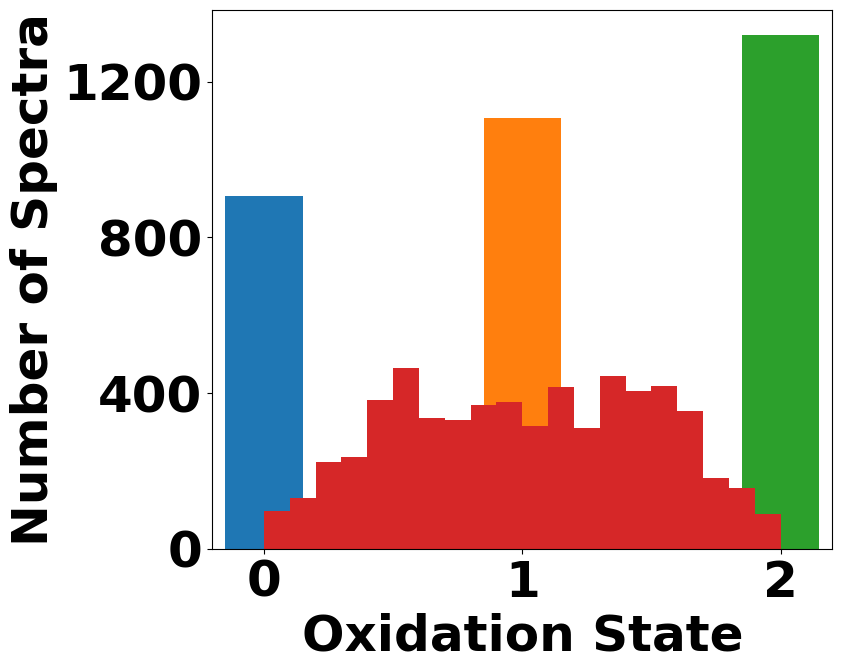

In [497]:
test_rf_obj.visualize_mixture_addition(include_mixtures=True, savefigure=False, right_y_ticks = False, bins=np.linspace(0.0, 2.0, 21))

In [498]:
frac_0 = []
frac_1 = []
frac_2 = []
to_drop = []
for i in range(0, len(test_rf_obj.spectra_df)):
    added = False
    row = test_rf_obj.spectra_df.iloc[i]
    mix = row['Mixture Components']
    try:
        mix[0]
        frac_0.append(mix[0])
        frac_1.append(mix[1])
        frac_2.append(mix[2])
        added = True
        
    except:
        bv = row['BV Used For Alignment']
        if bv == 0.0:
            frac_0.append(1)
            frac_1.append(0)
            frac_2.append(0)
            added = True
            
        if bv == 1.0:
            frac_0.append(0)
            frac_1.append(1)
            frac_2.append(0)
            added = True
            
        if bv == 2.0:
            frac_0.append(0)
            frac_1.append(0)
            frac_2.append(1)            
            added = True
    
    if added == False:
        to_drop.append(i)

In [500]:
test_rf_obj.spectra_df.drop(to_drop, inplace = True)

In [501]:
test_rf_obj.spectra_df['Zero_frac'] = frac_0
test_rf_obj.spectra_df['One_frac'] = frac_1
test_rf_obj.spectra_df['Two_frac'] = frac_2

In [502]:
test_rf_obj.spectra_df.reset_index(inplace = True)

In [507]:
test_rf_obj.spectra_df[['Zero_frac', 'One_frac', 'Two_frac']]

,Zero_frac,One_frac,Two_frac
0,0.0,1.000000,0.000000
1,1.0,0.000000,0.000000
2,1.0,0.000000,0.000000
3,1.0,0.000000,0.000000
4,1.0,0.000000,0.000000
...,...,...,...
9200,0.0,0.571429,0.428571
9201,0.0,0.497462,0.502538
9202,0.0,0.470588,0.529412
9203,0.0,0.564706,0.435294


In [730]:
test_rf_obj.spectra_df.columns

Index(['index', 'mp_id', 'Energies', 'Spectrum', 'pretty_formula', 'L3_Fermis',
       'L2_Fermis', 'L3_avg_Fermi', 'L2_avg_Fermi', 'Absorbing_indicies',
       'bv_sum', 'avg_bv_sum', 'bv_sum_0.975', 'avg_bv_sum_0.975',
       'bv_sum_0.95', 'avg_bv_sum_0.95', 'Integer_BV', 'is_stable',
       'theoretical', 'from_mat_proj', 'potential_error', 'full_ox_states',
       'avg_bv_int', 'Scaled Energy (eV)', 'Scaled Intensity',
       'NEW Aligned Energies', 'NEW Aligned intensities',
       'NEW Aligned Broadened', 'NEW BV Used For Alignment',
       'Scaled Aligned Energy', 'Scaled Aligned Intensity',
       'TEAM_1_aligned_925_970', 'new Scaled Energies use',
       'Cumulative_Spectra_TEAM_1_aligned_925_970', 'BV Used For Alignment',
       'mpid_string', 'Mixture Components', 'is_theoretical',
       'full_mp_id_string', 'Zero_frac', 'One_frac', 'Two_frac'],
      dtype='object')

In [750]:
# train random forest model with the cumulative spectrum, 500 trees, no max depth and all features available  
test_rf_obj.random_forest_train_bond_valance(kind = 'component_array',
                        bv_column = ['Zero_frac', 'One_frac', 'Two_frac'],
                           spectra_to_predict = 'Cumulative_Spectra_TEAM_1_aligned_925_970',
                        energy_col = 'new Scaled Energies use', split_by_id_mixed_valent = True, 
                                             max_features = 'auto', use_full_training_data=False,
                                            )
# 0.9015603378827061

# split_by_id_mixed_valent = True 0.8492826644187004
# split_by_id_mixed_valent = True 0.9 Broadened 0.8059529861565493
# split_by_id_mixed_valent = True 0.5 Broadened 


len training data = 6882
Using columns: Cumulative_Spectra_TEAM_1_aligned_925_970 to predict: Zero_frac One_frac Two_frac
model accuracy (R^2) on simulated test data 0.7852828091464449
(500,)
(500,)
(500,)


In [751]:
pred_0_rounded = []
pred_1_rounded = []
pred_2_rounded = []

true_0_rounded = []
true_1_rounded = []
true_2_rounded = []

pred_stds_0 = []
pred_stds_1 = []
pred_stds_2 = []

for i in range(0, len(test_rf_obj.rf_error_df)):
    true_0_rounded.append(round(test_rf_obj.rf_error_df.iloc[i].True_Zero_Fraction, 2))
    true_1_rounded.append(round(test_rf_obj.rf_error_df.iloc[i].True_One_Fraction, 2))
    true_2_rounded.append(round(test_rf_obj.rf_error_df.iloc[i].True_Two_Fraction, 2))
    
    pred_0_rounded.append(round(test_rf_obj.rf_error_df.iloc[i].Pred_Zero_Fraction, 2))
    pred_1_rounded.append(round(test_rf_obj.rf_error_df.iloc[i].Pred_One_Fraction, 2))
    pred_2_rounded.append(round(test_rf_obj.rf_error_df.iloc[i].Pred_Two_Fraction, 2))
    
    pred_stds_0.append(np.std(test_rf_obj.rf_error_df.iloc[i].Full_Pred_Zero_Fraction))
    pred_stds_1.append(np.std(test_rf_obj.rf_error_df.iloc[i].Full_Pred_One_Fraction))
    pred_stds_2.append(np.std(test_rf_obj.rf_error_df.iloc[i].Full_Pred_Two_Fraction))
    

In [752]:
test_rf_obj.rf_error_df['true_0_rounded'] = true_0_rounded
test_rf_obj.rf_error_df['true_1_rounded'] = true_1_rounded
test_rf_obj.rf_error_df['true_2_rounded'] = true_2_rounded

test_rf_obj.rf_error_df['pred_0_rounded'] = pred_0_rounded
test_rf_obj.rf_error_df['pred_1_rounded'] = pred_1_rounded
test_rf_obj.rf_error_df['pred_2_rounded'] = pred_2_rounded

test_rf_obj.rf_error_df['pred_stds_0'] = pred_stds_0
test_rf_obj.rf_error_df['pred_stds_1'] = pred_stds_1
test_rf_obj.rf_error_df['pred_stds_2'] = pred_stds_2

In [753]:
pred_full_valence = []
pred_full_valence_rounded = []
for i in range(0, len(test_rf_obj.rf_error_df)):
    val = test_rf_obj.rf_error_df.iloc[i].Pred_Zero_Fraction*0 + test_rf_obj.rf_error_df.iloc[i].Pred_One_Fraction*1 + test_rf_obj.rf_error_df.iloc[i].Pred_Two_Fraction*2
    pred_full_valence.append(val)
    pred_full_valence_rounded.append(round(val, 1))


In [754]:
test_rf_obj.rf_error_df['pred_full_valence'] = pred_full_valence
test_rf_obj.rf_error_df['pred_full_valence_rounded'] = pred_full_valence_rounded

In [755]:
avg_pred_std = []
avg_pred_std_rounded = []

for i in range(0, len(test_rf_obj.rf_error_df)):
    val = np.mean([test_rf_obj.rf_error_df.iloc[i].pred_stds_0, test_rf_obj.rf_error_df.iloc[i].pred_stds_1, test_rf_obj.rf_error_df.iloc[i].pred_stds_2])
    avg_pred_std.append(val)
    avg_pred_std_rounded.append(round(val, 2))


In [756]:
test_rf_obj.rf_error_df['avg_pred_std'] = avg_pred_std
test_rf_obj.rf_error_df['avg_pred_std_rounded'] = avg_pred_std_rounded

In [757]:
raw_valence_rounded = []
for i in range(0, len(test_rf_obj.rf_error_df)):
    val = test_rf_obj.rf_error_df.iloc[i].raw_valence
    raw_valence_rounded.append(round(val, 1))

In [758]:
test_rf_obj.rf_error_df['raw_valence_rounded'] = raw_valence_rounded

In [725]:
test_rf_obj.rf_error_df.columns

Index(['True_Zero_Fraction', 'True_One_Fraction', 'True_Two_Fraction',
       'Pred_Zero_Fraction', 'Pred_One_Fraction', 'Pred_Two_Fraction',
       'Full_Pred_Zero_Fraction', 'Full_Pred_One_Fraction',
       'Full_Pred_Two_Fraction', 'Median_Pred_Zero_Fraction',
       'Median_Pred_One_Fraction', 'Median_Pred_Two_Fraction', 'Materials Ids',
       'Pretty Formula', 'Energies', 'Spectrum', 'XAS Spectrum', 'raw_valence',
       'spec_df_no_oxides_index', 'true_0_rounded', 'true_1_rounded',
       'true_2_rounded', 'pred_0_rounded', 'pred_1_rounded', 'pred_2_rounded',
       'pred_stds_0', 'pred_stds_1', 'pred_stds_2', 'pred_full_valence',
       'pred_full_valence_rounded', 'avg_pred_std', 'avg_pred_std_rounded',
       'raw_valence_rounded'],
      dtype='object')

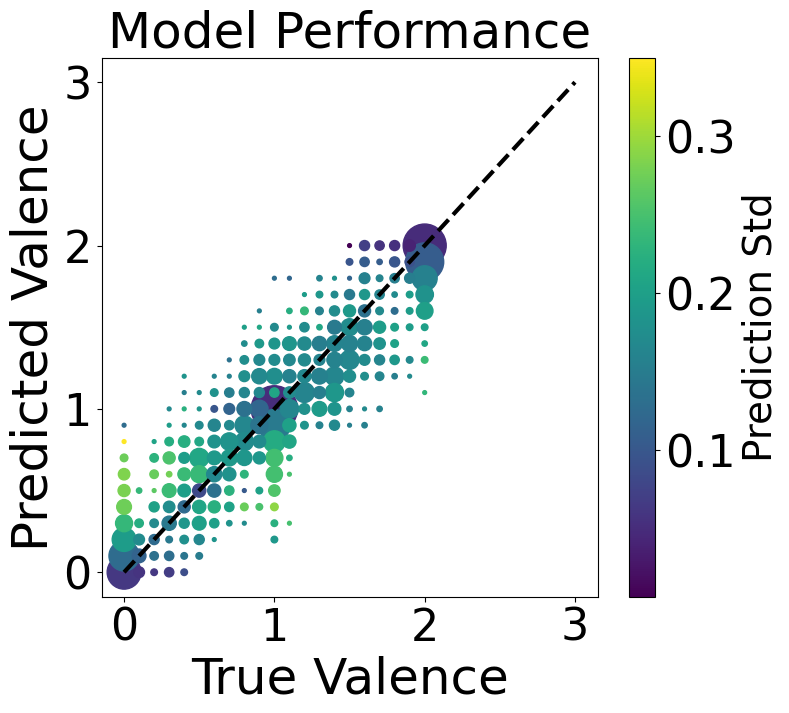

0.861928141565769
0.2305158798600942


In [759]:
true = []
pred = []
count = []
condensed_stds = []

for i in np.asarray(test_rf_obj.rf_error_df[['pred_full_valence_rounded', 'raw_valence_rounded']].value_counts().index):
    pred.append(round(i[0], 1))
    true.append(round(i[1], 1))
    condensed_stds.append(np.mean(test_rf_obj.rf_error_df.loc[
                                          (test_rf_obj.rf_error_df['pred_full_valence_rounded'] == round(i[0], 1)) & (
                                                  test_rf_obj.rf_error_df['raw_valence_rounded'] == round(i[1], 1))][
                                          'avg_pred_std']))


for i in np.asarray(test_rf_obj.rf_error_df[['pred_full_valence_rounded', 'raw_valence_rounded']].value_counts().index):
    count.append(test_rf_obj.rf_error_df[['pred_full_valence_rounded', 'raw_valence_rounded']].value_counts()[i])


std_min = min(condensed_stds)
std_max = max(condensed_stds)
plt.figure(figsize=(8, 7))
plt.xticks([0.0, 1.0, 2.0, 3.0], fontsize=32)
plt.yticks([0.0, 1.0, 2.0, 3.0], fontsize=32)
# plt.ylabel('Normalized Variance Reduction', fontsize=30)
plt.ylabel('Predicted Valence', fontsize=36)
plt.xlabel('True Valence', fontsize=36)
# plt.title('Feature Importances ' + self.predicted_col, fontsize=22)
plt.title('Model Performance', fontsize=36)

min_plot = round(min(test_rf_obj.rf_error_df['raw_valence']) - 0.5, 0)
max_plot = round(max(test_rf_obj.rf_error_df['raw_valence']) + 1.5, 0)
plt.plot(np.arange(min_plot, max_plot, 1), np.arange(min_plot, max_plot, 1), color='k', linewidth=3,
         linestyle='--')

sc = plt.scatter(true, pred, s=np.asarray(count)*7.5, c=condensed_stds, vmin=std_min, vmax=std_max)

cb = plt.colorbar(sc, label='Prediction Std', ticks = [0.1, 0.2, 0.3, 0.4, 0.5])
ax = cb.ax
text = ax.yaxis.label
font = matplotlib.font_manager.FontProperties(size=28)
text.set_font_properties(font)
for t in cb.ax.yaxis.get_ticklabels():
    # t.set_weight("bold")
    t.set_fontsize(32)
plt.show()

print(r2_score(np.asarray(test_rf_obj.rf_error_df['raw_valence']), np.asarray(test_rf_obj.rf_error_df['pred_full_valence'])))
print(np.sqrt(np.mean(np.square(np.asarray(test_rf_obj.rf_error_df['raw_valence']) - np.asarray(test_rf_obj.rf_error_df['pred_full_valence'])))))

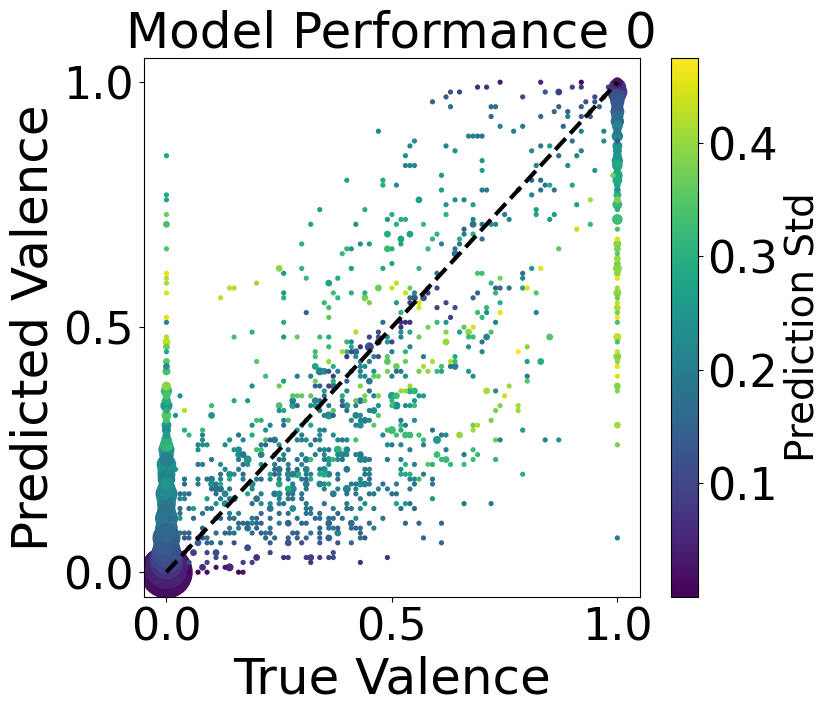

0.721057979371637
0.2273465553110771


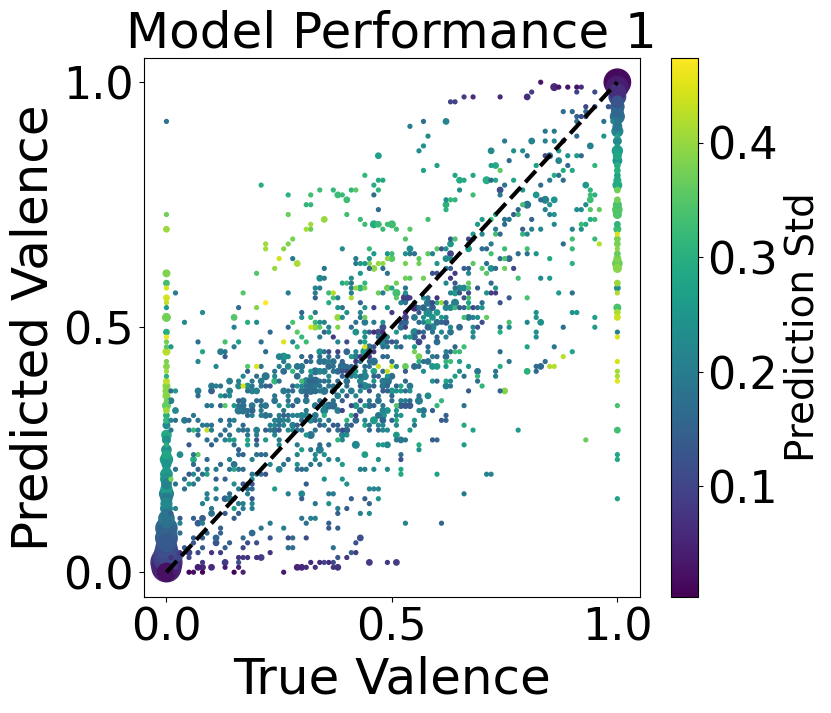

0.7122149387928713
0.20683440942317605


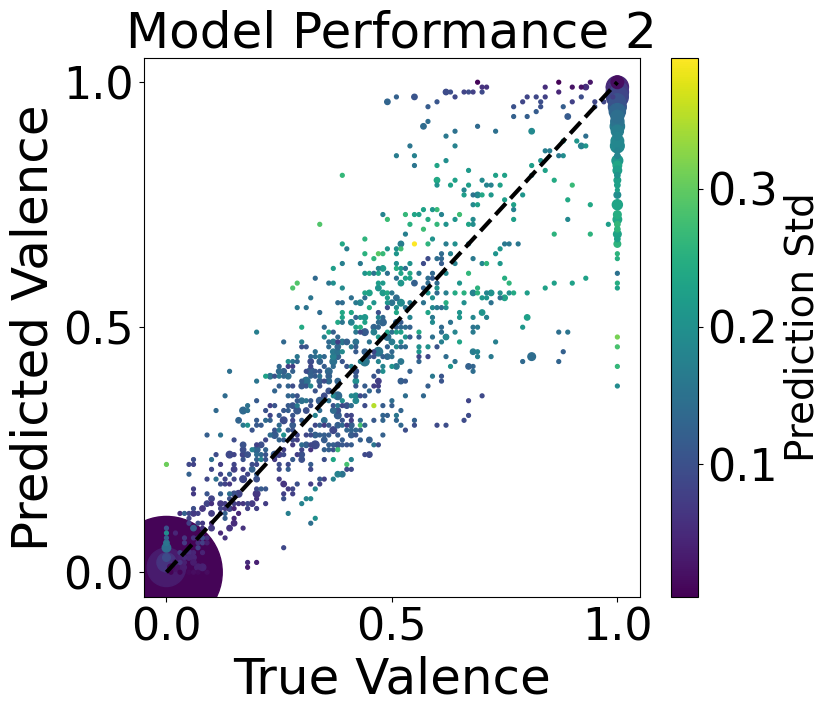

0.9225755092748279
0.14433516997534193


In [760]:
for val in [0, 1, 2]:
    true = []
    pred = []
    count = []
    condensed_stds = []

    for i in np.asarray(test_rf_obj.rf_error_df[['pred_'+str(val)+'_rounded', 'true_'+str(val)+'_rounded']].value_counts().index):
        pred.append(round(i[0], 2))
        true.append(round(i[1], 2))
        condensed_stds.append(np.mean(test_rf_obj.rf_error_df.loc[
                                          (test_rf_obj.rf_error_df['pred_'+str(val)+'_rounded'] == round(i[0], 2)) & (
                                                  test_rf_obj.rf_error_df['true_'+str(val)+'_rounded'] == round(i[1], 2))][
                                          'pred_stds_'+str(val)]))


    for i in np.asarray(test_rf_obj.rf_error_df[['pred_'+str(val)+'_rounded', 'true_'+str(val)+'_rounded']].value_counts().index):
        count.append(test_rf_obj.rf_error_df[['pred_'+str(val)+'_rounded', 'true_'+str(val)+'_rounded']].value_counts()[i])


    std_min = min(condensed_stds)
    std_max = max(condensed_stds)
    plt.figure(figsize=(8, 7))
    plt.xticks([0.0, 0.5, 1.0], fontsize=32)
    plt.yticks([0.0, 0.5, 1.0], fontsize=32)
    # plt.ylabel('Normalized Variance Reduction', fontsize=30)
    plt.ylabel('Predicted Valence', fontsize=36)
    plt.xlabel('True Valence', fontsize=36)
    # plt.title('Feature Importances ' + self.predicted_col, fontsize=22)
    plt.title('Model Performance '+ str(val), fontsize=36)

    min_plot = round(min(test_rf_obj.rf_error_df['true_'+str(val)+'_rounded']) - 0.5, 0)
    max_plot = round(max(test_rf_obj.rf_error_df['true_'+str(val)+'_rounded']) + 1.5, 0)
    plt.plot(np.arange(min_plot, max_plot, 1), np.arange(min_plot, max_plot, 1), color='k', linewidth=3,
             linestyle='--')

    sc = plt.scatter(true, pred, s=np.asarray(count)*7.5, c=condensed_stds, vmin=std_min, vmax=std_max)

    cb = plt.colorbar(sc, label='Prediction Std', ticks = [0.1, 0.2, 0.3, 0.4, 0.5])
    ax = cb.ax
    text = ax.yaxis.label
    font = matplotlib.font_manager.FontProperties(size=28)
    text.set_font_properties(font)
    for t in cb.ax.yaxis.get_ticklabels():
        # t.set_weight("bold")
        t.set_fontsize(32)
    plt.show()
    
    if val == 0:
        val = 'Zero'
    if val == 1:
        val = 'One'
    if val == 2:
        val = 'Two'
       
        
    print(r2_score(np.asarray(test_rf_obj.rf_error_df['True_'+str(val)+'_Fraction']), np.asarray(test_rf_obj.rf_error_df['Pred_'+str(val)+'_Fraction'])))
    print(np.sqrt(np.mean(np.square(np.asarray(true) - np.asarray(pred)))))
    

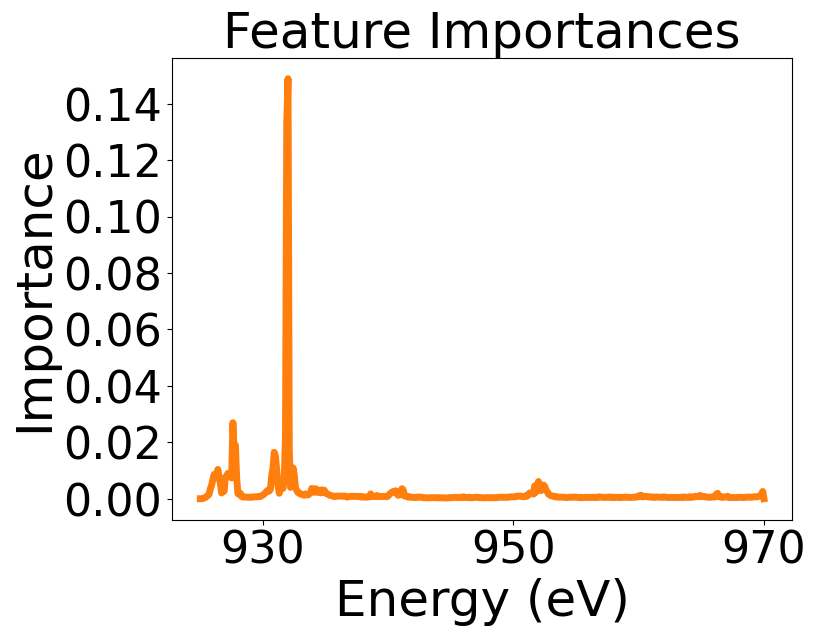

num spectra = 2320
model accuracy (R^2) on simulated test data using Mean trees 0.7852828091464449


KeyError: "None of [Index(['Predictions Rounded', 'Labels Test Rounded'], dtype='object')] are in the [columns]"

In [761]:
test_rf_obj.show_feature_importances('Cu', savefigure=False)

test_rf_obj.show_r2(savefigure=False, scatter_spot_multiplier=7.5)

test_rf_obj.show_errors_histogram(nbins=25, savefigure=False)

In [745]:
shifts = np.linspace(-1.5, 1.5, 31)
shifts

array([-1.5, -1.4, -1.3, -1.2, -1.1, -1. , -0.9, -0.8, -0.7, -0.6, -0.5,
       -0.4, -0.3, -0.2, -0.1,  0. ,  0.1,  0.2,  0.3,  0.4,  0.5,  0.6,
        0.7,  0.8,  0.9,  1. ,  1.1,  1.2,  1.3,  1.4,  1.5])

31
31
31


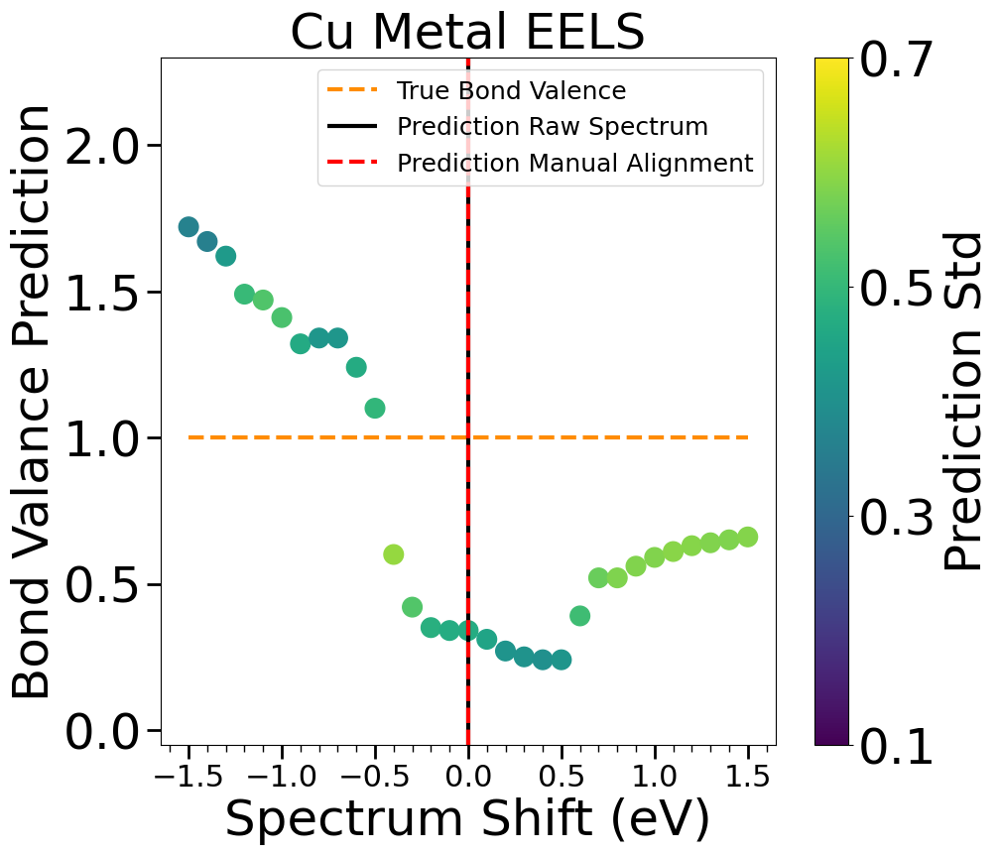

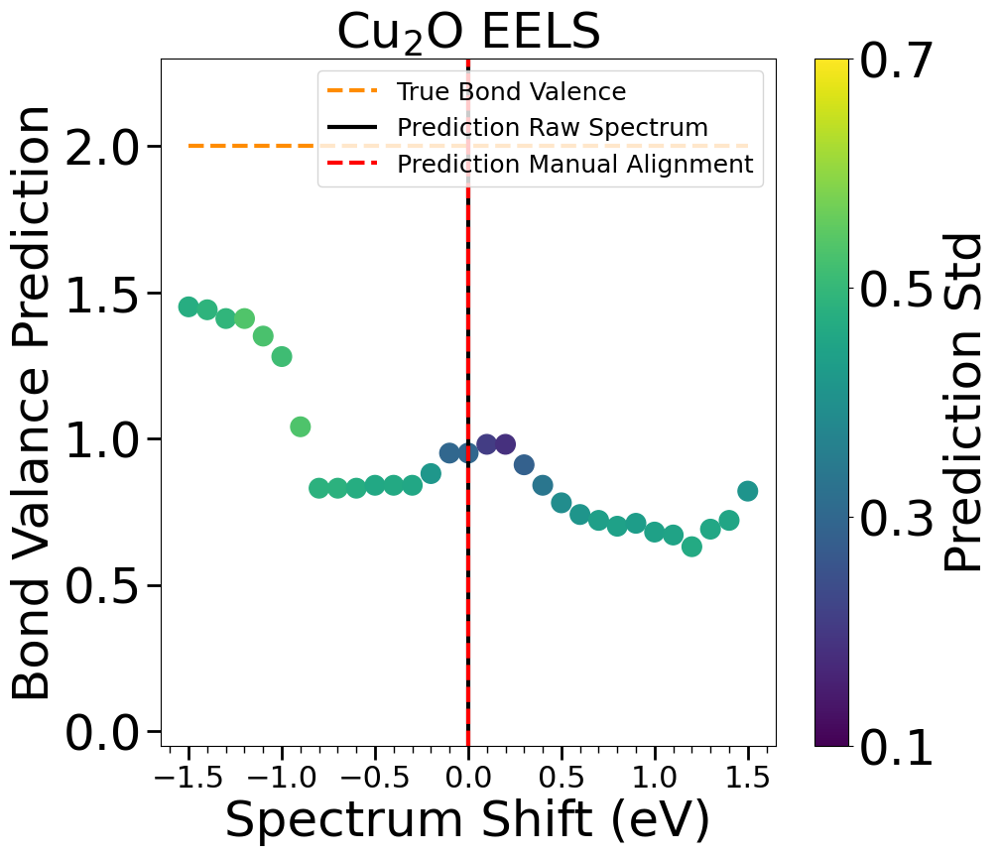

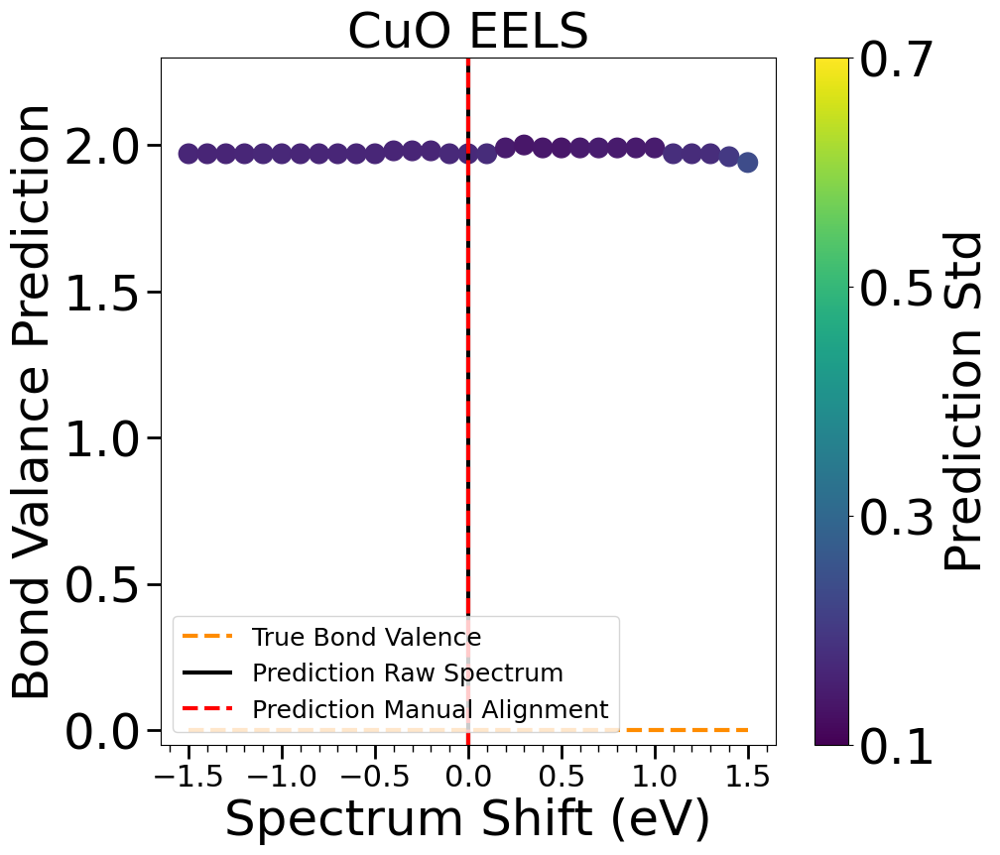

In [746]:
# shift the experimental spectra energy axis and visualize how that impacts prediction 
test_rf_obj.predict_experiment_folder('Cu_deconvolved_spectra/', spectra_type = 'TEAM I', 
                                      shifts = shifts, theory_column = 'TEAM_1_aligned_925_970', smoothings = [[51,3]],
                                     print_details = False, theory_indicies = [1644, 2246, 824])

test_rf_obj.visualize_shift(material = 'All', show_stds = False, show_table = False, savefigure=False, spectrum_type = 'EELS', 
                            show_shift_labels = True, shift_labels = [0, 0, 0], show_true_val = True, theory_index = [1644, 2246, 824])

31
31
31


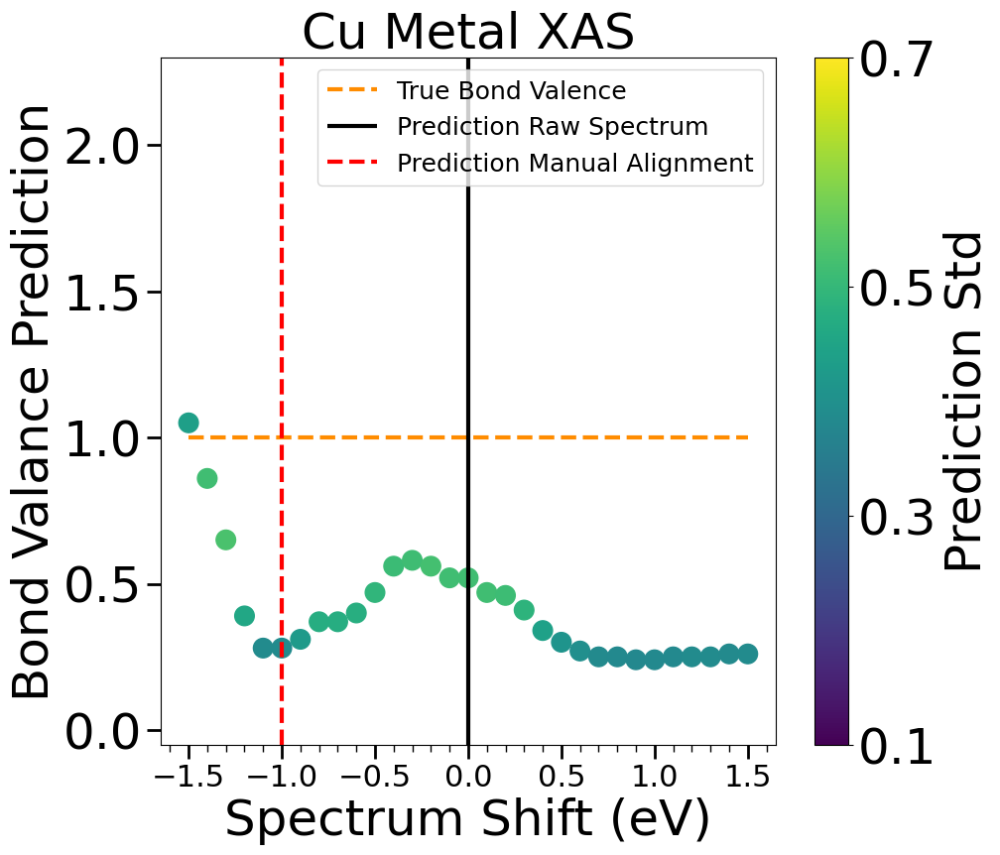

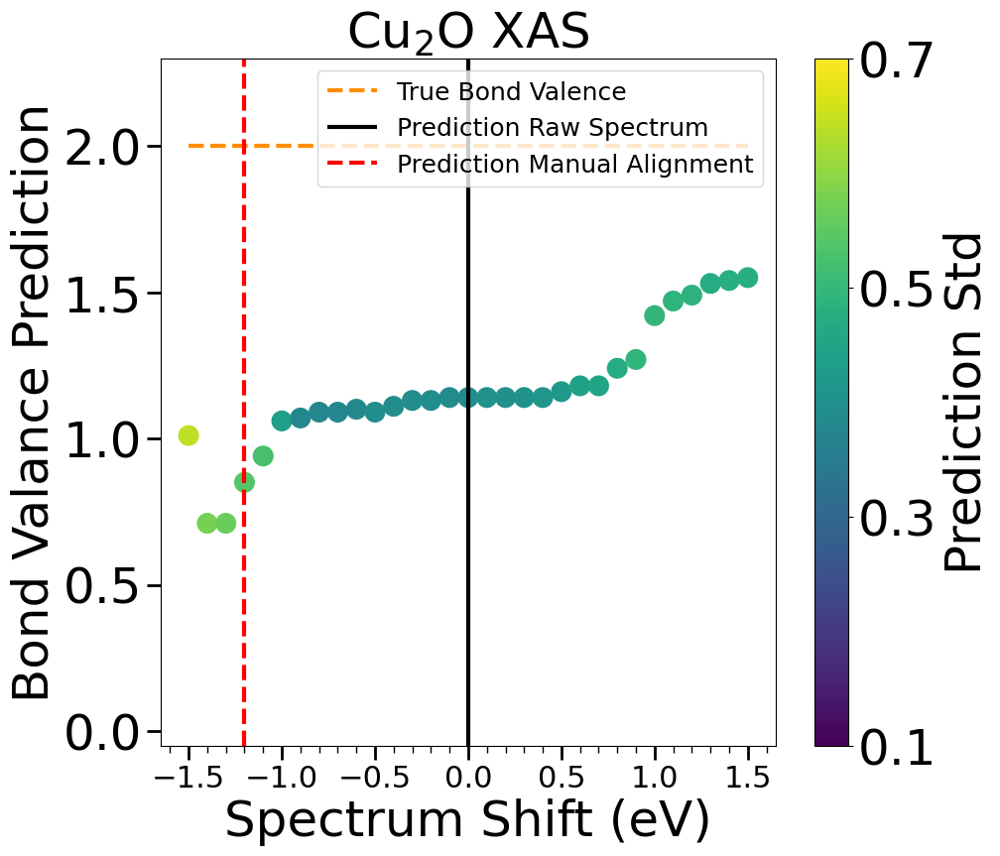

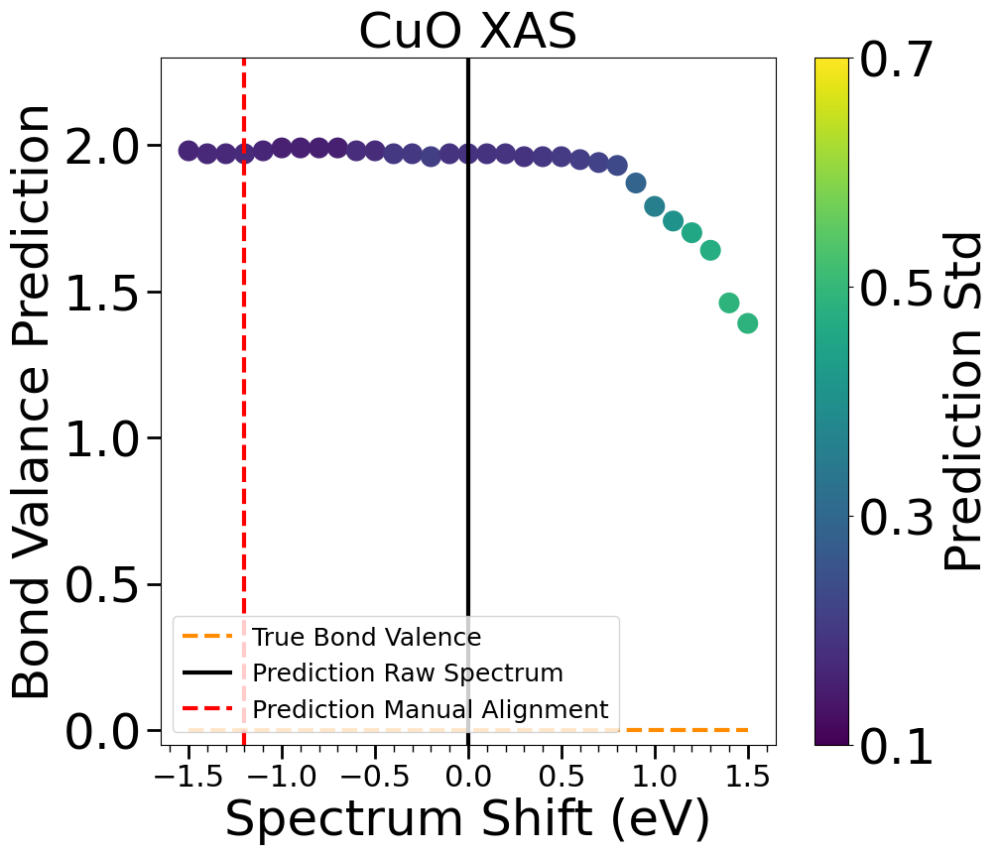

In [747]:
test_rf_obj.predict_experiment_folder('xas paper/', spectra_type = 'csv', 
                                      shifts = shifts, theory_column = 'TEAM_1_aligned_925_970', smoothings = [[15,3]],
                                     print_details = False, show_hist=False, show_plots=False, theory_indicies = [1644, 2246, 824])

test_rf_obj.visualize_shift(material = 'All', show_stds = False, show_table = False, savefigure=False, show_shift_labels = True,
                                     shift_labels = [-1, -1.2, -1.2], spectrum_type = 'XAS', show_true_val = True, theory_index = [1644, 2246, 824])

In [707]:
test_rf_obj.spectra_df.loc[test_rf_obj.spectra_df.pretty_formula == 'Cu']

,index,mp_id,Energies,Spectrum,pretty_formula,L3_Fermis,L2_Fermis,L3_avg_Fermi,L2_avg_Fermi,Absorbing_indicies,...,new Scaled Energies use,Cumulative_Spectra_TEAM_1_aligned_925_970,BV Used For Alignment,mpid_string,Mixture Components,is_theoretical,full_mp_id_string,Zero_frac,One_frac,Two_frac
1553,1644,mp-30,"[933.7, 933.8, 933.9, 934.0, 934.1, 934.2, 934...","[0.06480284104827849, 0.06821915574499554, 0.0...",Cu,[936.037],[956.005],936.037,956.005,[0],...,"[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 5.859968734967248e-07, 1.7900690101...",0.0,mp-30,NaN,0.0,mp-30,1.0,0.0,0.0
2059,2186,mp-1059259,"[924.4, 924.5, 924.6, 924.7, 924.8, 924.9, 925...","[0.0, 1.0283270667926933e-10, 2.81822218647555...",Cu,[935.981],None,935.981,None,0,...,"[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 2.690668979366026e-07, 8.3410890368...",0.0,mp-1059259,NaN,0.0,mp-1059259,1.0,0.0,0.0
2794,2992,mp-1056079,"[924.4, 924.5, 924.6, 924.7, 924.8, 924.9, 925...","[0.0, 1.1500637150686166e-10, 3.23883552120819...",Cu,[935.012],None,935.012,None,0,...,"[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 1.6226465941982623e-07, 5.072449916...",0.0,mp-1056079,NaN,0.0,mp-1056079,1.0,0.0,0.0
2806,3006,mp-998890,"[924.4, 924.5, 924.6, 924.7, 924.8, 924.9, 925...","[0.0, 1.0271942116030051e-10, 2.81438458789402...",Cu,[936.041],None,936.041,None,0,...,"[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 2.8361537110077695e-07, 8.788782735...",0.0,mp-998890,NaN,0.0,mp-998890,1.0,0.0,0.0


In [708]:
test_rf_obj.spectra_df.loc[test_rf_obj.spectra_df.pretty_formula == 'Cu2O']

,index,mp_id,Energies,Spectrum,pretty_formula,L3_Fermis,L2_Fermis,L3_avg_Fermi,L2_avg_Fermi,Absorbing_indicies,...,new Scaled Energies use,Cumulative_Spectra_TEAM_1_aligned_925_970,BV Used For Alignment,mpid_string,Mixture Components,is_theoretical,full_mp_id_string,Zero_frac,One_frac,Two_frac
2112,2246,mp-361,"[924.4, 924.5, 924.6, 924.7, 924.8, 924.9, 925...","[0.0, 1.3376971606836623e-10, 3.91807549222428...",Cu2O,[935.073],None,935.073,None,2,...,"[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 2.2311377160933717e-07, 6.988855581...",1.0,mp-361,NaN,0.0,mp-361,0.0,1.0,0.0


In [709]:
test_rf_obj.spectra_df.loc[test_rf_obj.spectra_df.pretty_formula == 'CuO']

,index,mp_id,Energies,Spectrum,pretty_formula,L3_Fermis,L2_Fermis,L3_avg_Fermi,L2_avg_Fermi,Absorbing_indicies,...,new Scaled Energies use,Cumulative_Spectra_TEAM_1_aligned_925_970,BV Used For Alignment,mpid_string,Mixture Components,is_theoretical,full_mp_id_string,Zero_frac,One_frac,Two_frac
774,824,mp-704645,"[932.7, 932.8, 932.9, 933.0, 933.1, 933.2, 933...","[0.14533635431166614, 0.1550097884826956, 0.16...",CuO,[934.985],[954.953],934.985,954.953,[0],...,"[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 3.5298735311650847e-06, 1.076294547...",2.0,mp-704645,NaN,0.0,mp-704645,0.0,0.0,1.0
2069,2196,mp-14549,"[924.4, 924.5, 924.6, 924.7, 924.8, 924.9, 925...","[0.0, 1.545736001603786e-10, 4.712947337065222...",CuO,[935.115],None,935.115,None,0,...,"[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 3.981242519221186e-06, 1.2268975206...",2.0,mp-14549,NaN,0.0,mp-14549,0.0,0.0,1.0
2262,2408,mp-1064456,"[924.4, 924.5, 924.6, 924.7, 924.8, 924.9, 925...","[0.0, 1.4732160374469508e-10, 4.43102529456743...",CuO,[934.991],None,934.991,None,0,...,"[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 3.0271396109956454e-06, 9.332960195...",2.0,mp-1064456,NaN,0.0,mp-1064456,0.0,0.0,1.0
2864,3069,mp-1692,"[924.4, 924.5, 924.6, 924.7, 924.8, 924.9, 925...","[0.0, 1.471204967229289e-10, 4.423280153085030...",CuO,[934.993],None,934.993,None,0,...,"[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 3.026013780813895e-06, 9.3293808237...",2.0,mp-1692,NaN,0.0,mp-1692,0.0,0.0,1.0


In [179]:
test_rf_obj.spectra_df.loc[test_rf_obj.spectra_df.pretty_formula == 'Cu2S']

,mp_id,Energies,Spectrum,pretty_formula,L3_Fermis,L2_Fermis,L3_avg_Fermi,L2_avg_Fermi,Absorbing_indicies,bv_sum,...,Scaled Aligned Energy,Scaled Aligned Intensity,TEAM_1_aligned_925_970,new Scaled Energies use,Cumulative_Spectra_TEAM_1_aligned_925_970,BV Used For Alignment,mpid_string,Mixture Components,is_theoretical,full_mp_id_string
325,mp-12087,"[932.9, 933.0, 933.1, 933.2, 933.3, 933.4, 933...","[0.06380960528358522, 0.06711379538995611, 0.0...",Cu2S,[935.209],[955.177],935.209,955.177,[0],[0.7607230116193632],...,"[910.0, 910.1, 910.2, 910.3, 910.4, 910.5, 910...","[0.0, 1.1627867148971693e-12, 2.33681893537911...","[0.0, 0.00013166577960583713, 0.00027145537591...","[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 4.685847740490024e-07, 1.4346661383...",1.0,mp-12087,NaN,0.0,mp-12087
719,mp-581212,"[933.1, 933.2, 933.3, 933.4, 933.5, 933.6, 933...","[0.07465974706992684, 0.07836059234834372, 0.0...",Cu2S,"[935.193, 935.238, 935.27, 935.363, 935.203, 9...","[955.161, 955.206, 955.238, 955.331, 955.171, ...",935.230208,955.198208,"[0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[0.8678030566446076, 0.7028685366958336, 0.729...",...,"[910.0, 910.1, 910.2, 910.3, 910.4, 910.5, 910...","[5.978021908004584e-11, 5.861226451841174e-11,...","[0.0, 0.00014672869576689104, 0.00030249215844...","[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 5.007498118691115e-07, 1.5330829259...",1.0,mp-581212,NaN,0.0,mp-581212
745,mp-618991,"[932.9, 933.0, 933.1, 933.2, 933.3, 933.4, 933...","[0.0690723804455702, 0.07264618178338607, 0.07...",Cu2S,[935.157],[955.125],935.157,955.125,[0],[0.7949910218493675],...,"[910.0, 910.1, 910.2, 910.3, 910.4, 910.5, 910...","[0.0, 4.3187623967583057e-14, 8.63907899069558...","[0.0, 0.00013939602817689814, 0.00028745390744...","[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 4.90361337221735e-07, 1.50155429794...",1.0,mp-618991,NaN,0.0,mp-618991
2050,mp-553942,"[924.4, 924.5, 924.6, 924.7, 924.8, 924.9, 925...","[0.0, 1.1439793682339282e-10, 3.21743108975367...",Cu2S,"[935.374, 935.279]",None,935.3265,None,1,None,...,"[910.0, 910.1, 910.2, 910.3, 910.4, 910.5, 910...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 5.3132845275691054e-05, 0.00011273310408...","[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 1.7274878389997903e-07, 5.392736055...",1.0,mp-553942,NaN,0.0,mp-553942


In [242]:
test_rf_obj.spectra_df.loc[test_rf_obj.spectra_df.pretty_formula == 'CuS']

,mp_id,Energies,Spectrum,pretty_formula,L3_Fermis,L2_Fermis,L3_avg_Fermi,L2_avg_Fermi,Absorbing_indicies,bv_sum,...,Scaled Aligned Energy,Scaled Aligned Intensity,TEAM_1_aligned_925_970,new Scaled Energies use,Cumulative_Spectra_TEAM_1_aligned_925_970,BV Used For Alignment,mpid_string,Mixture Components,is_theoretical,full_mp_id_string
535,mp-504,"[932.8, 932.9, 933.0, 933.1, 933.2, 933.3, 933...","[0.07312503594790196, 0.07666309936856033, 0.0...",CuS,"[934.936, 935.045]","[954.904, 955.013]",934.9905,954.9585,"[0, 4]","[1.0182894505608355, 1.132555349547376]",...,"[910.0, 910.1, 910.2, 910.3, 910.4, 910.5, 910...","[0.0, 2.660189092747645e-13, 5.326272744405181...","[0.0, 0.0005182853710907665, 0.001061873146142...","[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 1.63716306332365e-06, 4.99141458144...",2.0,mp-504,NaN,0.0,mp-504
2488,mp-558139,"[924.4, 924.5, 924.6, 924.7, 924.8, 924.9, 925...","[0.0, 1.3885253639549672e-10, 4.10831457933754...",CuS,"[934.929, 934.941]",None,934.935,None,3,None,...,"[910.0, 910.1, 910.2, 910.3, 910.4, 910.5, 910...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0007366217287878223, 0.001534766676459...","[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 2.2417937063749833e-06, 6.912617470...",2.0,mp-558139,NaN,0.0,mp-558139
3330,mp-555599,"[924.4, 924.5, 924.6, 924.7, 924.8, 924.9, 925...","[0.0, 1.1552129035422857e-10, 3.25698114199473...",CuS,"[934.937, 935.049]",None,934.993,None,3,None,...,"[910.0, 910.1, 910.2, 910.3, 910.4, 910.5, 910...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.00038892893847739755, 0.00080954174417...","[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 1.172610674365254e-06, 3.6133580619...",2.0,mp-555599,NaN,0.0,mp-555599


In [193]:
test_rf_obj.spectra_df.loc[test_rf_obj.spectra_df.pretty_formula == 'FeCuS2']

,mp_id,Energies,Spectrum,pretty_formula,L3_Fermis,L2_Fermis,L3_avg_Fermi,L2_avg_Fermi,Absorbing_indicies,bv_sum,...,Scaled Aligned Energy,Scaled Aligned Intensity,TEAM_1_aligned_925_970,new Scaled Energies use,Cumulative_Spectra_TEAM_1_aligned_925_970,BV Used For Alignment,mpid_string,Mixture Components,is_theoretical,full_mp_id_string
2553,mp-640073,"[924.4, 924.5, 924.6, 924.7, 924.8, 924.9, 925...","[0.0, 1.2484563983035948e-10, 3.59044028185500...",FeCuS2,[935.288],None,935.288,None,2,None,...,"[910.0, 910.1, 910.2, 910.3, 910.4, 910.5, 910...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 7.425889277474269e-05, 0.000157745166131...","[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 2.3340065461016199e-07, 7.292042366...",1.0,mp-640073,NaN,0.0,mp-640073


In [206]:
test_rf_obj.spectra_df.loc[test_rf_obj.spectra_df.pretty_formula == 'ZrCuSiAs']

,mp_id,Energies,Spectrum,pretty_formula,L3_Fermis,L2_Fermis,L3_avg_Fermi,L2_avg_Fermi,Absorbing_indicies,bv_sum,...,Scaled Aligned Energy,Scaled Aligned Intensity,TEAM_1_aligned_925_970,new Scaled Energies use,Cumulative_Spectra_TEAM_1_aligned_925_970,BV Used For Alignment,mpid_string,Mixture Components,is_theoretical,full_mp_id_string
2014,mp-9929,"[933.5, 933.6, 933.7, 933.8, 933.9, 934.0, 934...","[0.0699965102511862, 0.07382605672949612, 0.07...",ZrCuSiAs,[935.83],[955.798],935.83,955.798,[2],[0.9330951099422549],...,"[910.0, 910.1, 910.2, 910.3, 910.4, 910.5, 910...","[6.26603610984721e-11, 6.129172596619207e-11, ...","[0.0, 0.00017328110043096892, 0.00035647737469...","[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 5.711329580010734e-07, 1.7460791983...",1.0,mp-9929,NaN,0.0,mp-9929


In [208]:
test_rf_obj.spectra_df.loc[test_rf_obj.spectra_df.pretty_formula == 'ZrCuSiP']

,mp_id,Energies,Spectrum,pretty_formula,L3_Fermis,L2_Fermis,L3_avg_Fermi,L2_avg_Fermi,Absorbing_indicies,bv_sum,...,Scaled Aligned Energy,Scaled Aligned Intensity,TEAM_1_aligned_925_970,new Scaled Energies use,Cumulative_Spectra_TEAM_1_aligned_925_970,BV Used For Alignment,mpid_string,Mixture Components,is_theoretical,full_mp_id_string
2152,mp-20588,"[924.4, 924.5, 924.6, 924.7, 924.8, 924.9, 925...","[0.0, 1.0787190411037253e-10, 2.99036544605164...",ZrCuSiP,[936.024],None,936.024,None,4,None,...,"[910.0, 910.1, 910.2, 910.3, 910.4, 910.5, 910...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 8.944280177564806e-05, 0.000188130635443...","[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 2.782979366737159e-07, 8.6365938141...",1.0,mp-20588,NaN,0.0,mp-20588


In [215]:
test_rf_obj.spectra_df.loc[test_rf_obj.spectra_df.pretty_formula == 'LaCuSO']

,mp_id,Energies,Spectrum,pretty_formula,L3_Fermis,L2_Fermis,L3_avg_Fermi,L2_avg_Fermi,Absorbing_indicies,bv_sum,...,Scaled Aligned Energy,Scaled Aligned Intensity,TEAM_1_aligned_925_970,new Scaled Energies use,Cumulative_Spectra_TEAM_1_aligned_925_970,BV Used For Alignment,mpid_string,Mixture Components,is_theoretical,full_mp_id_string
2294,mp-6088,"[924.4, 924.5, 924.6, 924.7, 924.8, 924.9, 925...","[0.0, 1.1577710414831069e-10, 3.26600652314296...",LaCuSO,[935.566],None,935.566,None,4,None,...,"[910.0, 910.1, 910.2, 910.3, 910.4, 910.5, 910...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 7.68346987888914e-05, 0.0001625183053981...","[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 2.34139537050594e-07, 7.29384021482...",1.0,mp-6088,NaN,0.0,mp-6088


In [223]:
test_rf_obj.spectra_df.loc[test_rf_obj.spectra_df.pretty_formula == 'LaCuSeO']

,mp_id,Energies,Spectrum,pretty_formula,L3_Fermis,L2_Fermis,L3_avg_Fermi,L2_avg_Fermi,Absorbing_indicies,bv_sum,...,Scaled Aligned Energy,Scaled Aligned Intensity,TEAM_1_aligned_925_970,new Scaled Energies use,Cumulative_Spectra_TEAM_1_aligned_925_970,BV Used For Alignment,mpid_string,Mixture Components,is_theoretical,full_mp_id_string
2433,mp-552488,"[924.4, 924.5, 924.6, 924.7, 924.8, 924.9, 925...","[0.0, 1.1628037106493793e-10, 3.28378275157648...",LaCuSeO,[935.401],None,935.401,None,4,None,...,"[910.0, 910.1, 910.2, 910.3, 910.4, 910.5, 910...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 6.382954267261796e-05, 0.000135306851674...","[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 2.0257072550241132e-07, 6.319832821...",1.0,mp-552488,NaN,0.0,mp-552488


In [229]:
test_rf_obj.spectra_df.loc[test_rf_obj.spectra_df.pretty_formula == 'LaCuTeO']

,mp_id,Energies,Spectrum,pretty_formula,L3_Fermis,L2_Fermis,L3_avg_Fermi,L2_avg_Fermi,Absorbing_indicies,bv_sum,...,Scaled Aligned Energy,Scaled Aligned Intensity,TEAM_1_aligned_925_970,new Scaled Energies use,Cumulative_Spectra_TEAM_1_aligned_925_970,BV Used For Alignment,mpid_string,Mixture Components,is_theoretical,full_mp_id_string
591,mp-546790,"[933.0, 933.1, 933.2, 933.3, 933.4, 933.5, 933...","[0.06741100614751687, 0.07096934312229453, 0.0...",LaCuTeO,[935.27],[955.238],935.27,955.238,[2],[1.0423650369432567],...,"[910.0, 910.1, 910.2, 910.3, 910.4, 910.5, 910...","[0.0, 3.845028324582484e-13, 7.702368964259775...","[0.0, 0.00013772690390268462, 0.00028388747409...","[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 5.078075519344837e-07, 1.5545181012...",1.0,mp-546790,NaN,0.0,mp-546790


(926.0, 936.0)

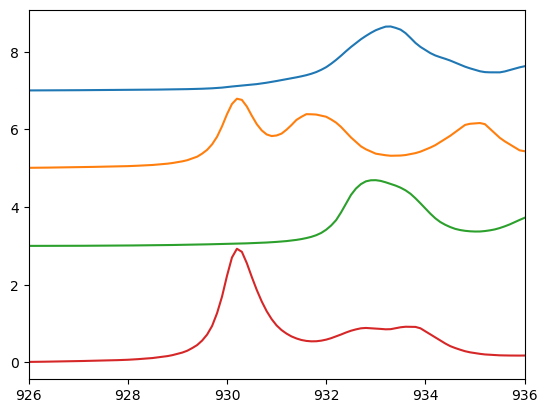

In [395]:
plt.plot(np.asarray(test_rf_obj.spectra_df.loc[test_rf_obj.spectra_df.pretty_formula == 'Al2CuO4']['new Scaled Energies use'])[0],
         np.asarray(test_rf_obj.spectra_df.loc[test_rf_obj.spectra_df.pretty_formula == 'Al2CuO4']['TEAM_1_aligned_925_970'])[0]+7)

plt.plot(np.asarray(test_rf_obj.spectra_df.loc[test_rf_obj.spectra_df.pretty_formula == 'Cr2CuO4']['new Scaled Energies use'])[0],
         np.asarray(test_rf_obj.spectra_df.loc[test_rf_obj.spectra_df.pretty_formula == 'Cr2CuO4']['TEAM_1_aligned_925_970'])[0]+5)

plt.plot(np.asarray(test_rf_obj.spectra_df.loc[test_rf_obj.spectra_df.pretty_formula == 'FeCuS2']['new Scaled Energies use'])[0],
         np.asarray(test_rf_obj.spectra_df.loc[test_rf_obj.spectra_df.pretty_formula == 'FeCuS2']['TEAM_1_aligned_925_970'])[0]+3)

plt.plot(np.asarray(test_rf_obj.spectra_df.iloc[824]['new Scaled Energies use']),
         np.asarray(test_rf_obj.spectra_df.iloc[824]['TEAM_1_aligned_925_970']))
plt.xlim([926,936])

In [243]:
alignments = {
    'LaCuTeO':-2.6,
    'LaCuSeO':-2.4,
    'LaCuSO':-2.4,
    'ZrCuSiP':-2,
    'ZrCuSiAs':-2,
    'CuS':-2,
    'Cu2S':-1.8,
    'CuFeS2':0.5,
}

theory_indicies = {
    'LaCuTeO':591,
    'LaCuSeO':2433,
    'LaCuSO':2294,
    'ZrCuSiP':2152,
    'ZrCuSiAs':2014,
    'CuS':2488,
    'Cu2S':745,
    'CuFeS2':2553,
}

In [241]:
alignments

{'LaCuTeO': -2.6,
 'LaCuSeO': -2.4,
 'LaCuSO': -2.4,
 'ZrCuSiP': -2,
 'ZrCuSiAs': -2,
 'CuS': -2,
 'Cu2S': -1.8,
 'CuFeS2': 0.5}

LaCuTeO
[0.23949513 0.46056572 0.29993915]


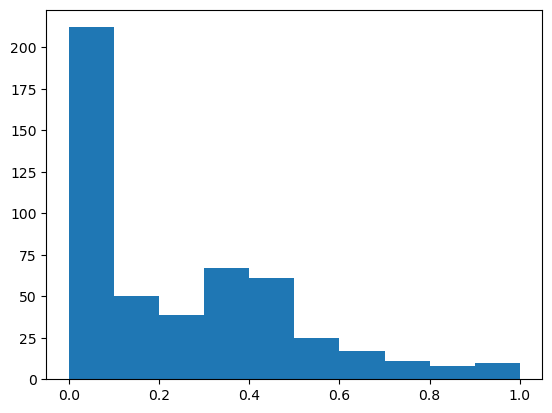

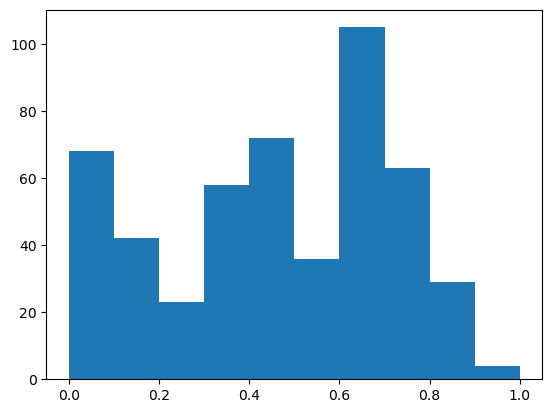

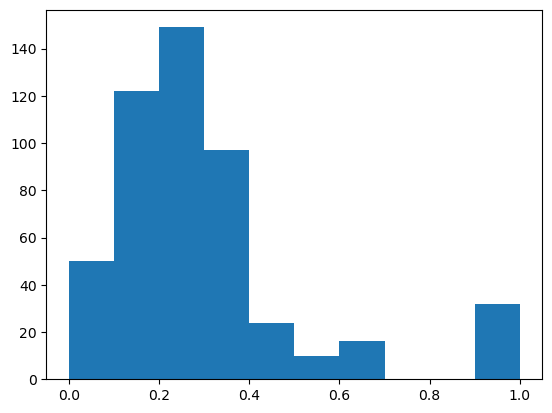

LaCuSeO
[0.21619158 0.43109474 0.35271368]


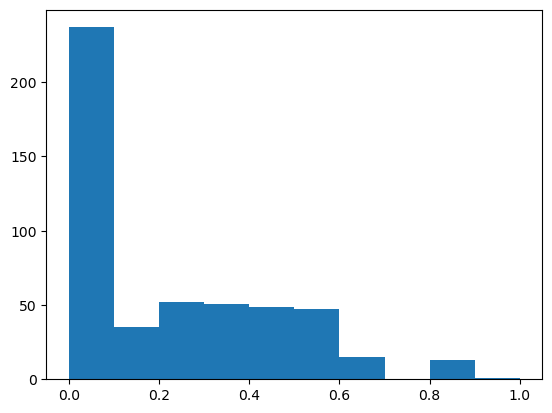

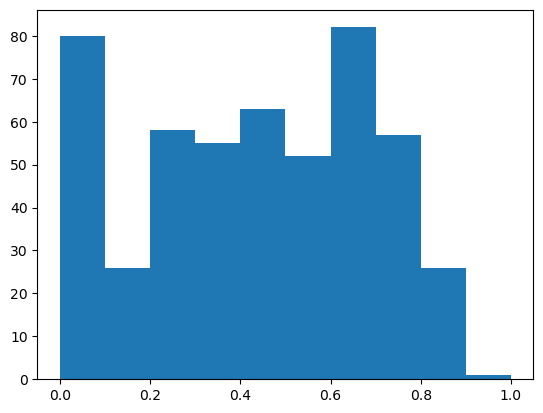

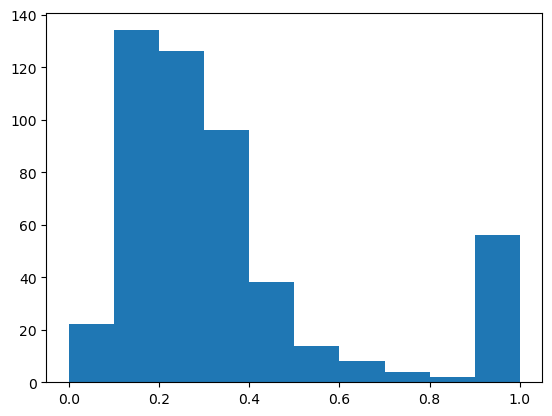

LaCuSO
[0.11433128 0.54361777 0.34205095]


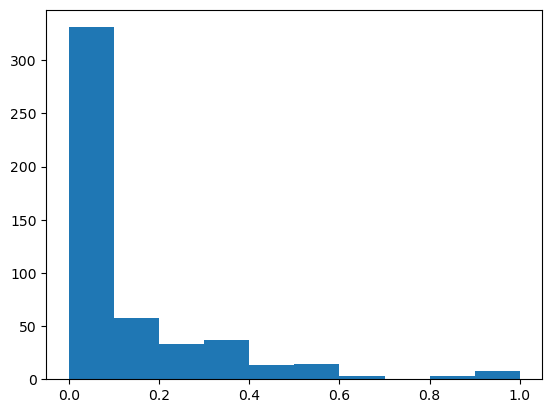

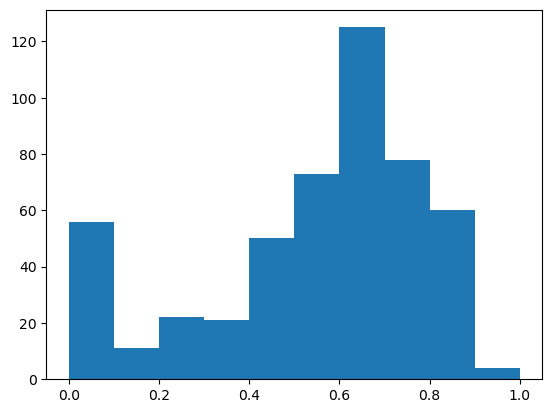

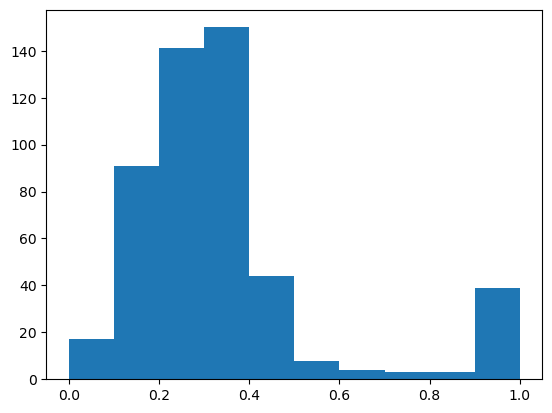

ZrCuSiP
[0.24882743 0.49440927 0.25676329]


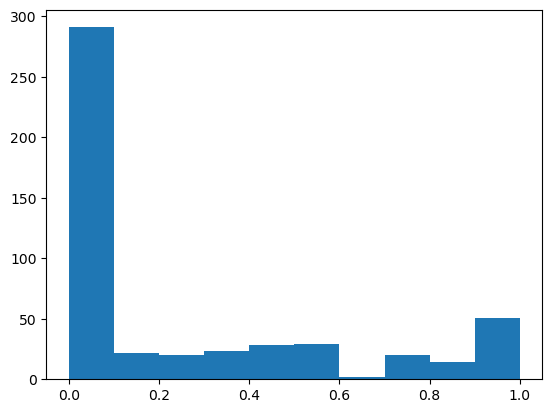

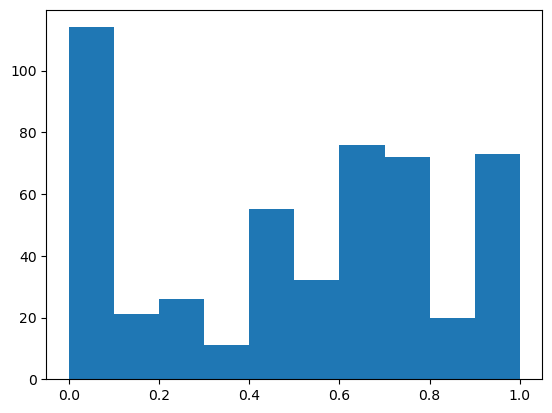

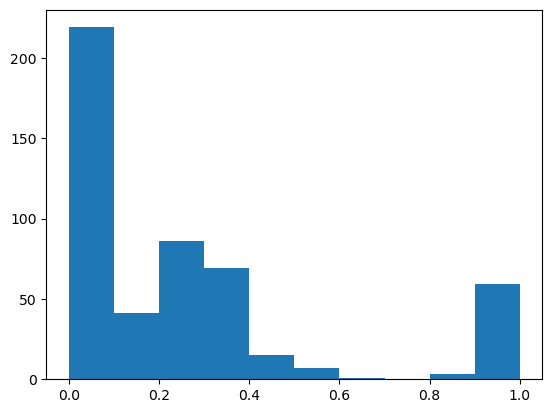

ZrCuSiAs
[0.22857632 0.52781693 0.24360675]


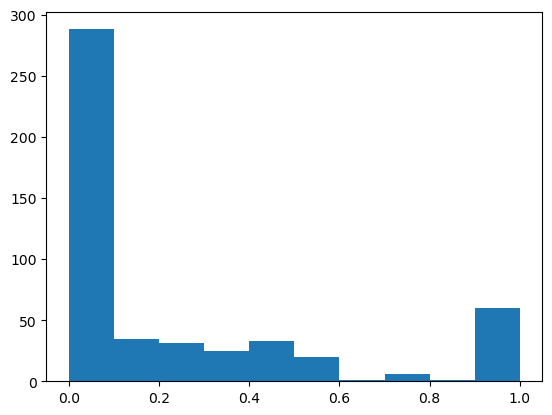

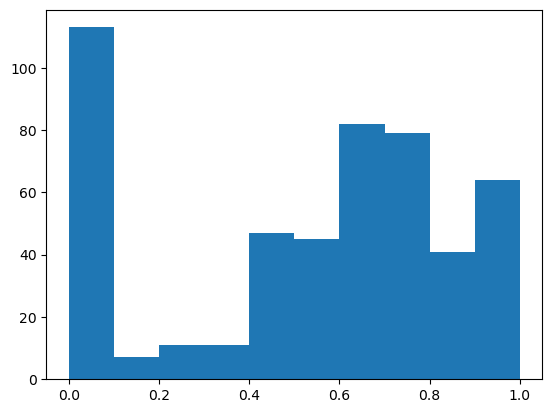

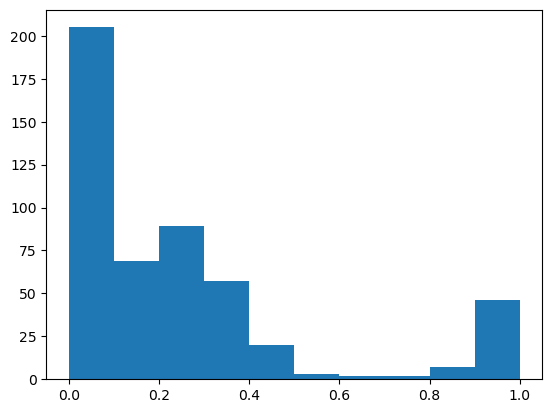

CuS
[0.05915426 0.56113919 0.37970656]


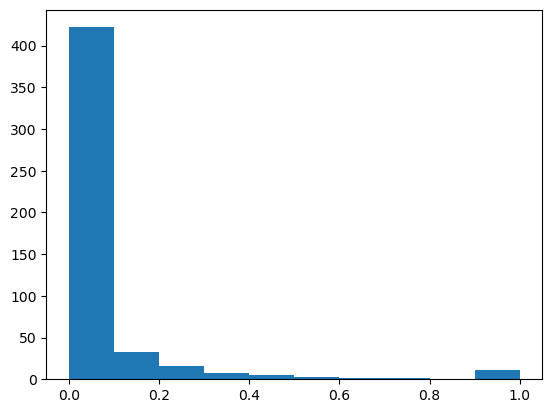

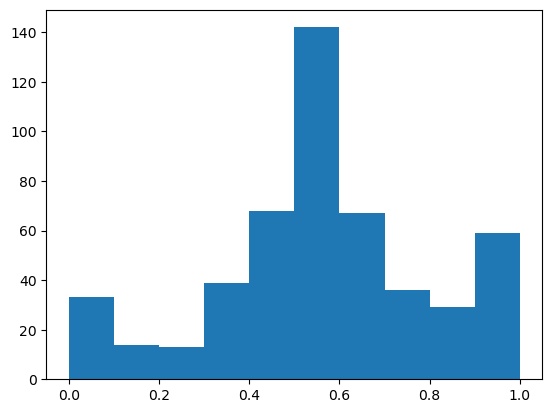

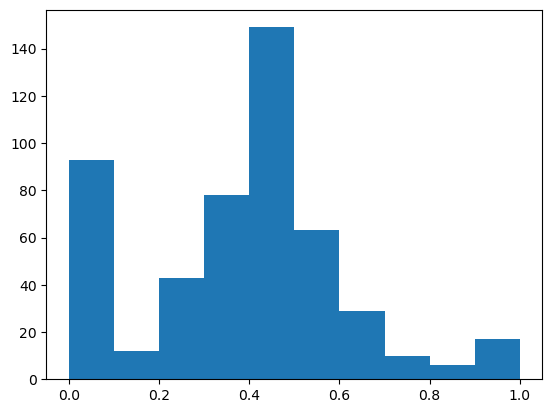

Cu2S
[0.29617558 0.69556343 0.00826099]


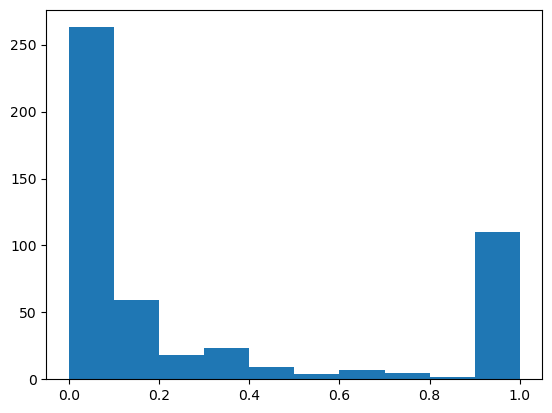

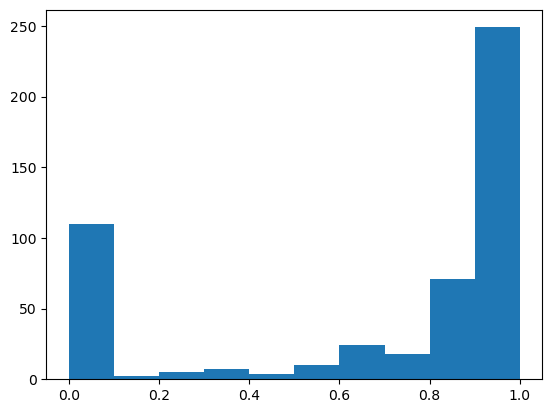

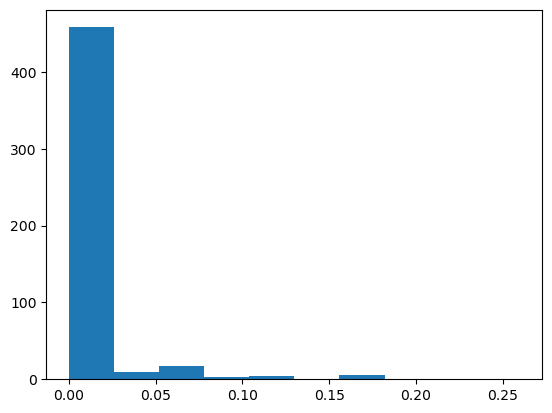

CuFeS2
[2.45527806e-02 9.75387518e-01 5.97014925e-05]


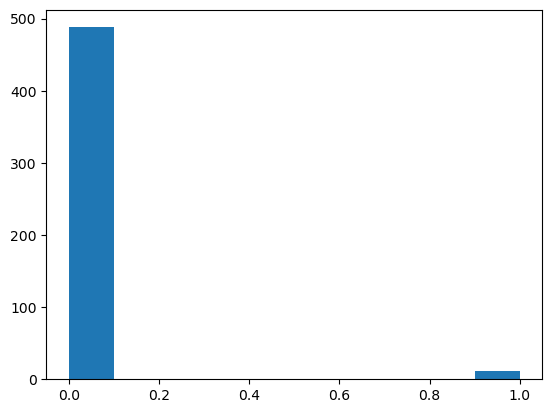

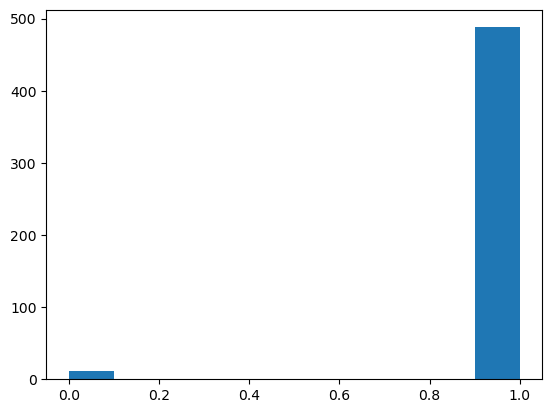

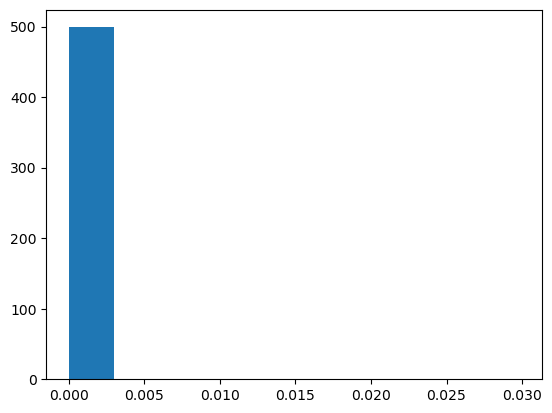

In [800]:
# train on full test set 

shifts = np.linspace(-3, 3, 31)

for mat in theory_indicies.keys():
    print(mat)

    test_rf_obj.predict_experiment_folder(mat+'/', spectra_type = 'csv', 
                                          shifts = [alignments[mat]], theory_column = 'TEAM_1_aligned_925_970', smoothings = [[15,3]], 
                                          show_hist=False, show_inputted_spectrum=False, print_details = False, show_plots=False, check_alignment = False,
                                         savefigure=False, theory_indicies = [theory_indicies[mat]])
    

    # test_rf_obj.predict_experiment_folder(mat+'/', spectra_type = 'csv', 
    #                                       shifts = shifts, theory_column = 'TEAM_1_aligned_925_970', smoothings = [[15,3]],
    #                                      print_details = False, show_hist=False, show_plots=False, theory_indicies = [theory_indicies[mat]])

    # test_rf_obj.visualize_shift(material = 'All', show_stds = False, show_table = False, savefigure=False, spectrum_type = 'XAS',
    #                            show_shift_labels = True, shift_labels = [alignments[mat]], show_true_val = True, theory_index = [theory_indicies[mat]])

LaCuTeO


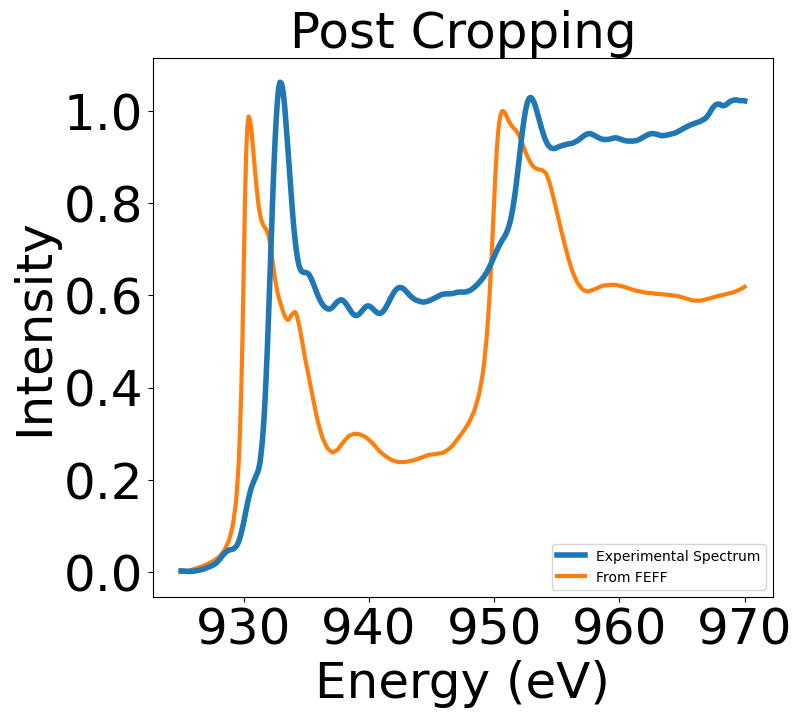

31
LaCuSeO


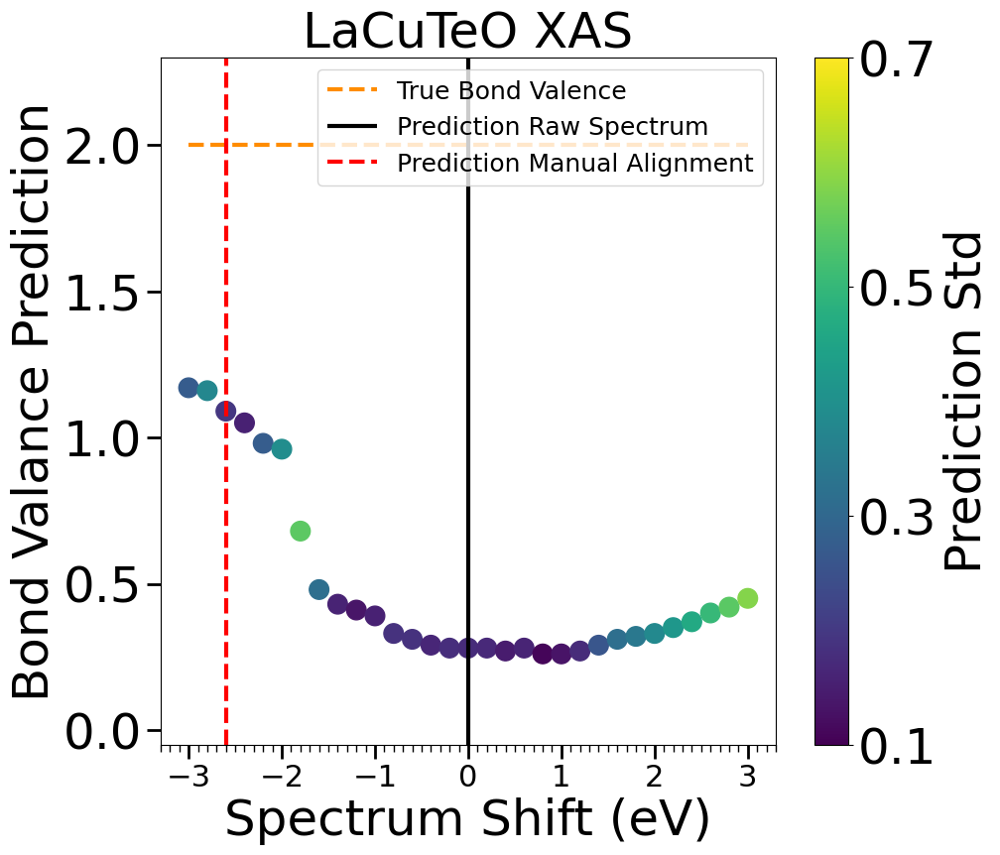

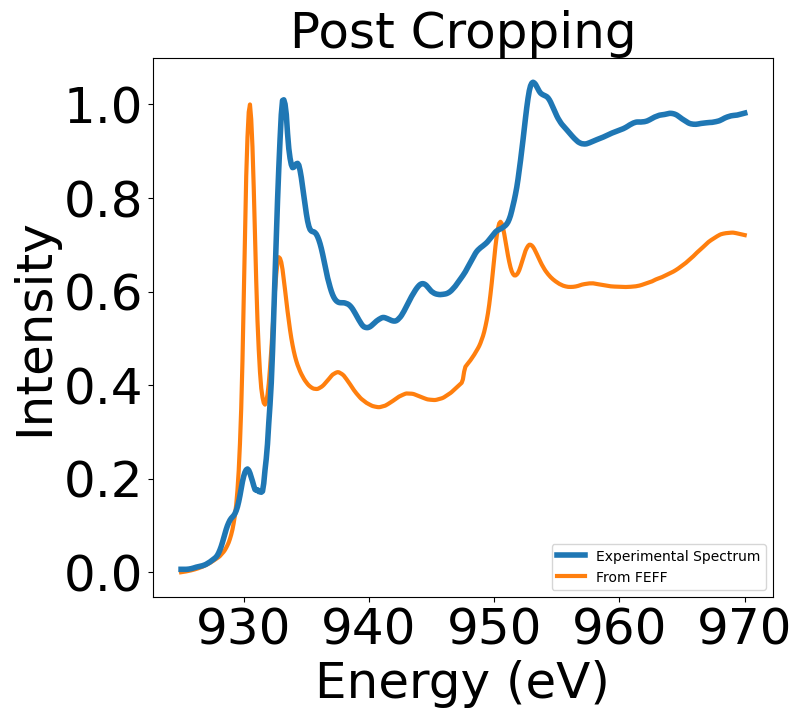

31
LaCuSO


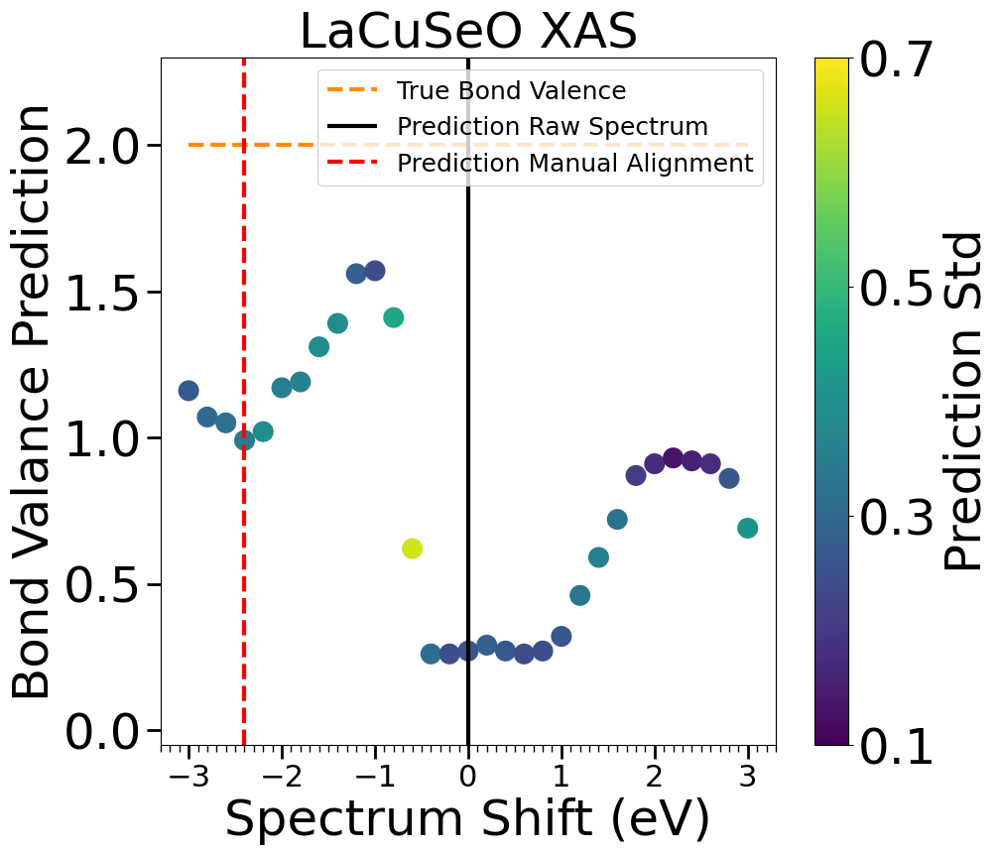

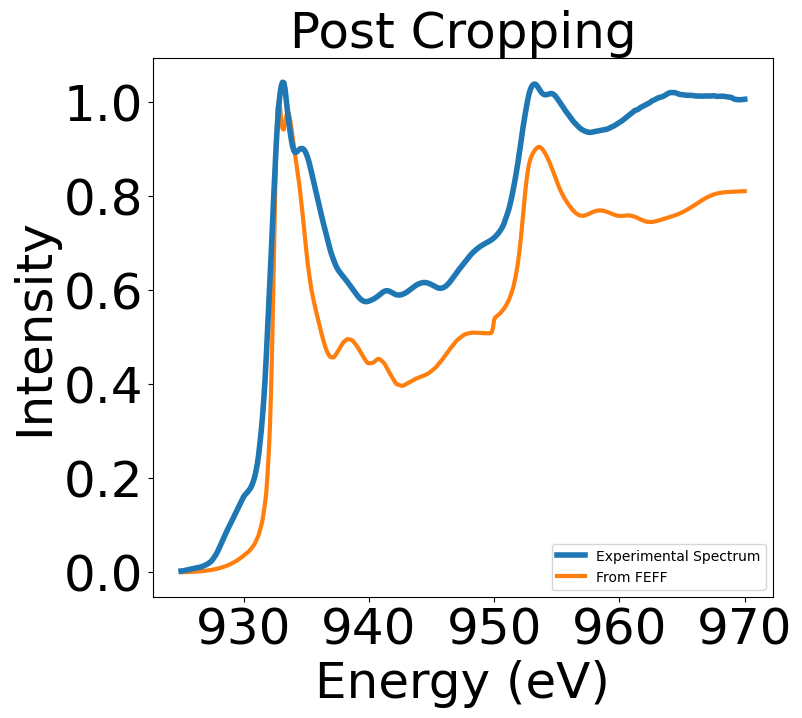

31
ZrCuSiP


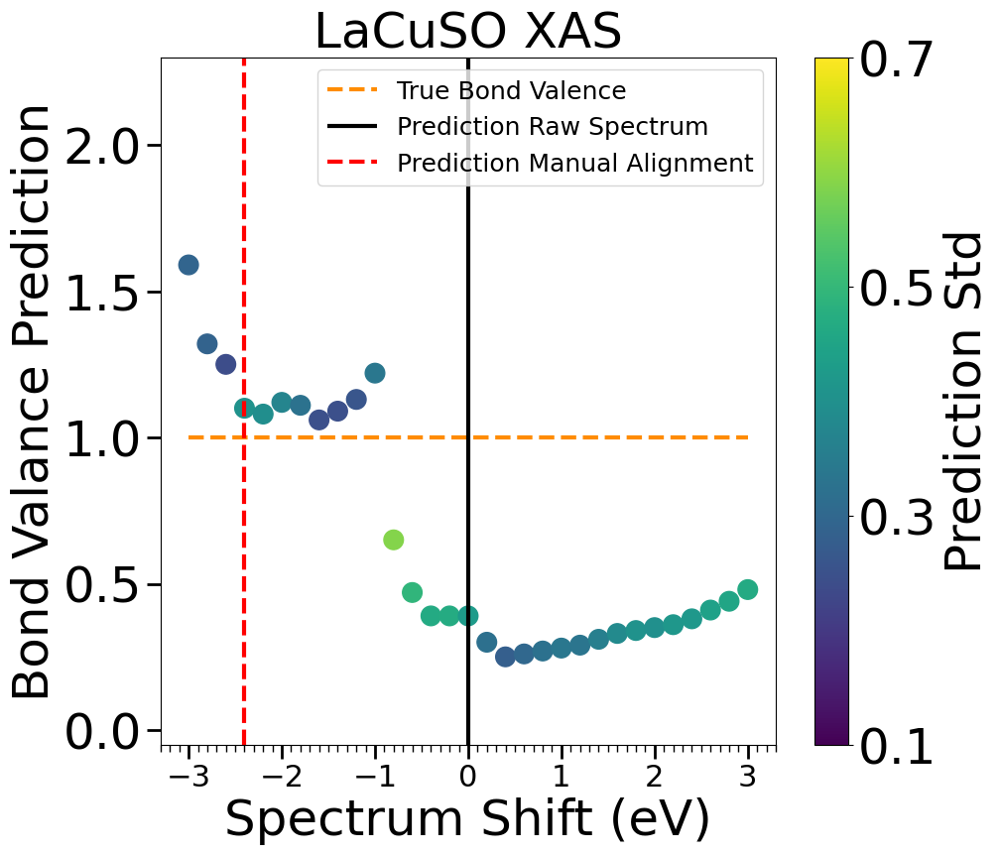

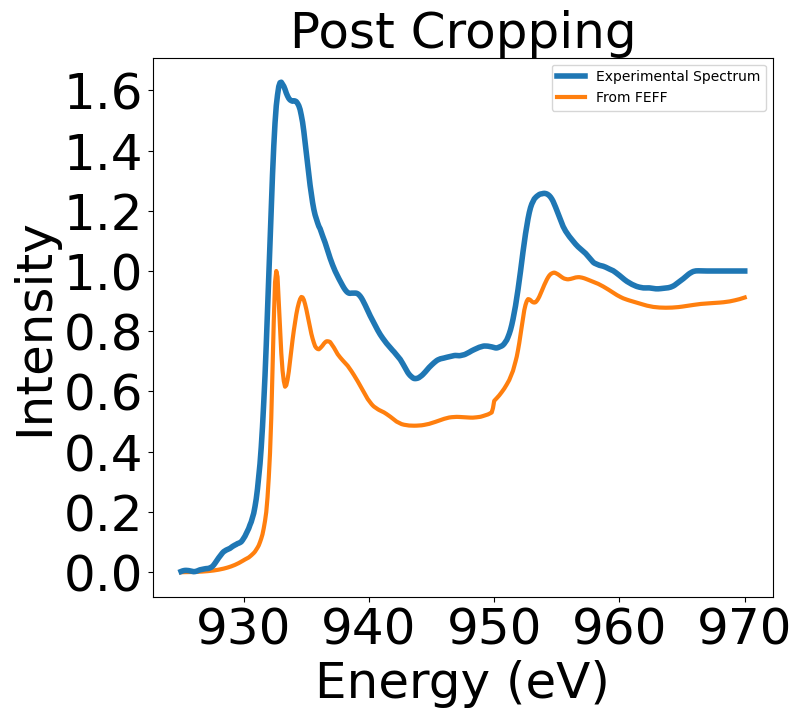

31
ZrCuSiAs


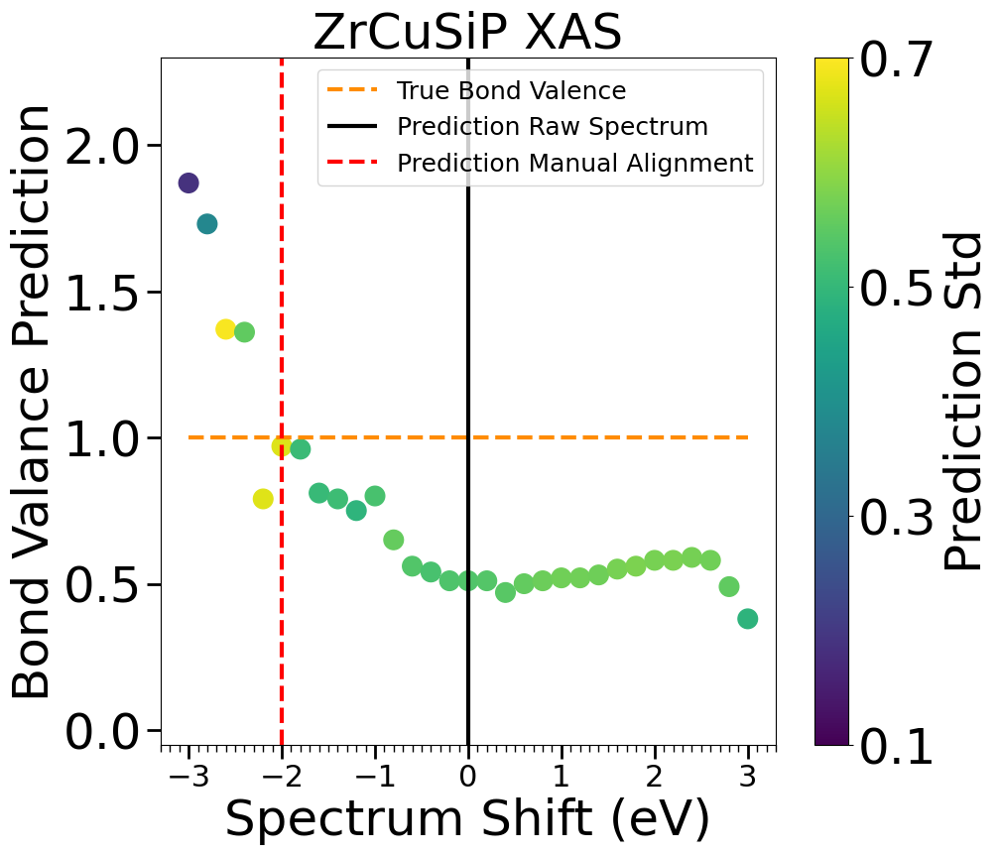

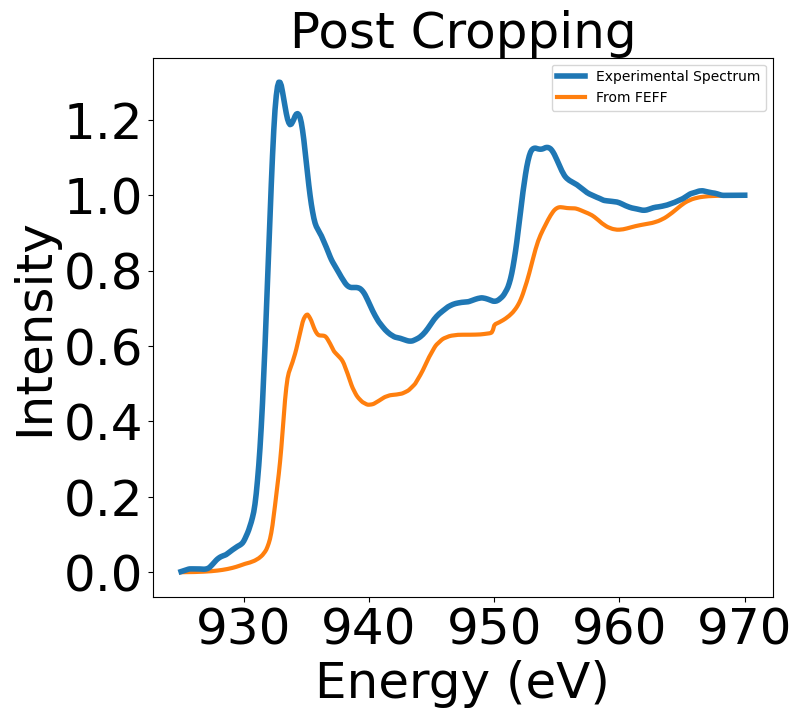

31
CuS


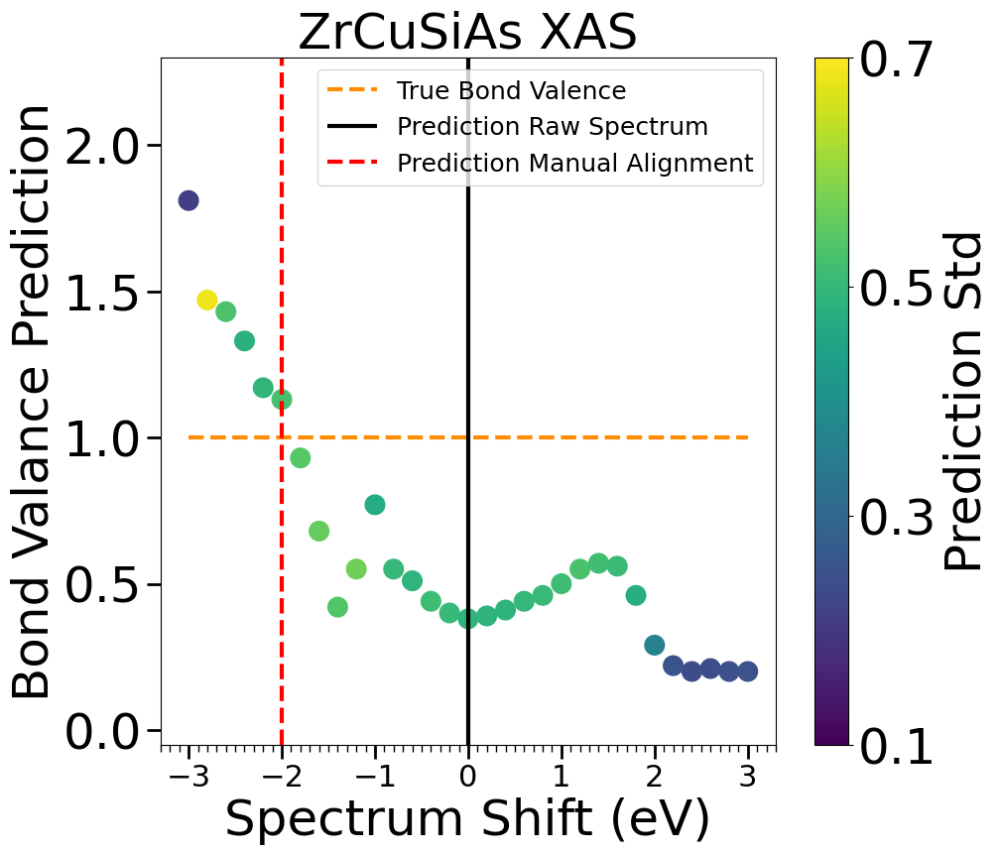

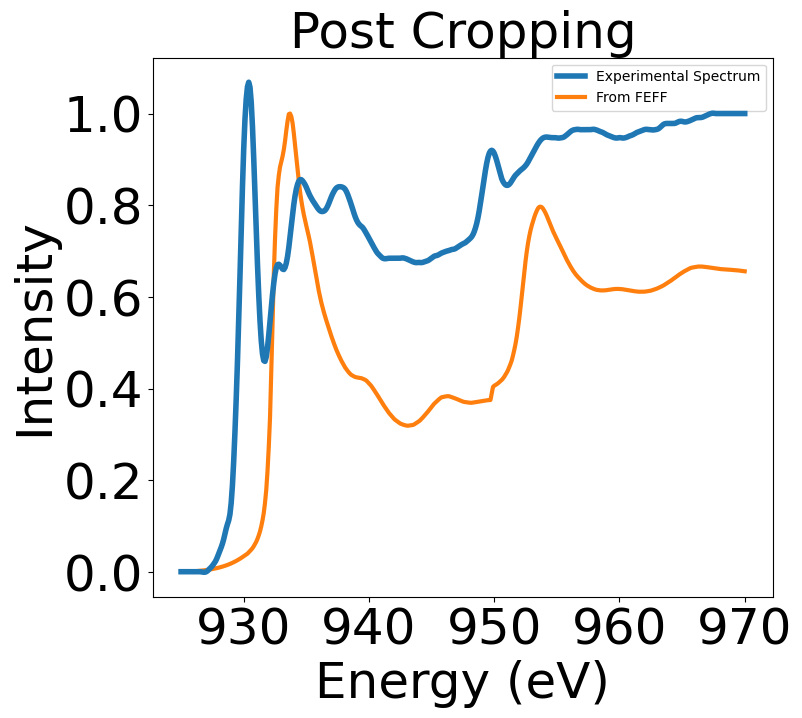

31
Cu2S


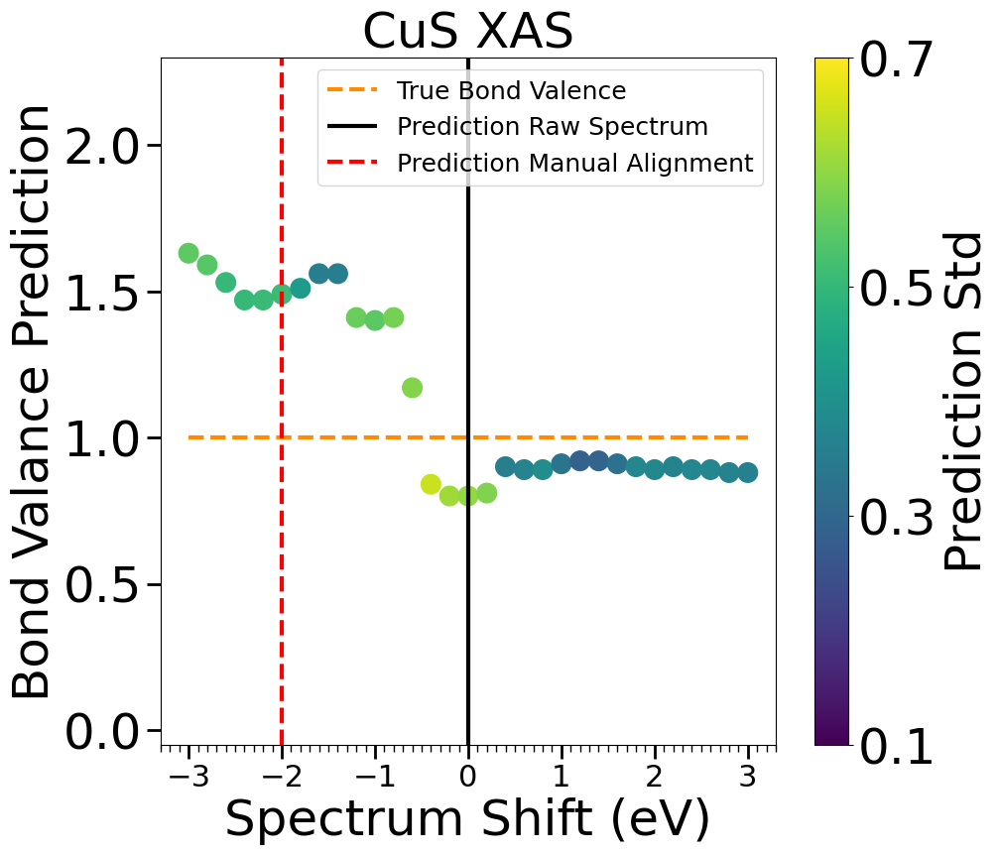

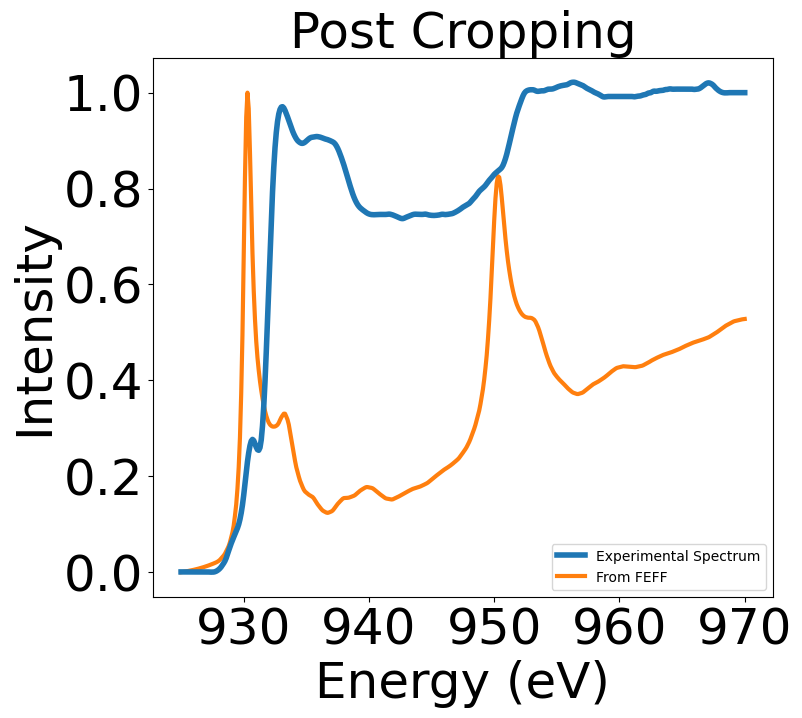

31
CuFeS2


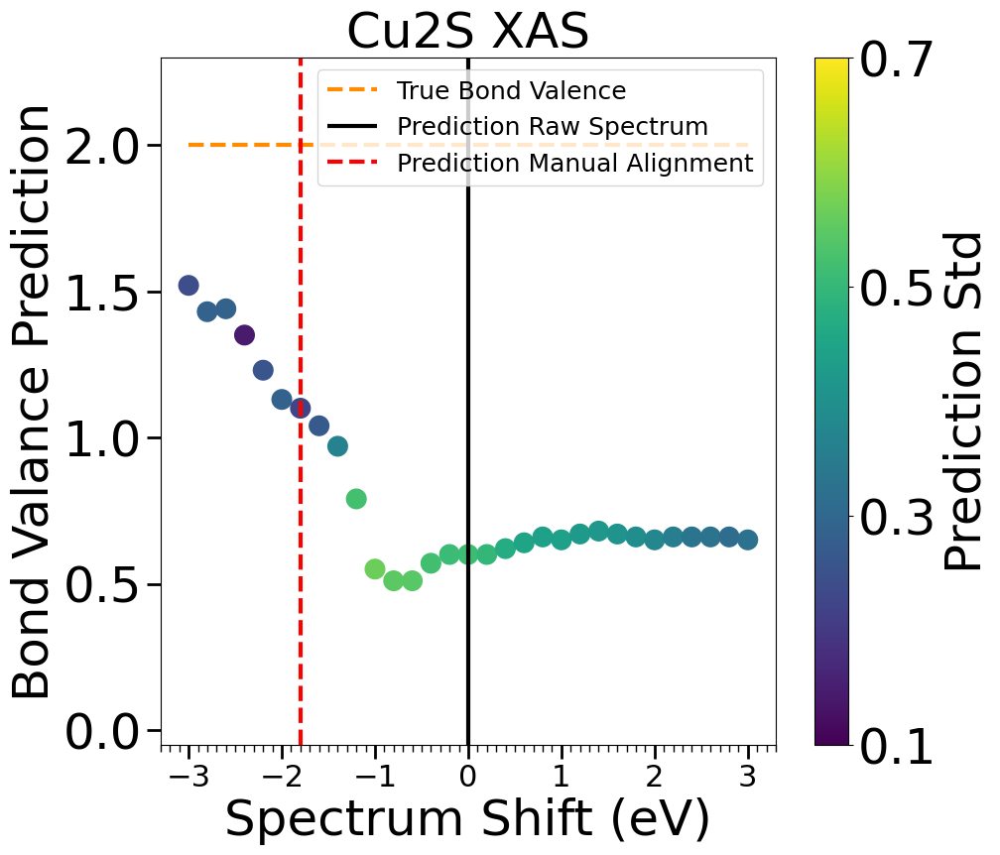

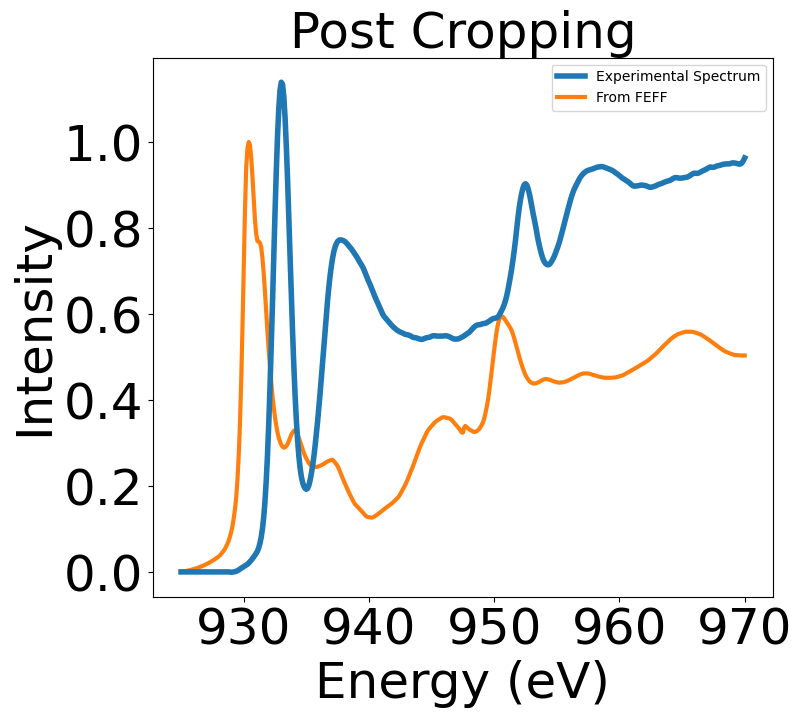

31


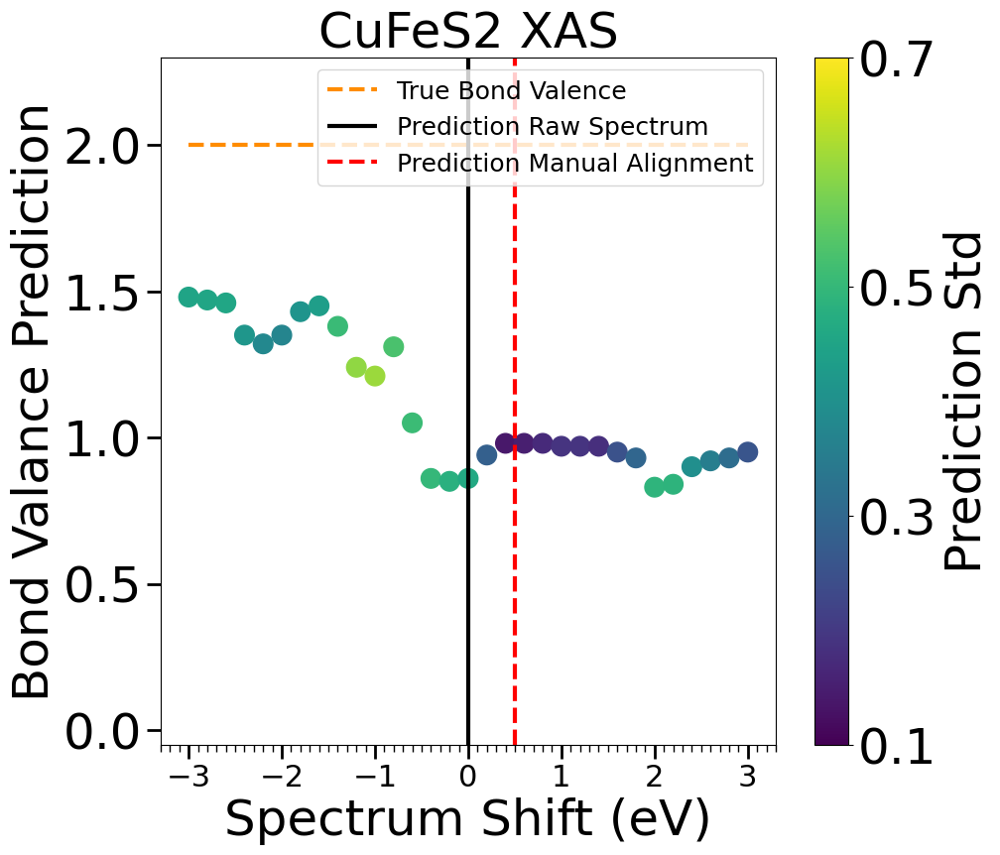

In [748]:
# original train test split

shifts = np.linspace(-3, 3, 31)

for mat in theory_indicies.keys():
    print(mat)
    test_rf_obj.predict_experiment_folder(mat+'/', spectra_type = 'csv', 
                                          shifts = [alignments[mat]], theory_column = 'TEAM_1_aligned_925_970', smoothings = [[15,3]], 
                                          show_hist=False, show_inputted_spectrum=False, print_details = False, show_plots=False, check_alignment = True,
                                         savefigure=False, theory_indicies = [theory_indicies[mat]])
    


    test_rf_obj.predict_experiment_folder(mat+'/', spectra_type = 'csv', 
                                          shifts = shifts, theory_column = 'TEAM_1_aligned_925_970', smoothings = [[15,3]],
                                          print_details = False, show_hist=False, show_plots=False, theory_indicies = [theory_indicies[mat]])

    test_rf_obj.visualize_shift(material = 'All', show_stds = False, show_table = False, savefigure=False, spectrum_type = 'XAS',
                               show_shift_labels = True, shift_labels = [alignments[mat]], show_true_val = True, theory_index = [theory_indicies[mat]])

Predicting From LaCuTeO\LaCuOTe.csv
Energy Axis Shift = -2.6
Smoothing Parameters = [15, 3]


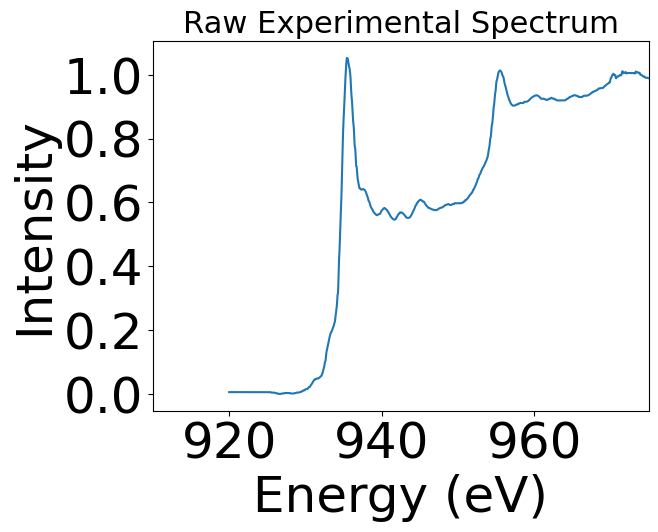

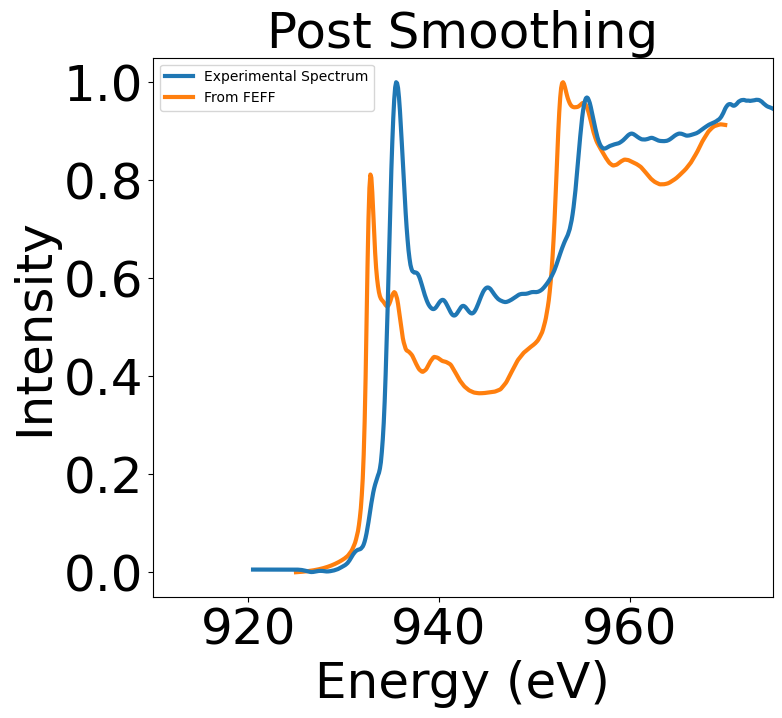

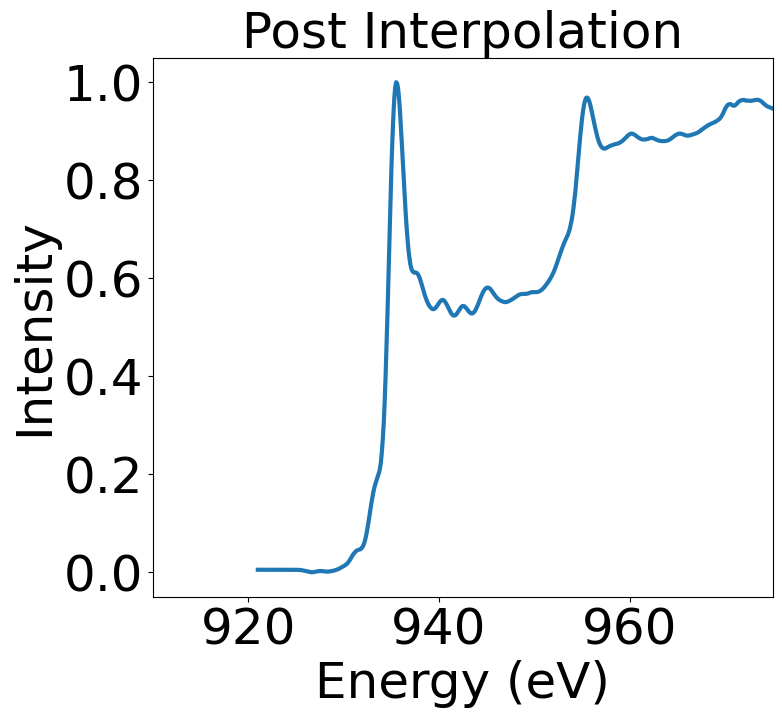

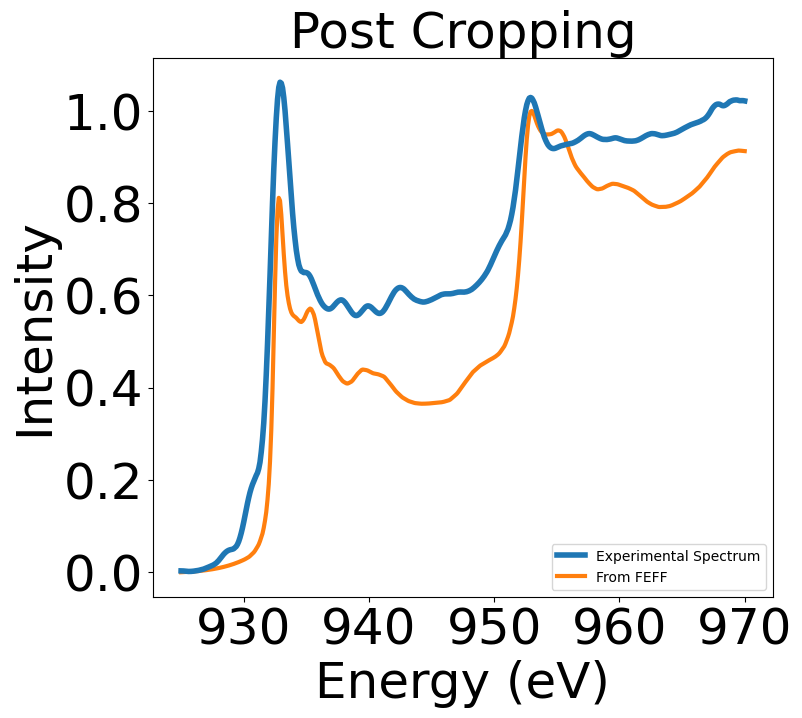

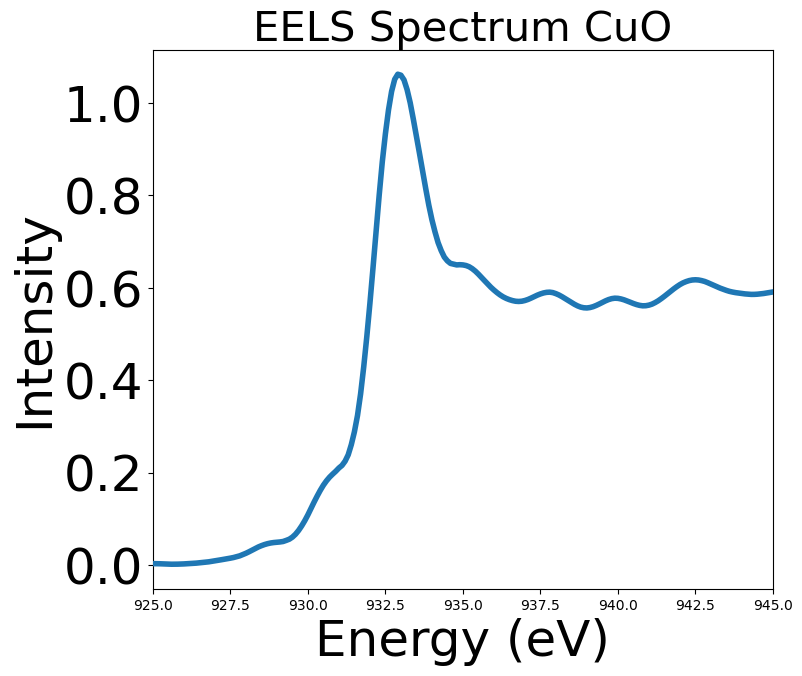

0.0
Prediction Median = 1.2
prediction = 1.15
prediction std = 0.28
 


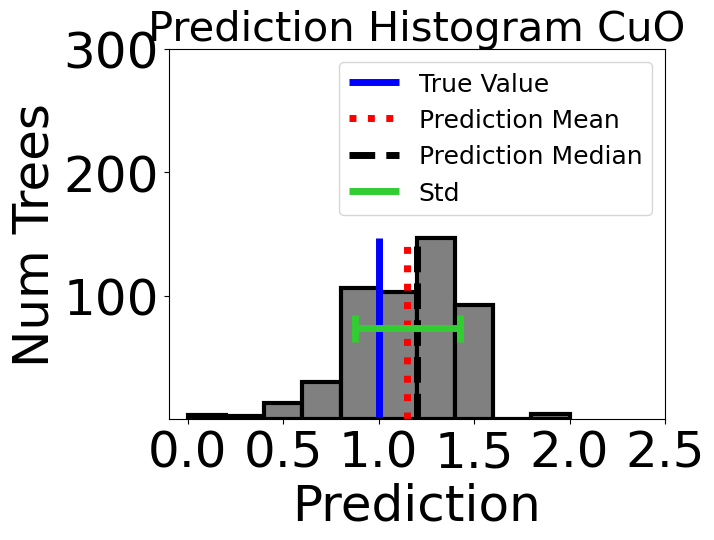

In [231]:
test_rf_obj.predict_experiment_folder('LaCuTeO/', spectra_type = 'csv', 
                                      shifts = [-2.6], theory_column = 'TEAM_1_aligned_925_970', smoothings = [[15,3]], 
                                      show_hist=True, show_inputted_spectrum=False, print_details = True, show_plots=True,
                                     savefigure=False, theory_indicies = [591, 591, 591])

61


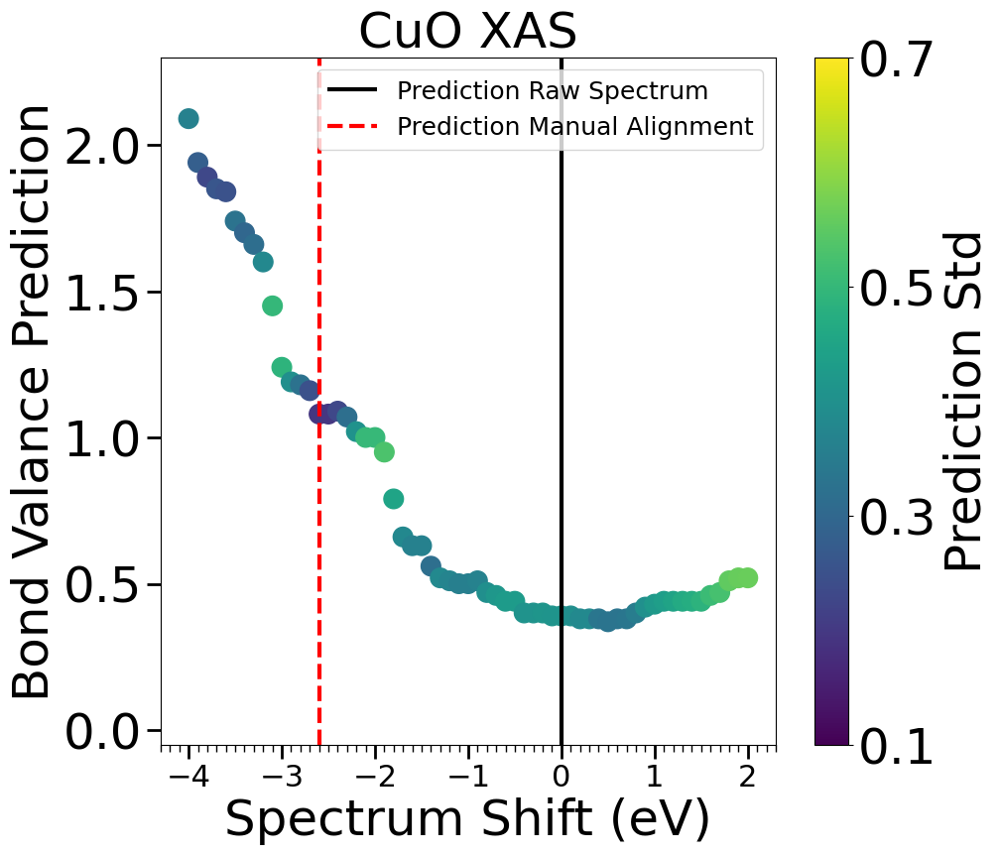

In [233]:
shifts = np.linspace(-4, 2, 61)


test_rf_obj.predict_experiment_folder('LaCuTeO/', spectra_type = 'csv', 
                                      shifts = shifts, theory_column = 'TEAM_1_aligned_925_970', smoothings = [[15,3]],
                                     print_details = False, show_hist=False, show_plots=False, theory_indicies = [591, 591, 591])

test_rf_obj.visualize_shift(material = 'All', show_stds = False, show_table = False, savefigure=False, spectrum_type = 'XAS',
                           show_shift_labels = True, shift_labels = [-2.6])

Predicting From LaCuSeO\LaCuOSe.csv
Energy Axis Shift = -2.4
Smoothing Parameters = [15, 3]


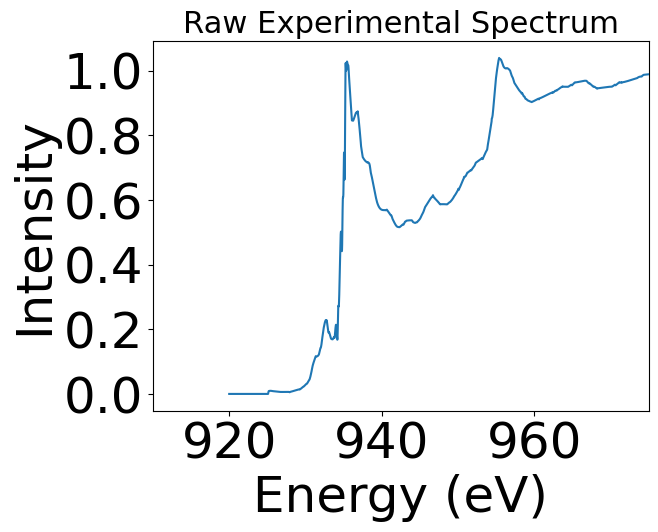

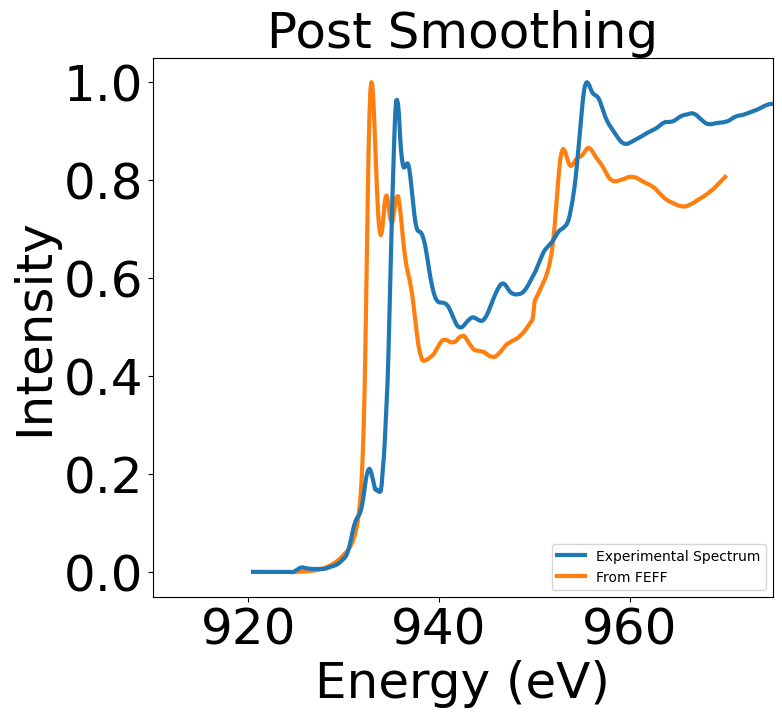

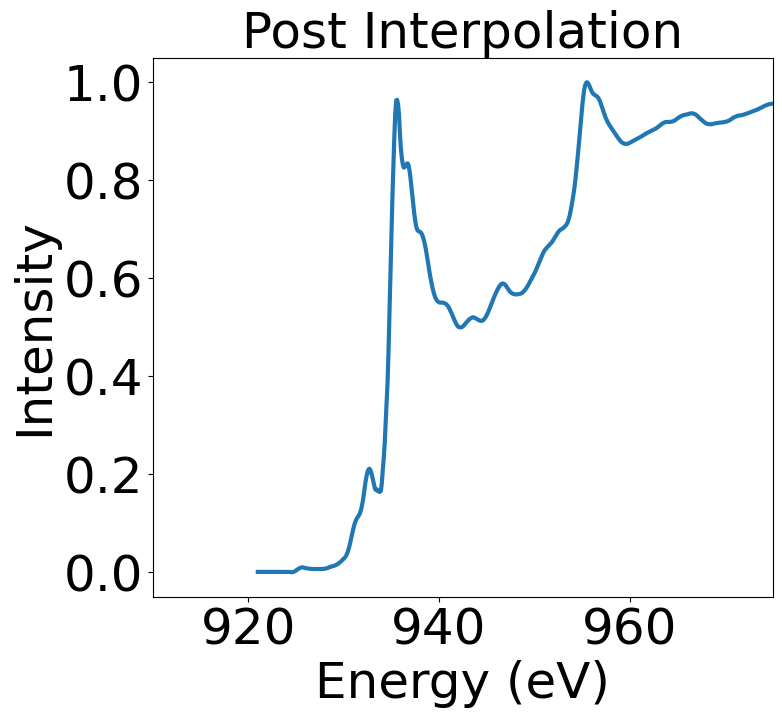

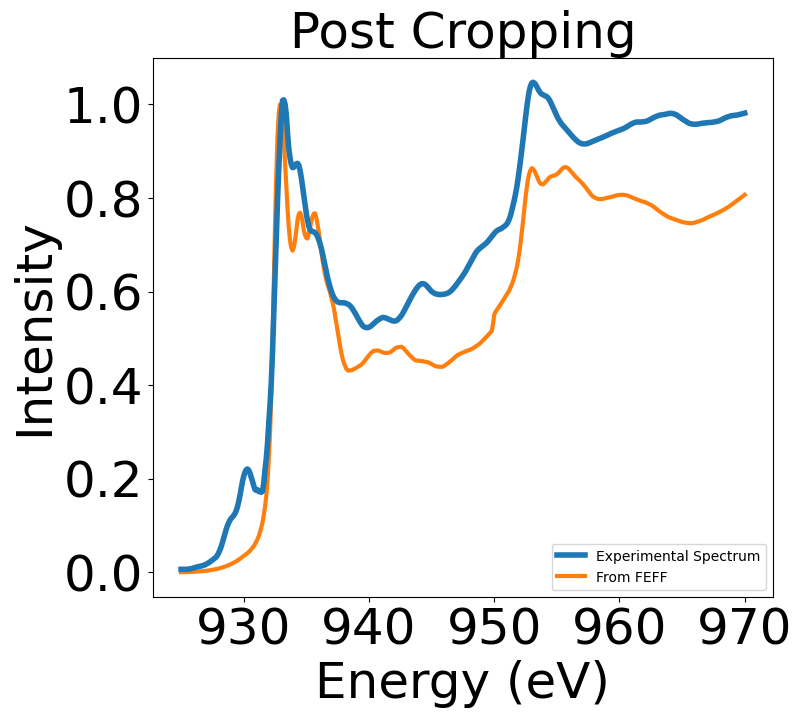

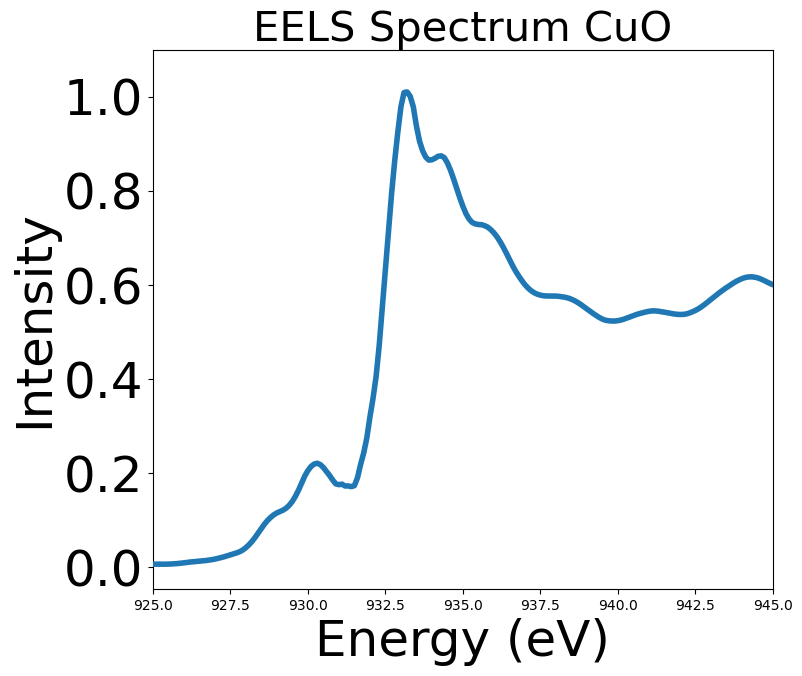

0.0
Prediction Median = 1.12
prediction = 1.06
prediction std = 0.47
 


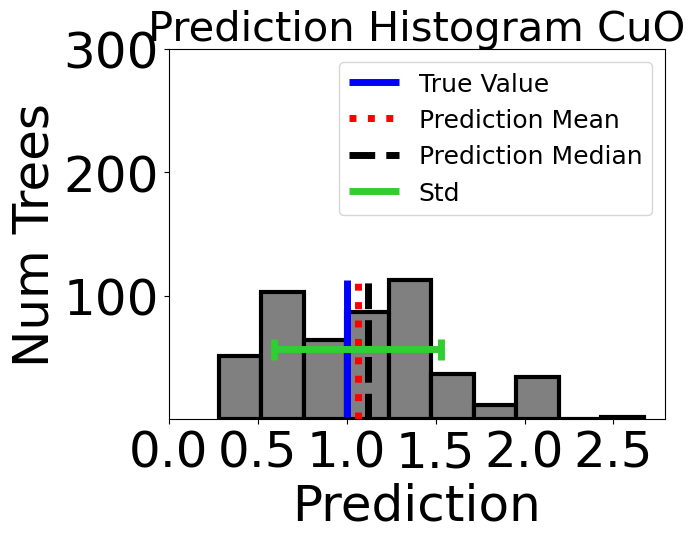

In [227]:
test_rf_obj.predict_experiment_folder('LaCuSeO/', spectra_type = 'csv', 
                                      shifts = [-2.4], theory_column = 'TEAM_1_aligned_925_970', smoothings = [[15,3]], 
                                      show_hist=True, show_inputted_spectrum=False, print_details = True, show_plots=True,
                                     savefigure=False, theory_indicies = [2433, 2433, 2433])

Predicting From LaCuSO\LaCuOS.csv
Energy Axis Shift = -2.4
Smoothing Parameters = [15, 3]


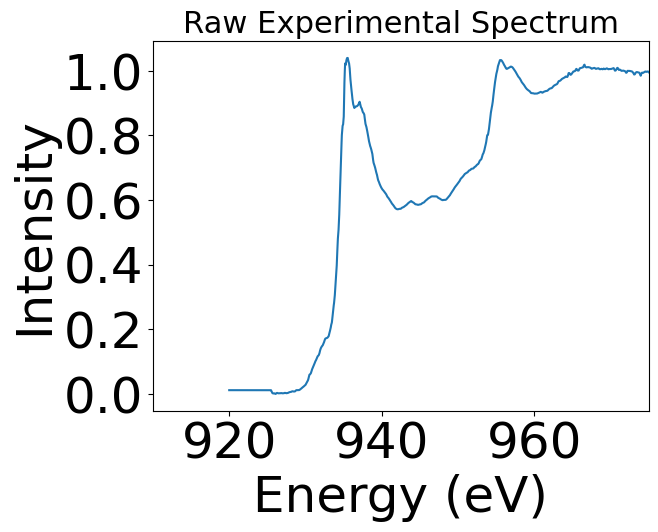

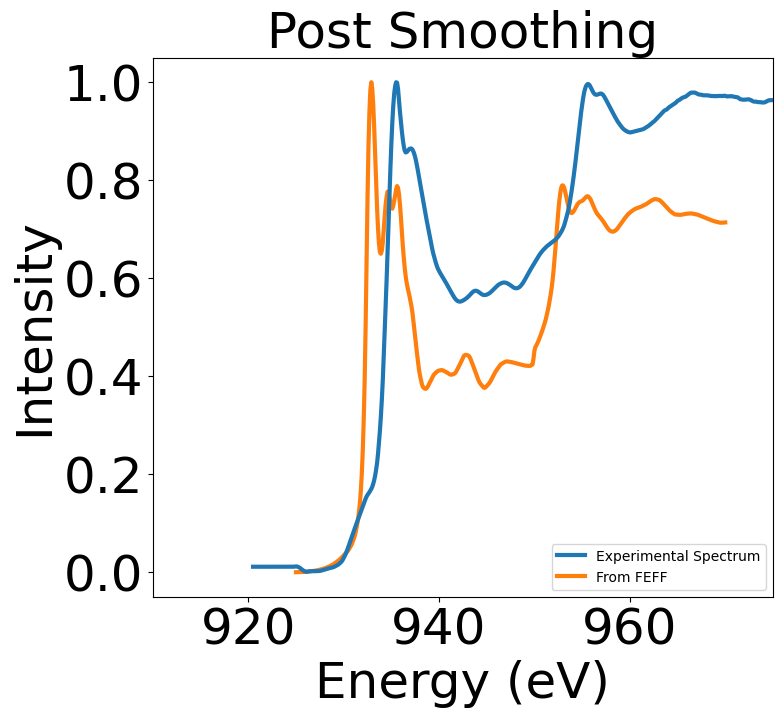

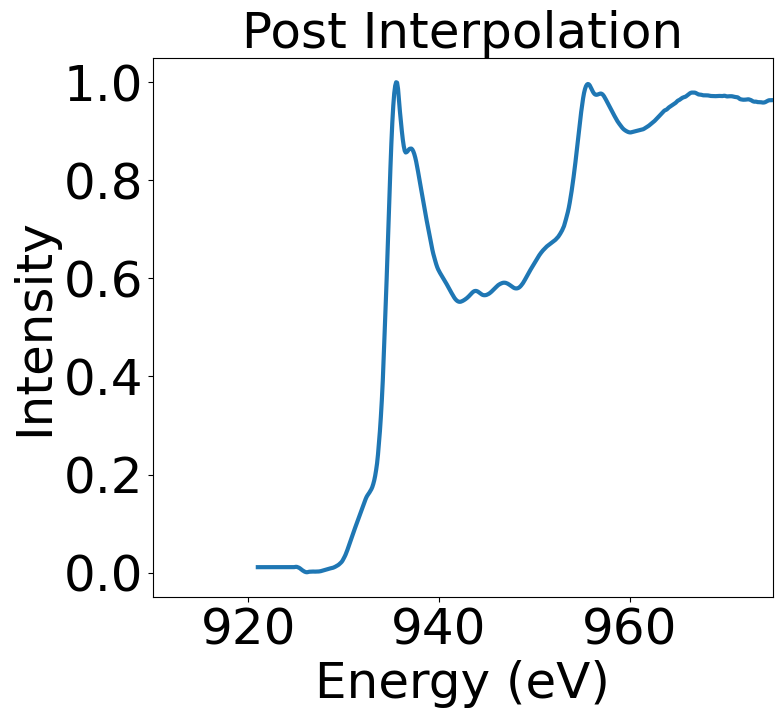

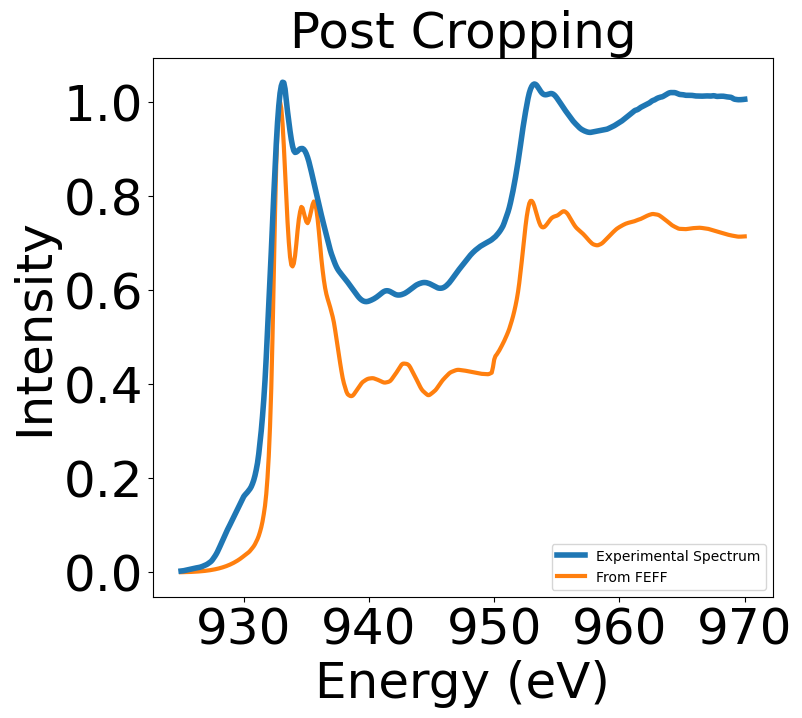

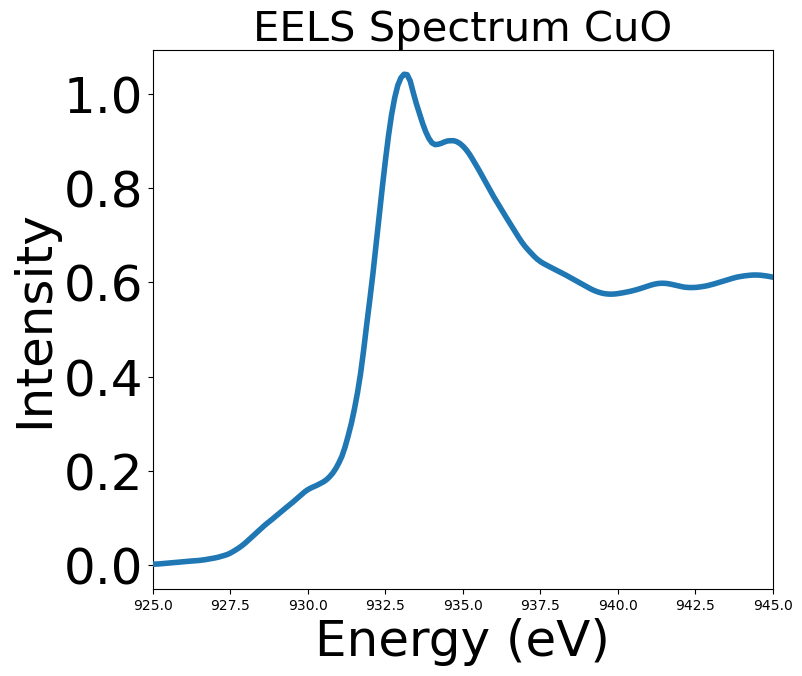

0.0
Prediction Median = 1.25
prediction = 1.2
prediction std = 0.36
 


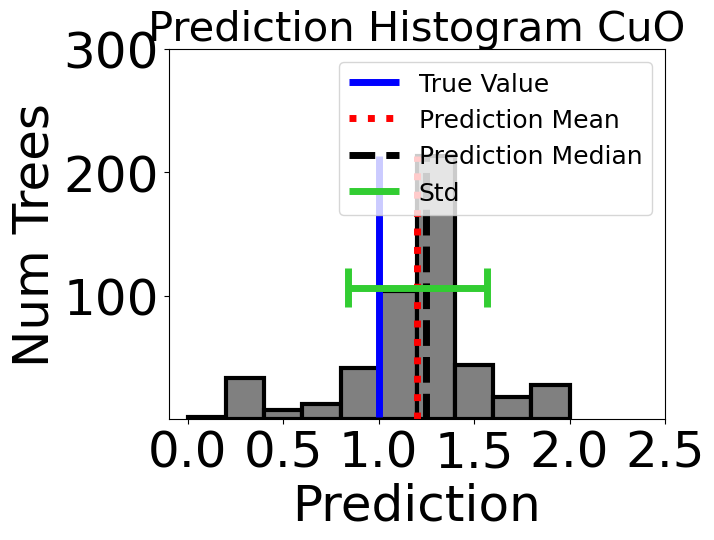

In [228]:
test_rf_obj.predict_experiment_folder('LaCuSO/', spectra_type = 'csv', 
                                      shifts = [-2.4], theory_column = 'TEAM_1_aligned_925_970', smoothings = [[15,3]], 
                                      show_hist=True, show_inputted_spectrum=False, print_details = True, show_plots=True,
                                     savefigure=False, theory_indicies = [2294, 2294, 2294])

61


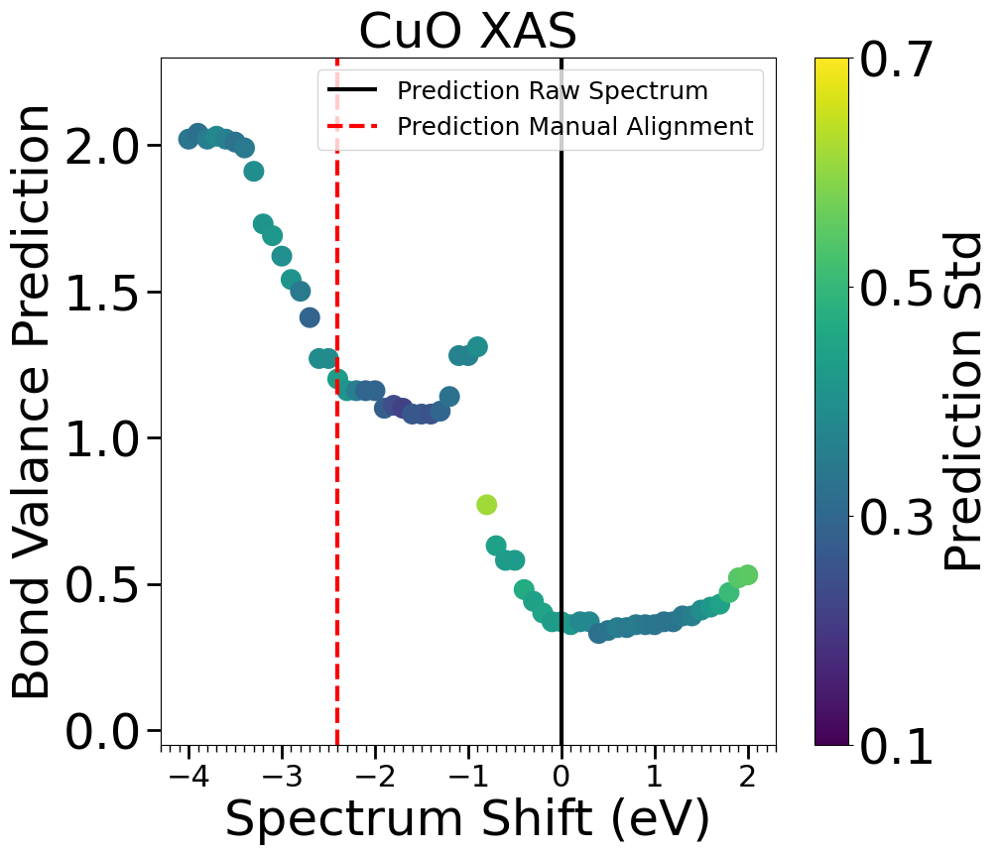

In [235]:
shifts = np.linspace(-4, 2, 61)


test_rf_obj.predict_experiment_folder('LaCuSO/', spectra_type = 'csv', 
                                      shifts = shifts, theory_column = 'TEAM_1_aligned_925_970', smoothings = [[15,3]],
                                     print_details = False, show_hist=False, show_plots=False, theory_indicies = [2294, 2294, 2294])

test_rf_obj.visualize_shift(material = 'All', show_stds = False, show_table = False, savefigure=False, spectrum_type = 'XAS',
                           show_shift_labels = True, shift_labels = [-2.4])

Predicting From ZrCuSiP\ZrCuSiP.csv
Energy Axis Shift = -2
Smoothing Parameters = [15, 3]


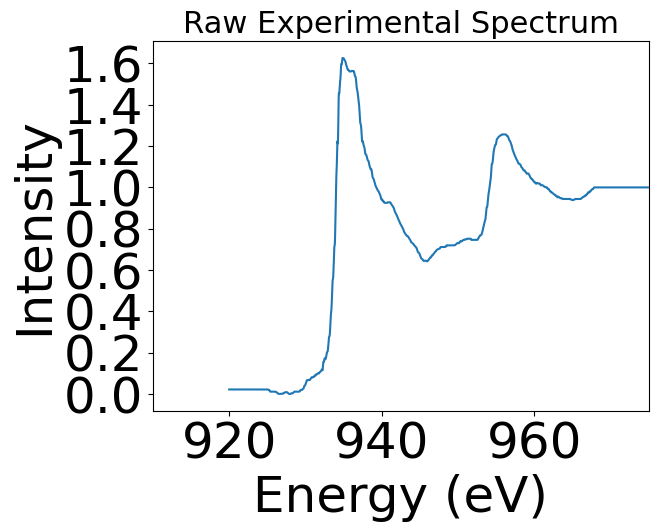

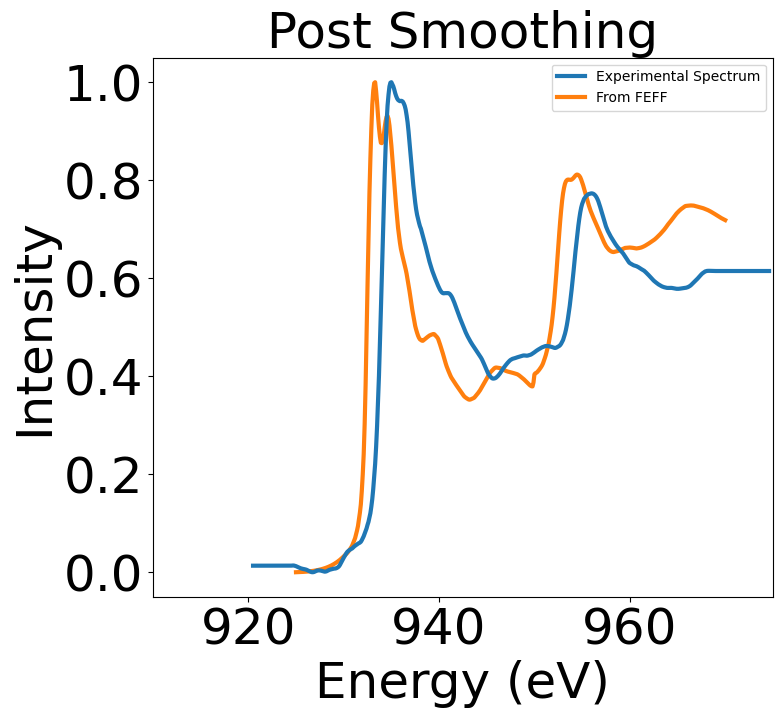

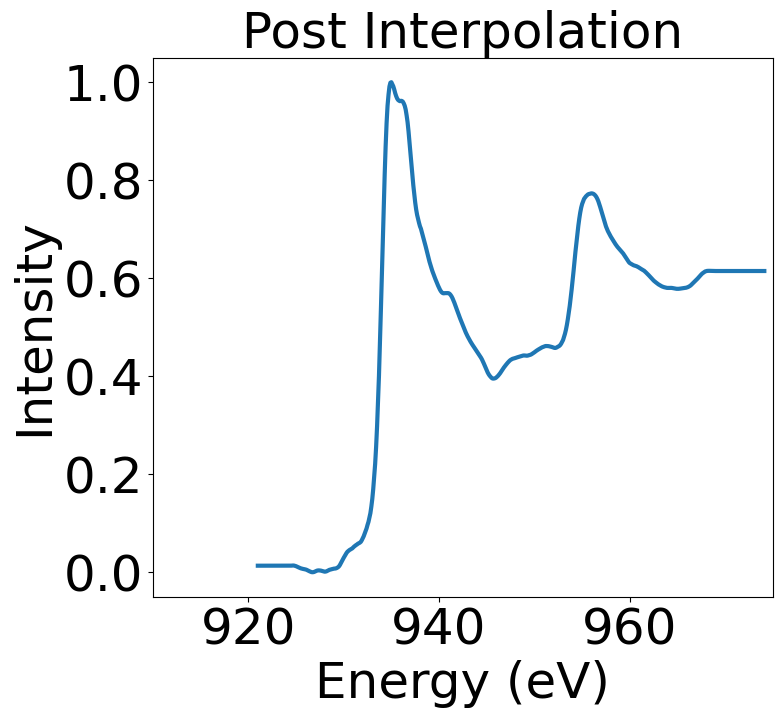

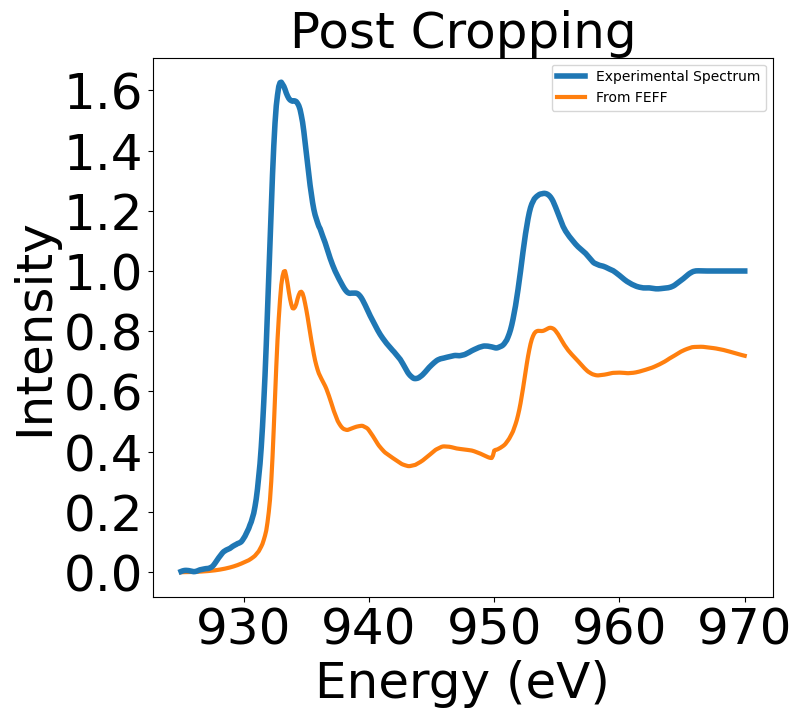

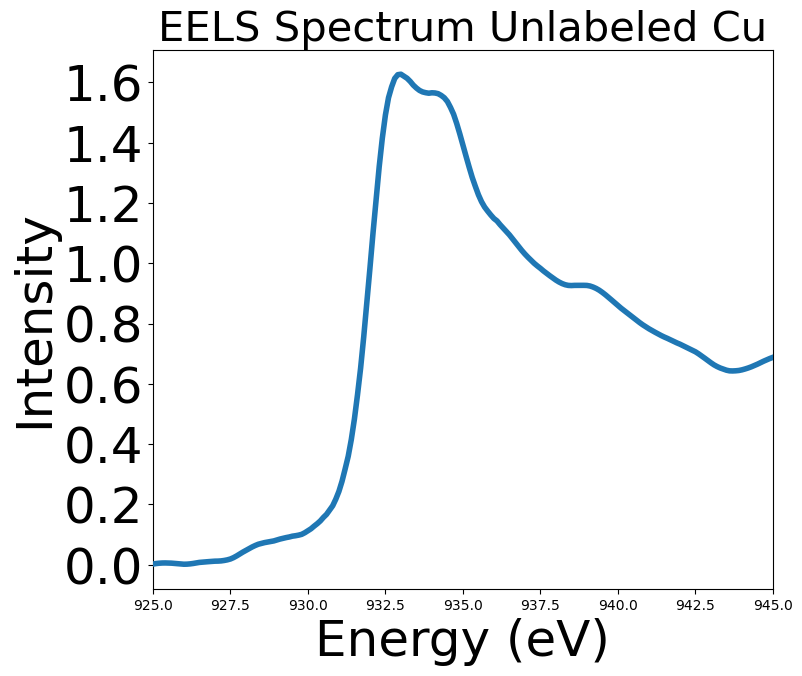

Prediction Median = 1.0
prediction = 0.95
prediction std = 0.52
 


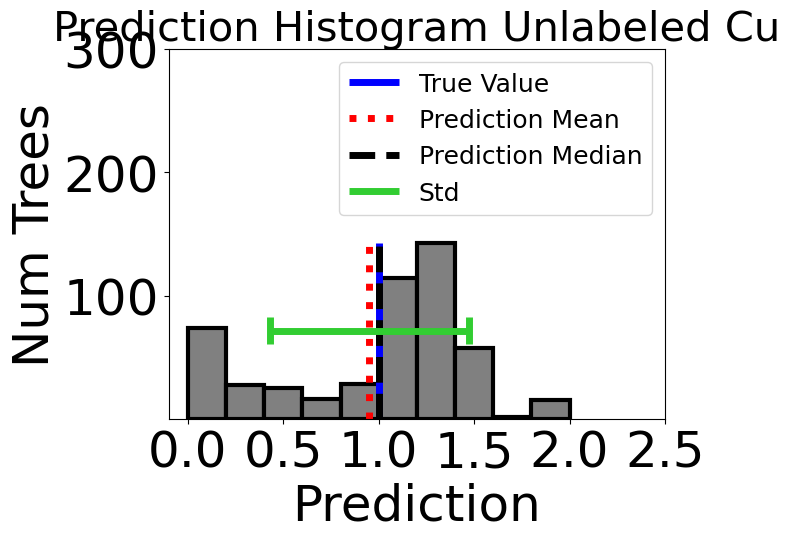

In [210]:
test_rf_obj.predict_experiment_folder('ZrCuSiP/', spectra_type = 'csv', 
                                      shifts = [-2], theory_column = 'TEAM_1_aligned_925_970', smoothings = [[15,3]], 
                                      show_hist=True, show_inputted_spectrum=False, print_details = True, show_plots=True,
                                     savefigure=False, theory_indicies = [2152])

Predicting From ZrCuSiAs\ZrCuSiAs.csv
Energy Axis Shift = -2
Smoothing Parameters = [15, 3]


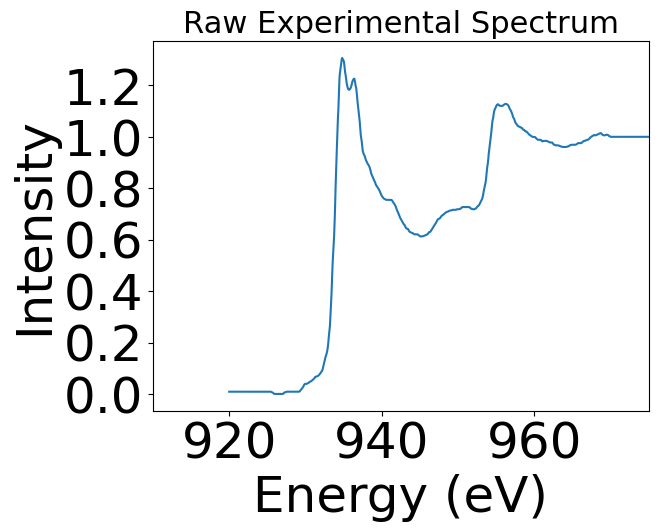

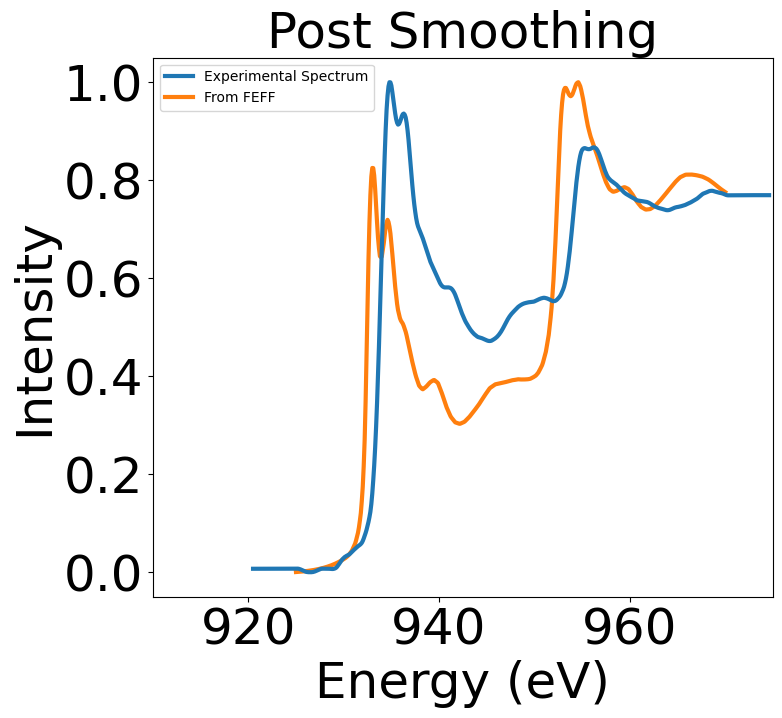

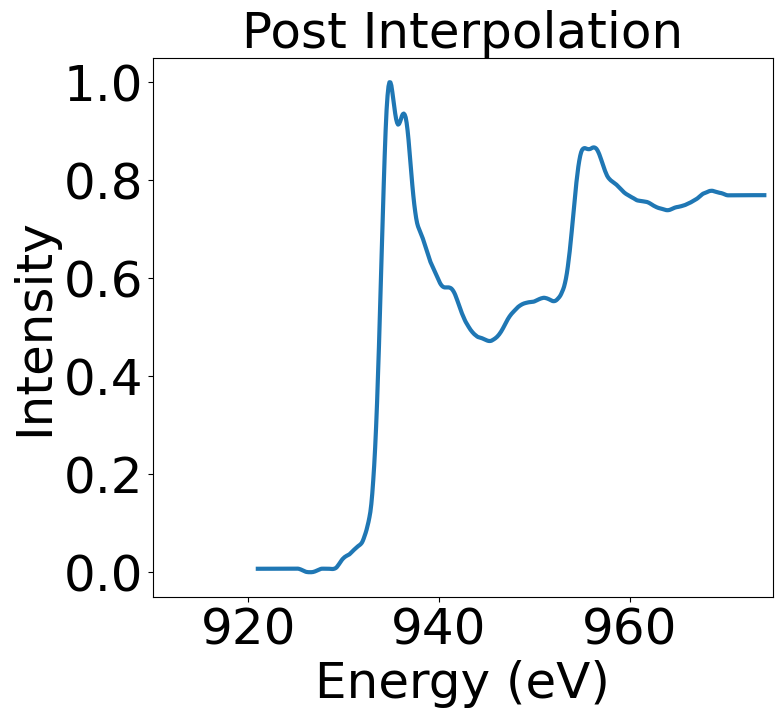

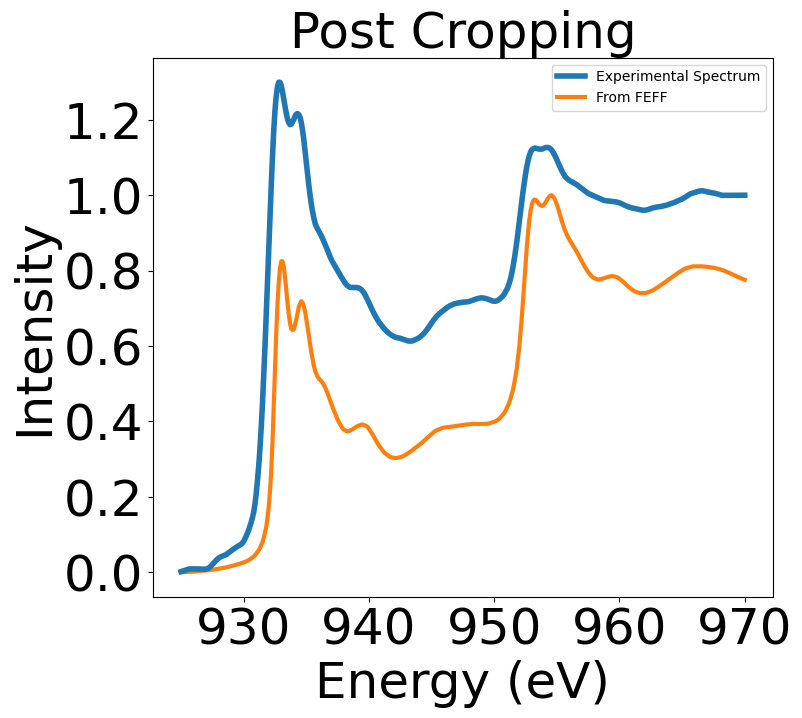

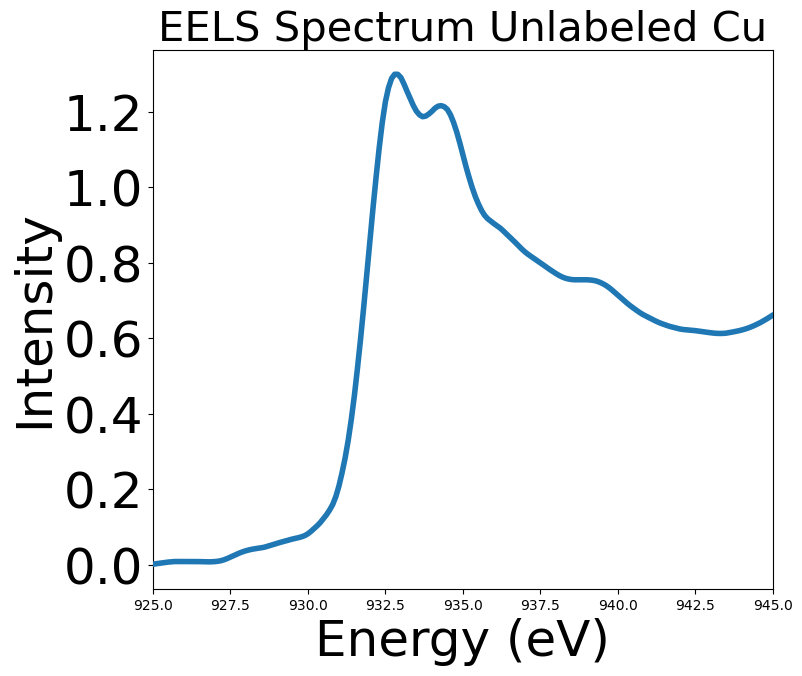

Prediction Median = 1.25
prediction = 1.09
prediction std = 0.47
 


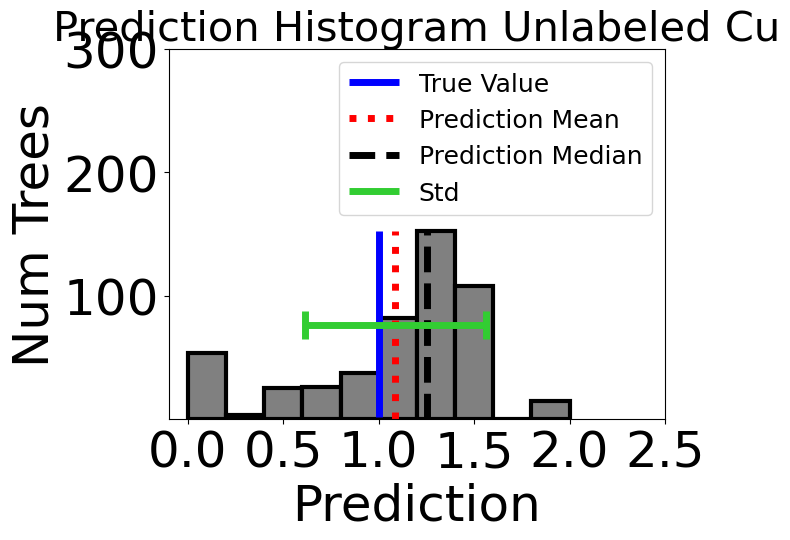

In [207]:
test_rf_obj.predict_experiment_folder('ZrCuSiAs/', spectra_type = 'csv', 
                                      shifts = [-2], theory_column = 'TEAM_1_aligned_925_970', smoothings = [[15,3]], 
                                      show_hist=True, show_inputted_spectrum=False, print_details = True, show_plots=True,
                                     savefigure=False, theory_indicies = [2014])

Predicting From CuS\CuS.csv
Energy Axis Shift = -2
Smoothing Parameters = [15, 3]


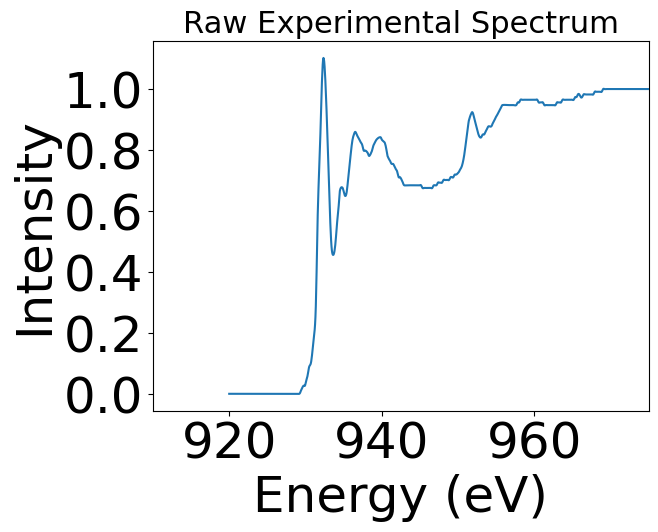

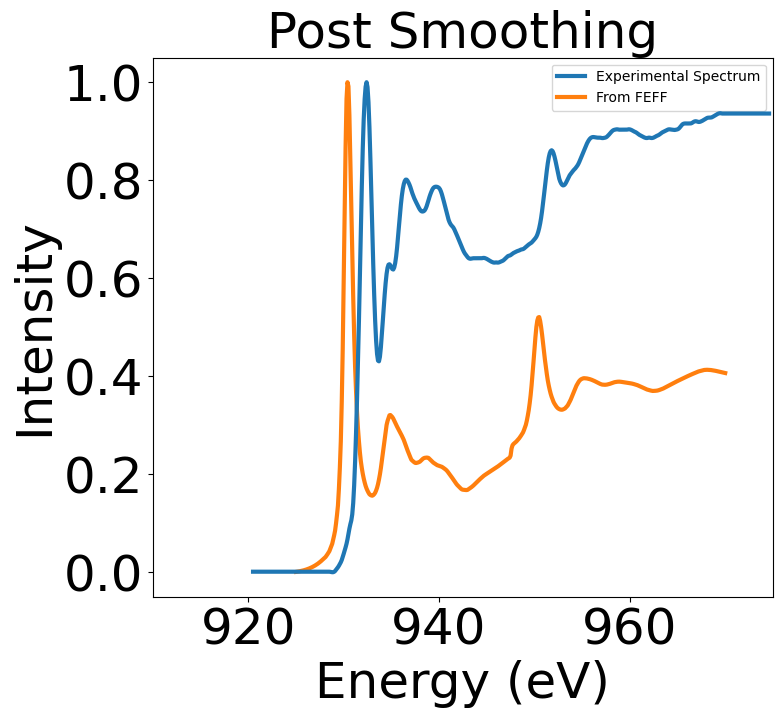

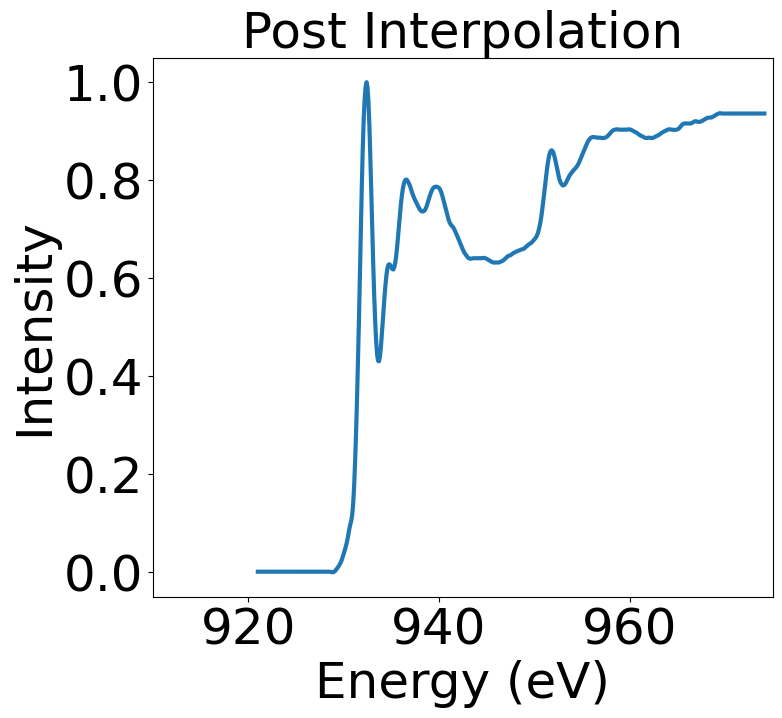

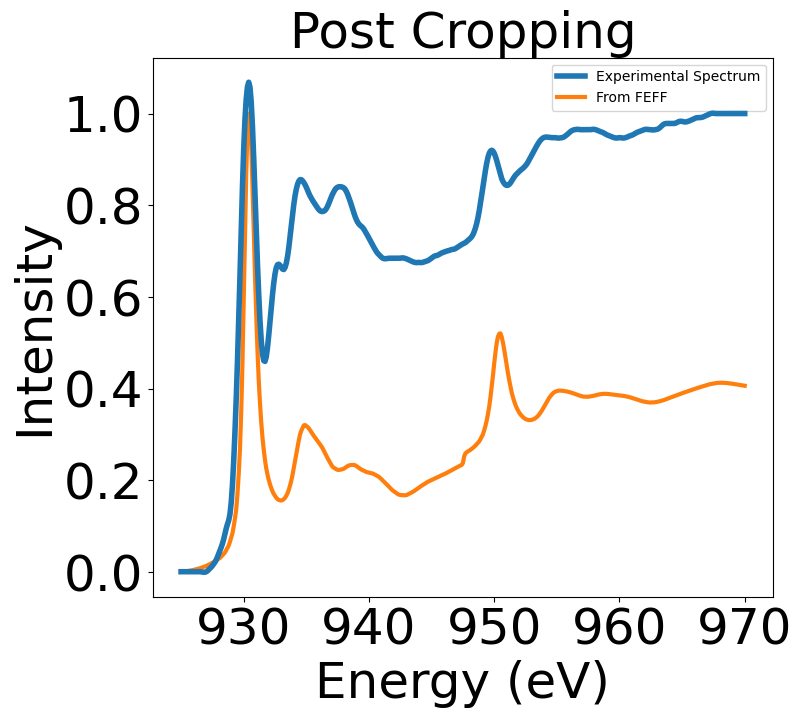

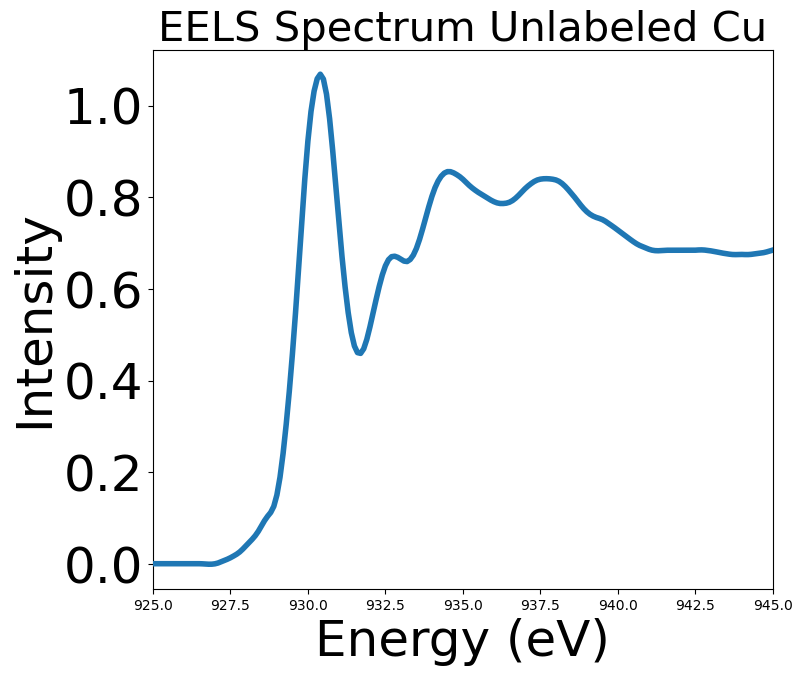

0.0
Prediction Median = 1.48
prediction = 1.5
prediction std = 0.29
 


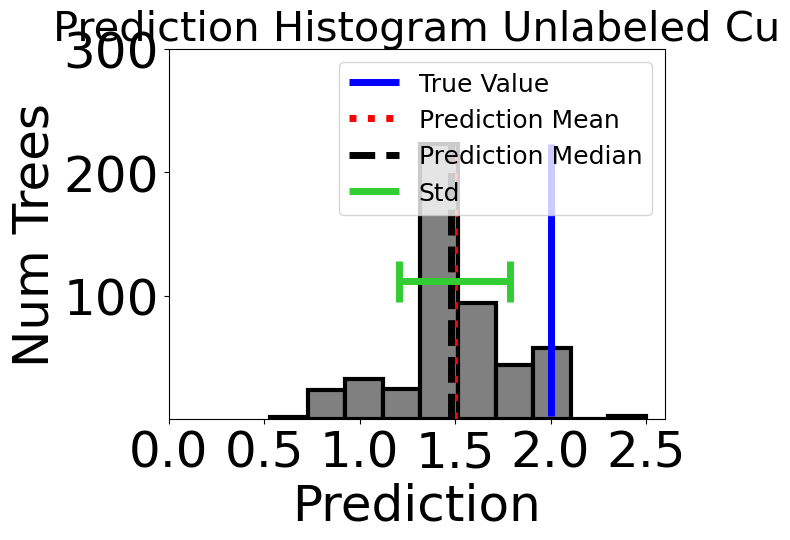

In [237]:
test_rf_obj.predict_experiment_folder('CuS/', spectra_type = 'csv', 
                                      shifts = [-2], theory_column = 'TEAM_1_aligned_925_970', smoothings = [[15,3]], 
                                      show_hist=True, show_inputted_spectrum=False, print_details = False, show_plots=True,
                                     savefigure=False, theory_indicies = [2488])

[0.29617558 0.69556343 0.00826099]


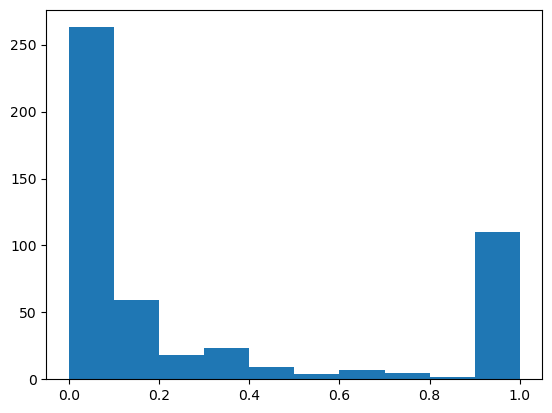

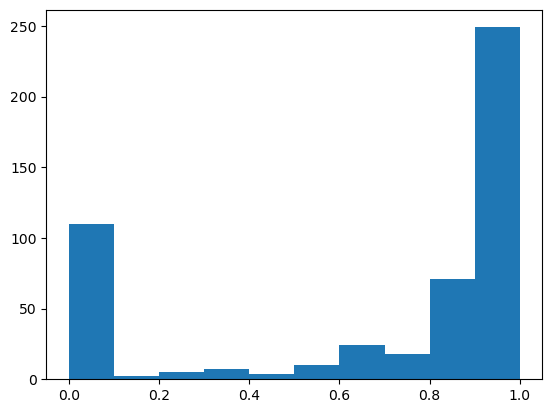

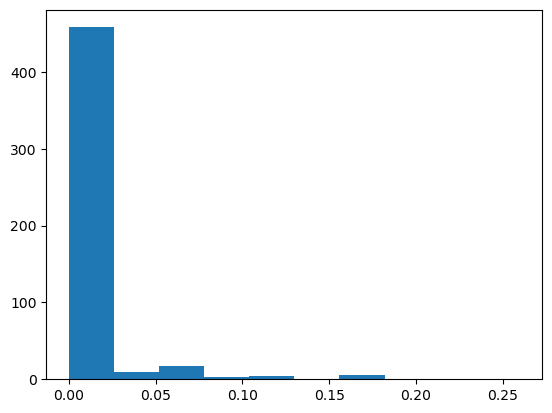

In [576]:
test_rf_obj.predict_experiment_folder('Cu2S/', spectra_type = 'csv', 
                                      shifts = [-1.8], theory_column = 'TEAM_1_aligned_925_970', smoothings = [[15,3]], 
                                      show_hist=False, show_inputted_spectrum=False, print_details = False, show_plots=False,
                                     savefigure=False, theory_indicies = [745])

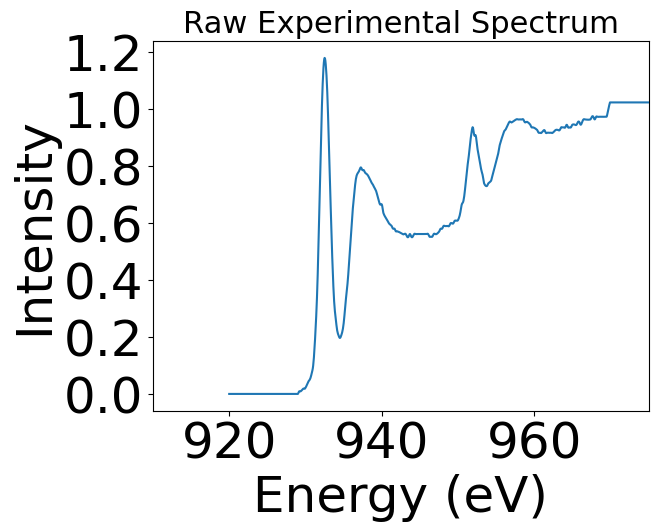

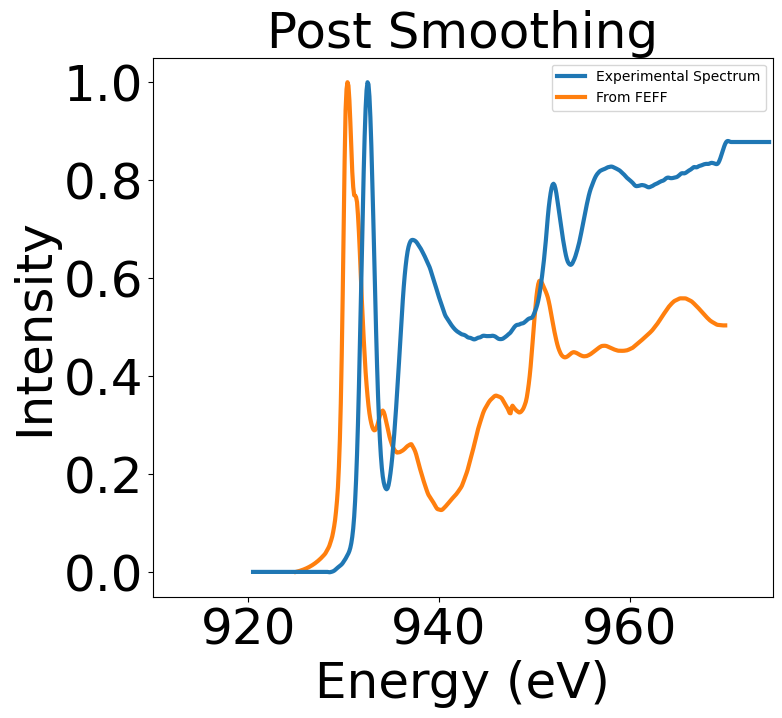

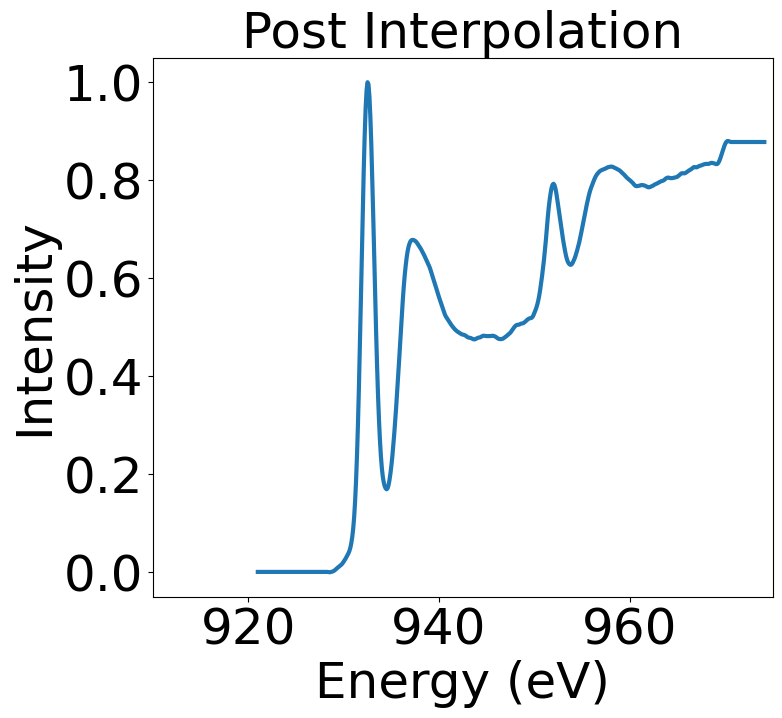

[0.02015229 0.97984771 0.        ]


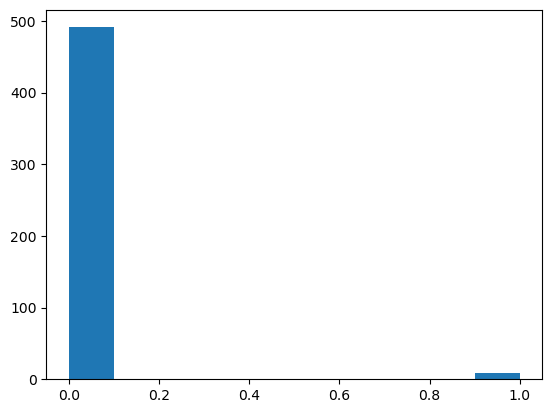

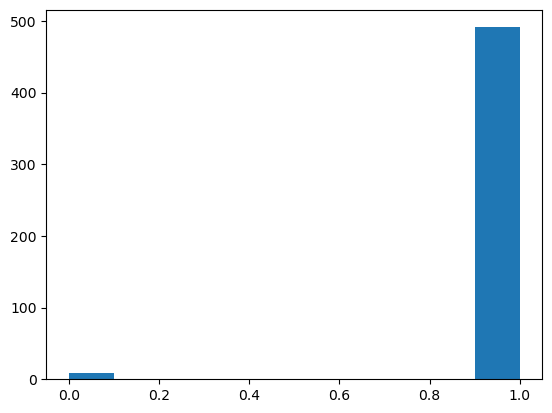

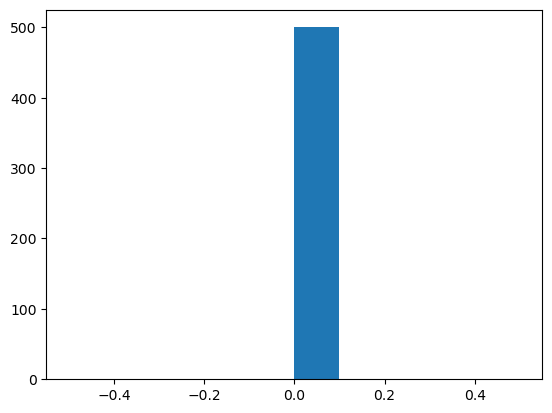

In [712]:
test_rf_obj.predict_experiment_folder('CuFeS2/', spectra_type = 'csv', 
                                      shifts = [0.5], theory_column = 'TEAM_1_aligned_925_970', smoothings = [[15,3]], 
                                      show_hist=False, show_inputted_spectrum=False, print_details = False, show_plots=True,
                                     savefigure=False, theory_indicies = [2553])

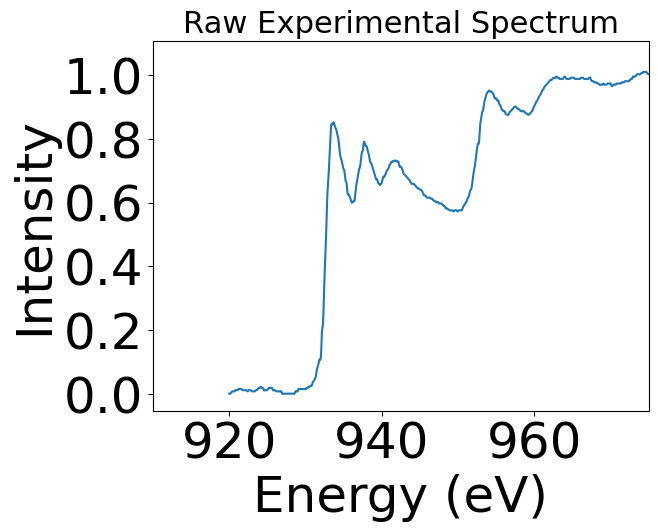

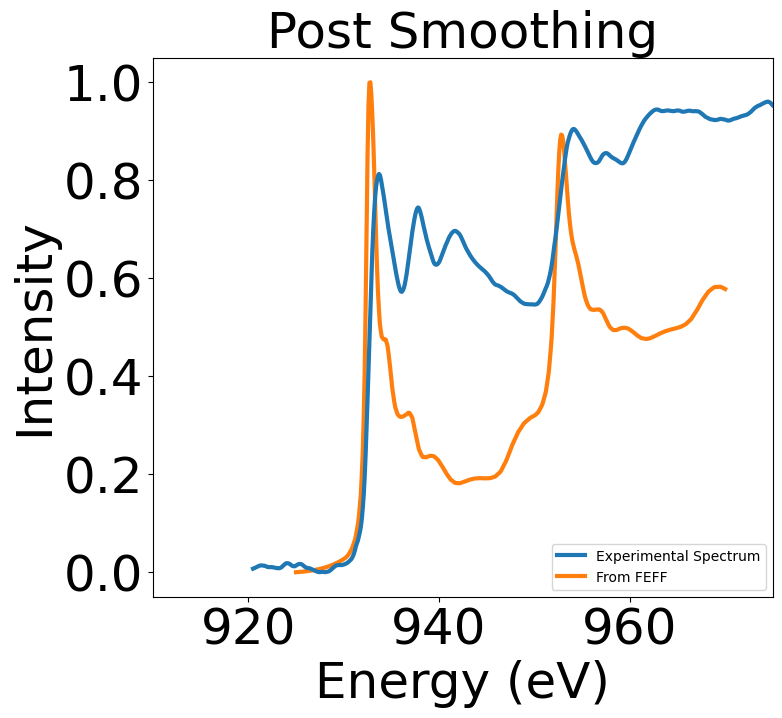

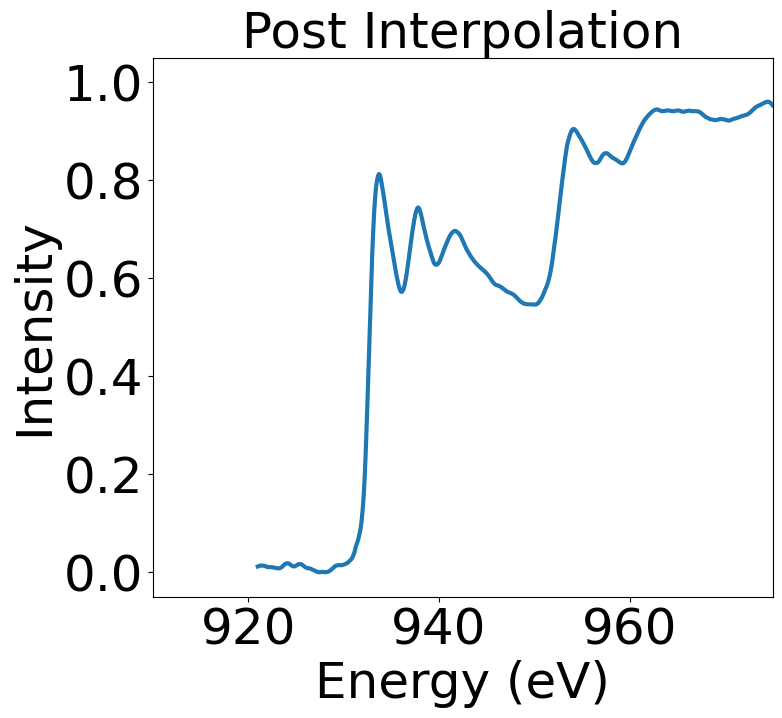

[0.60573494 0.36398403 0.03028103]


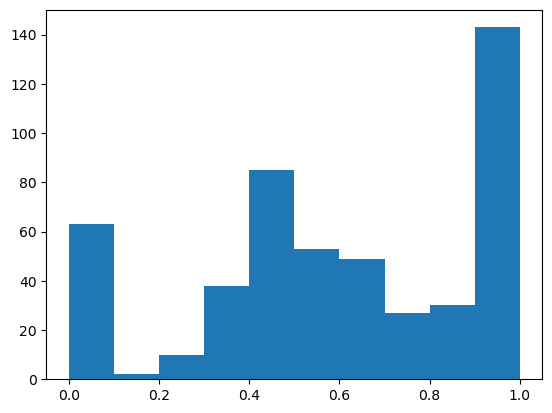

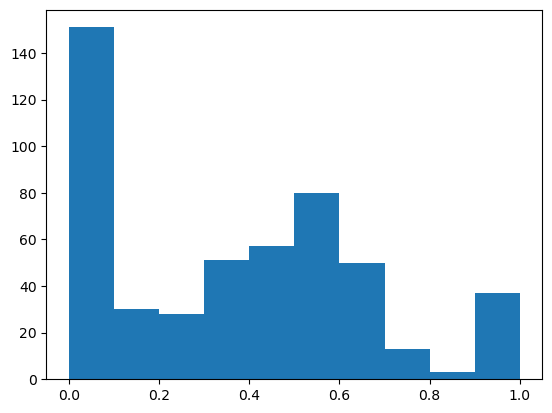

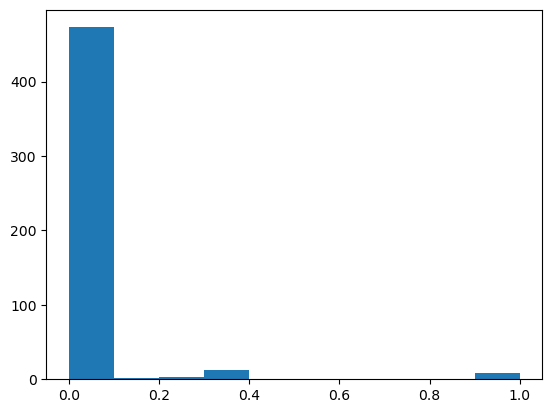

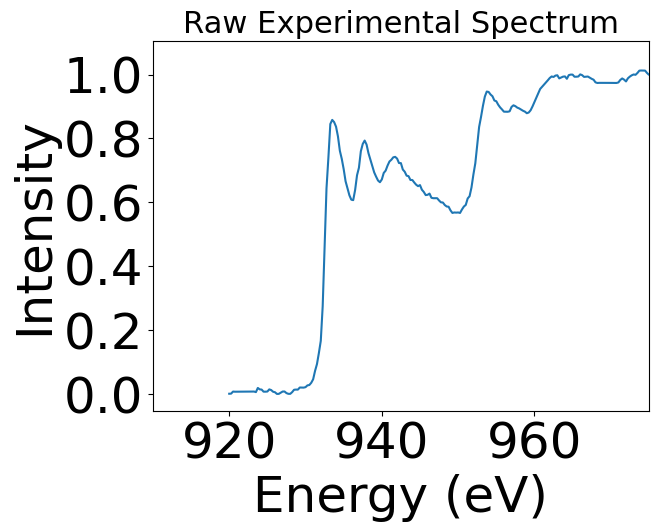

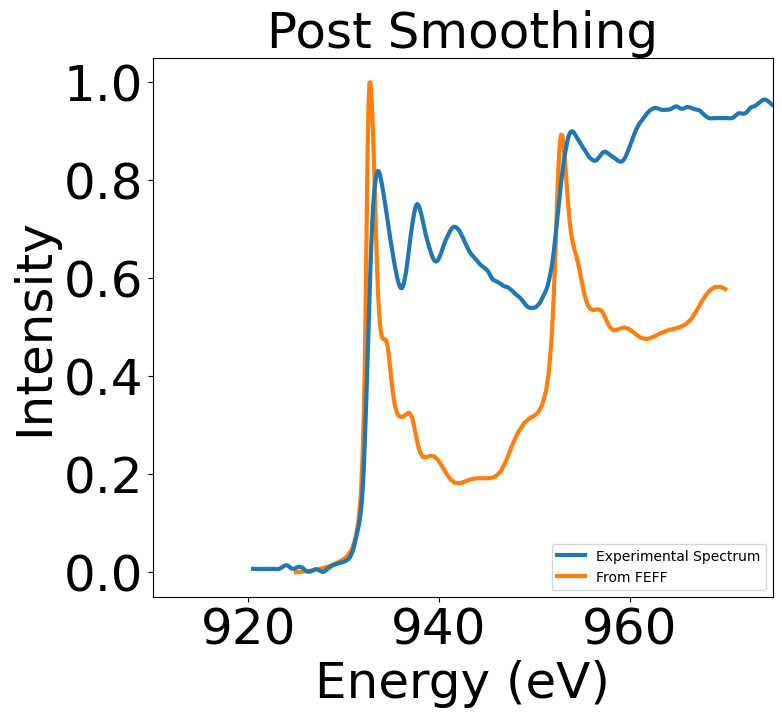

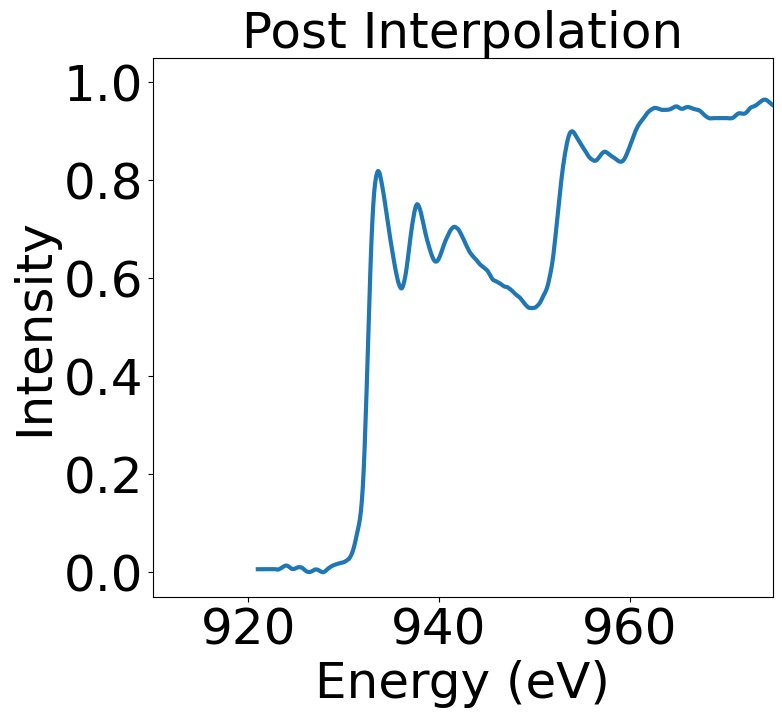

[0.56368973 0.36756814 0.06874213]


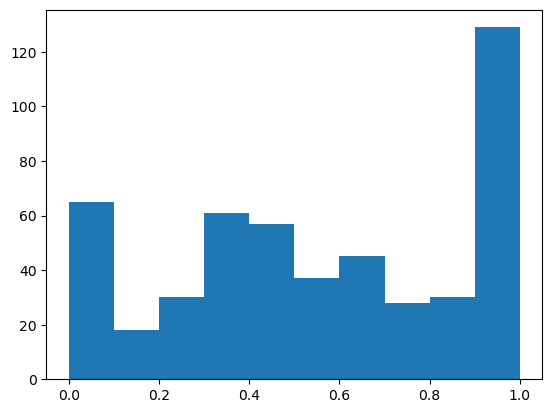

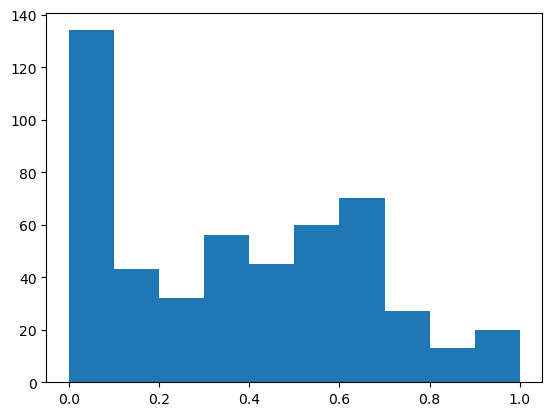

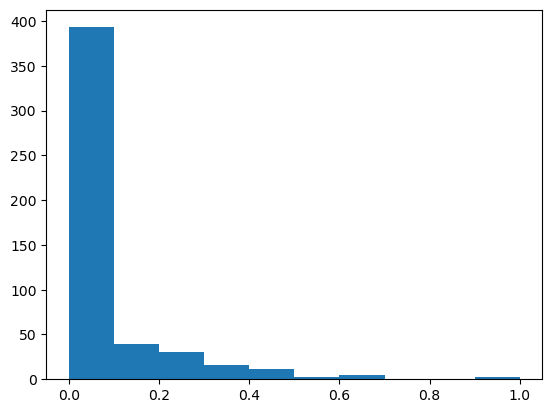

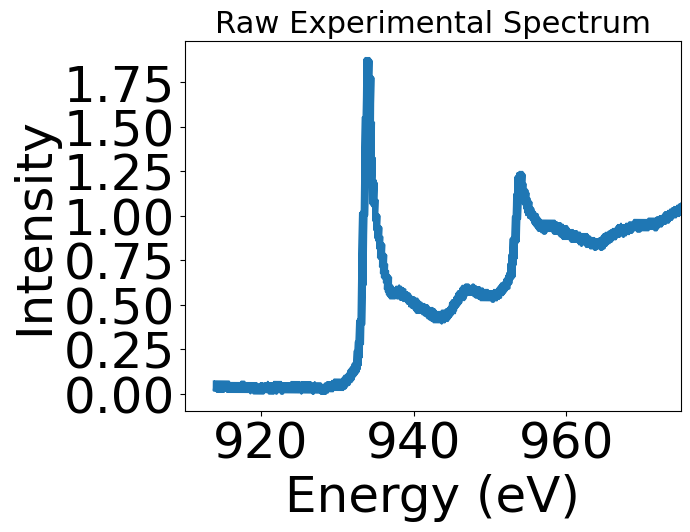

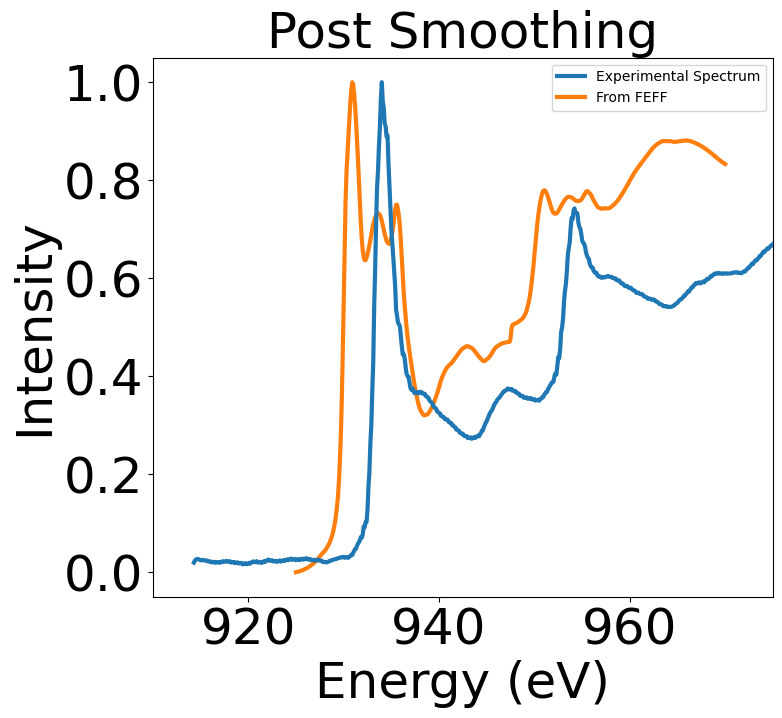

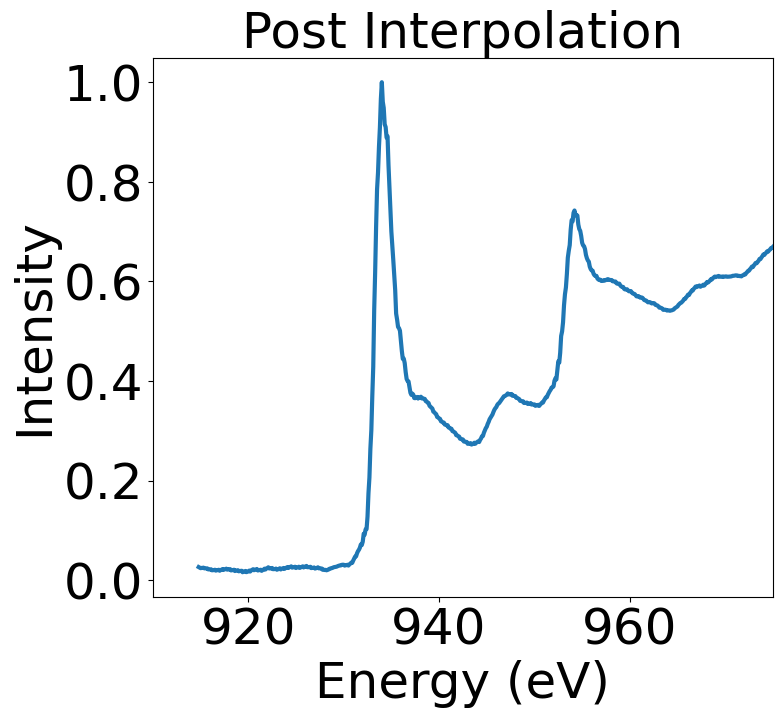

[0.16883575 0.39631233 0.43485193]


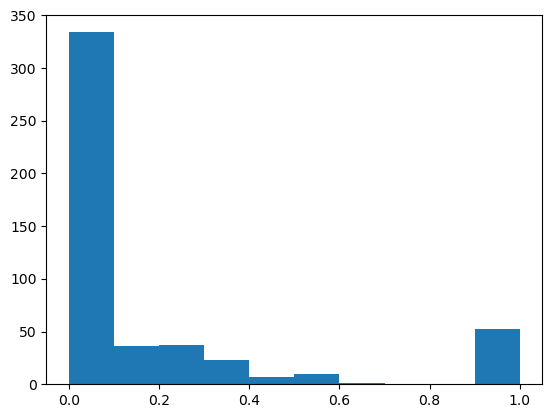

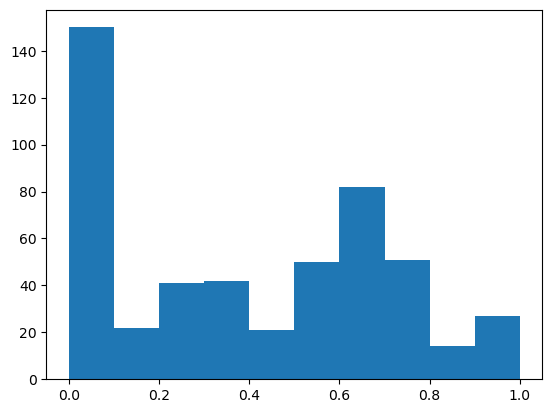

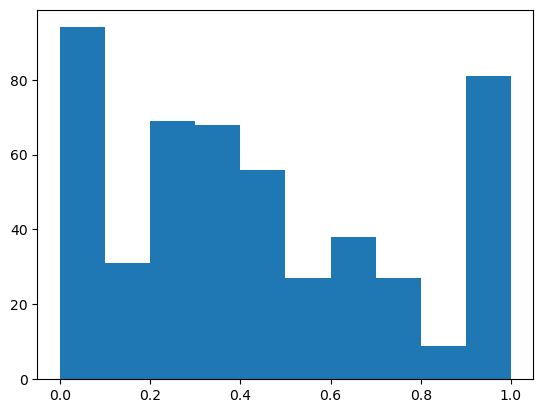

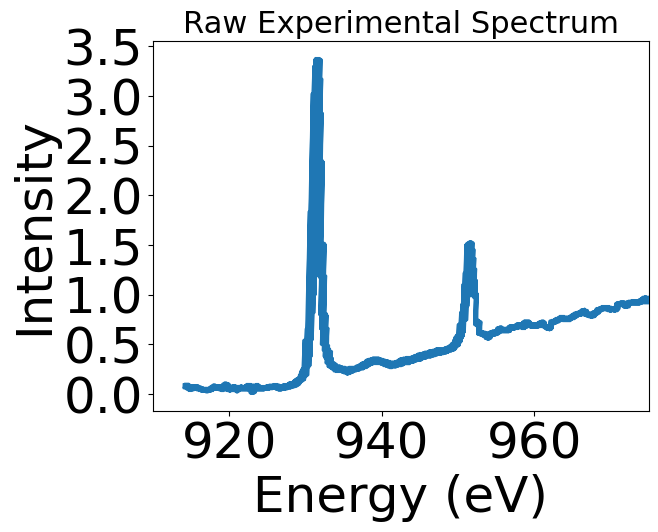

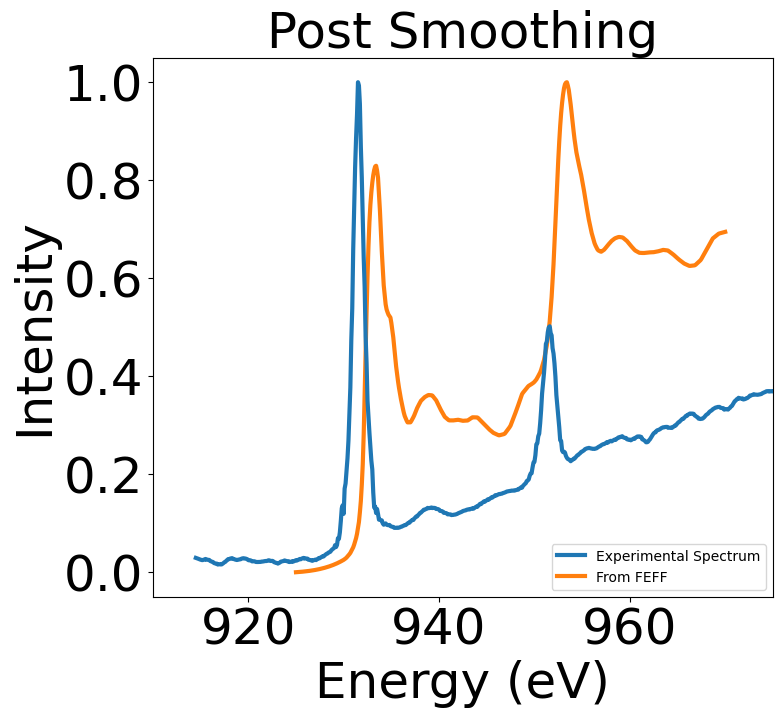

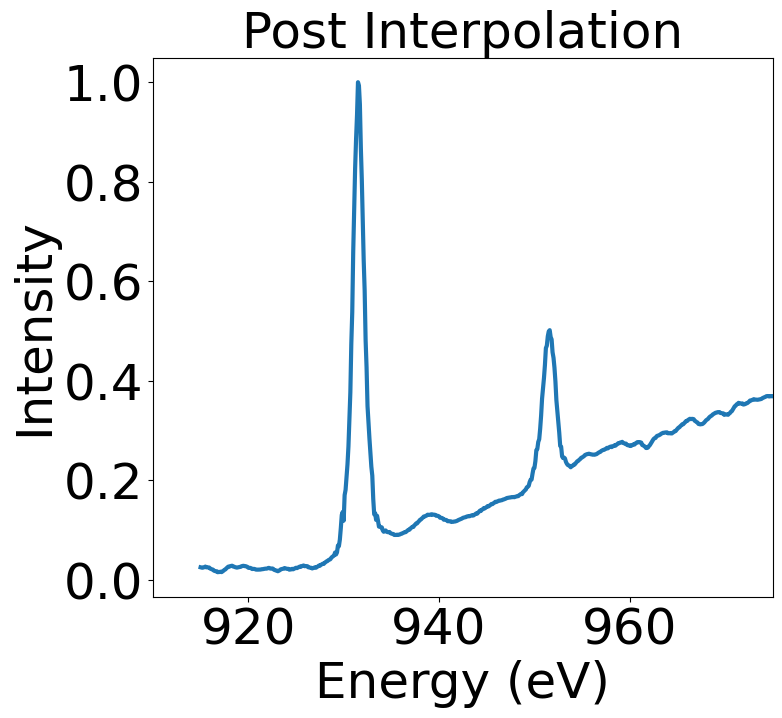

[9.76768698e-04 5.68547772e-03 9.93337754e-01]


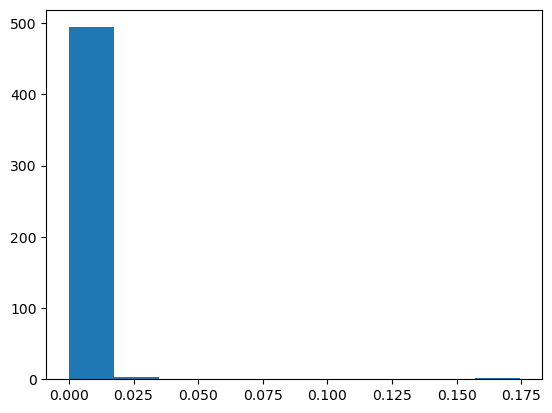

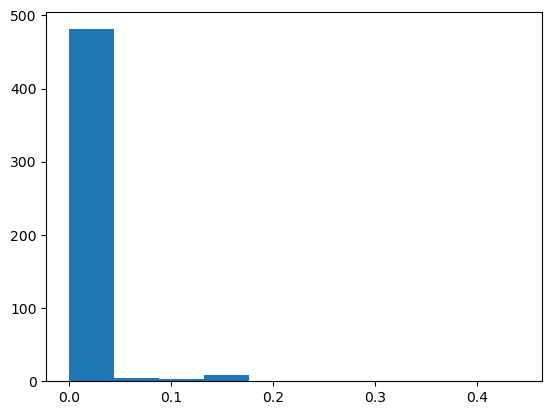

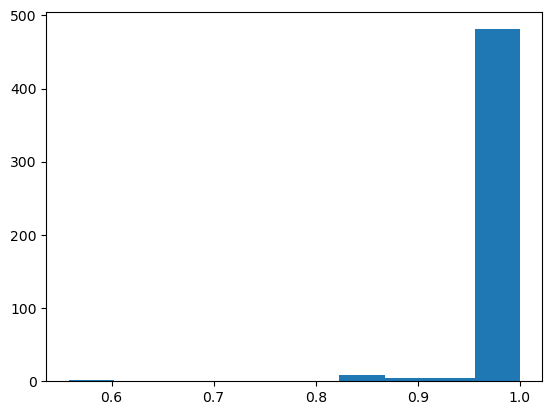

In [706]:
test_rf_obj.predict_experiment_folder('xas paper/', spectra_type = 'csv', 
                                      shifts = [-1], theory_column = 'TEAM_1_aligned_925_970', smoothings = [[15,3]], 
                                      show_hist=False, show_inputted_spectrum=False, print_details = False, show_plots=True,
                                     savefigure=False, theory_indicies = [1644, 2246, 824])

[0.68167742 0.31267243 0.00565015]


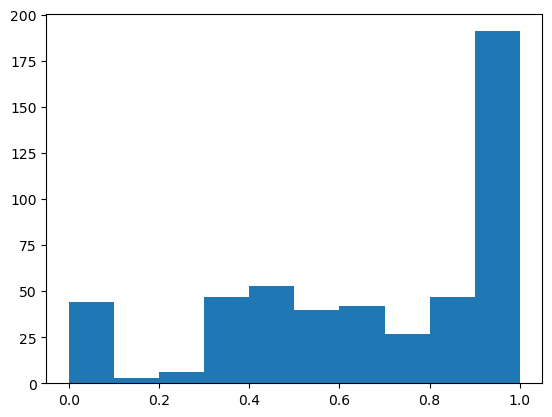

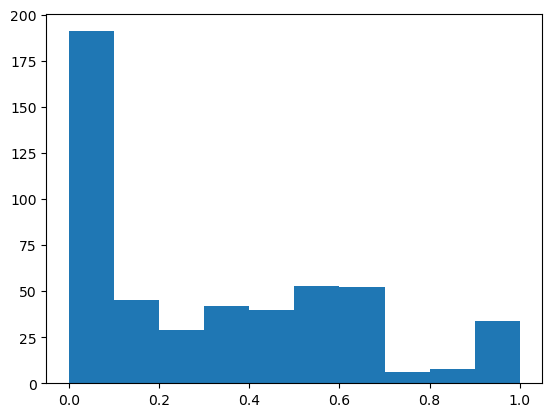

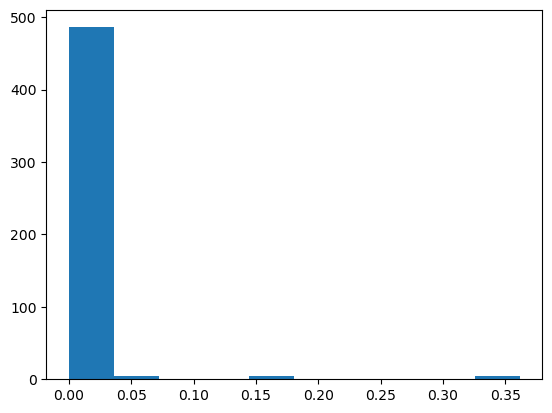

[2.27752525e-02 9.77174747e-01 5.00000000e-05]


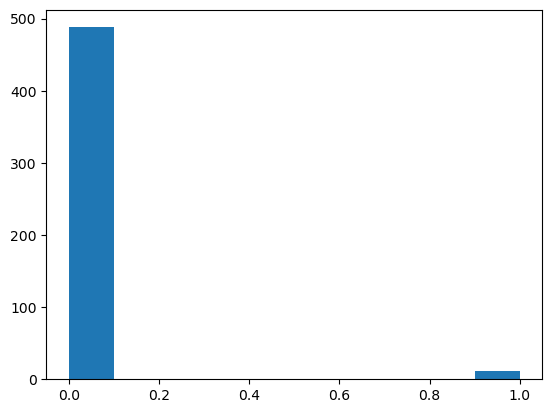

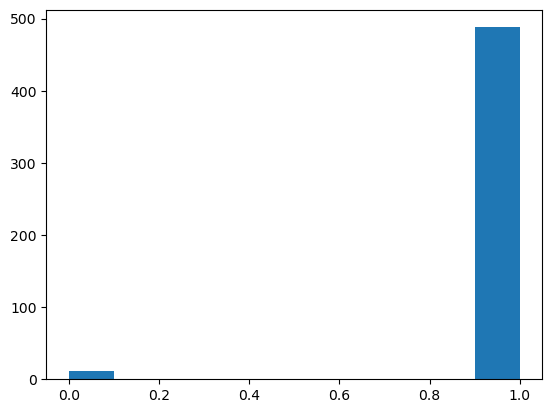

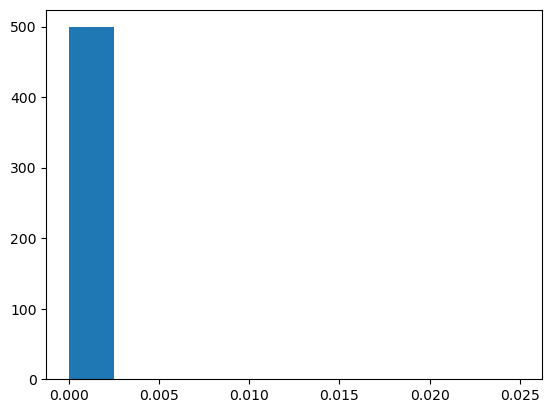

[0.00164397 0.00638355 0.99197248]


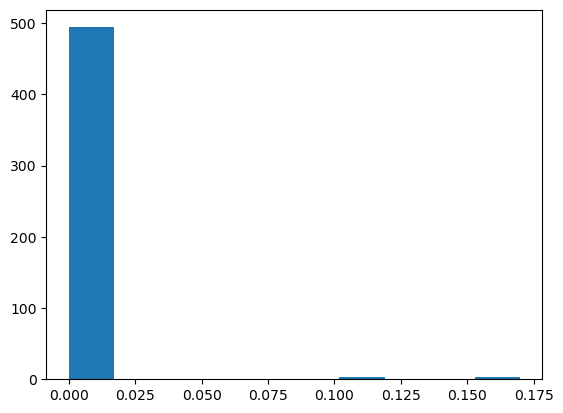

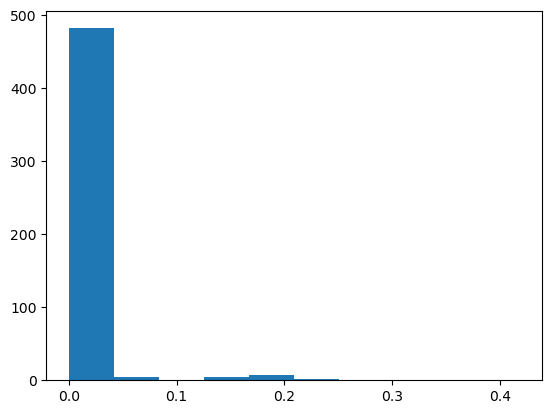

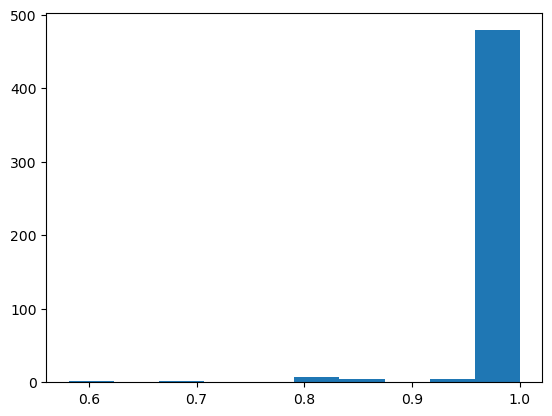

In [588]:
# full test set 
test_rf_obj.predict_experiment_folder('Cu_deconvolved_spectra/', spectra_type = 'TEAM I', 
                                      shifts = [0], theory_column = 'TEAM_1_aligned_925_970', smoothings = [[51,3]], 
                                      show_hist=False, show_inputted_spectrum=False, print_details = False, show_plots=False,
                                     savefigure=False, theory_indicies = [1644, 2246, 824])

[0.74588268 0.24091037 0.01320695]


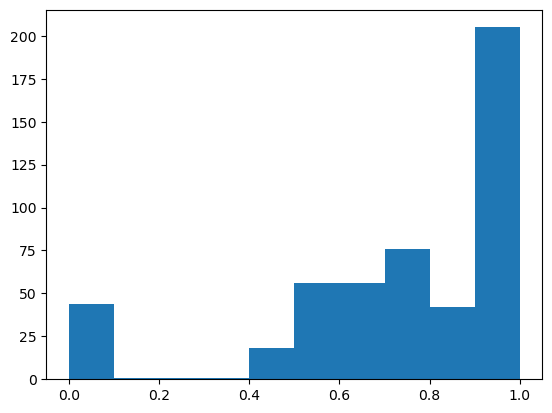

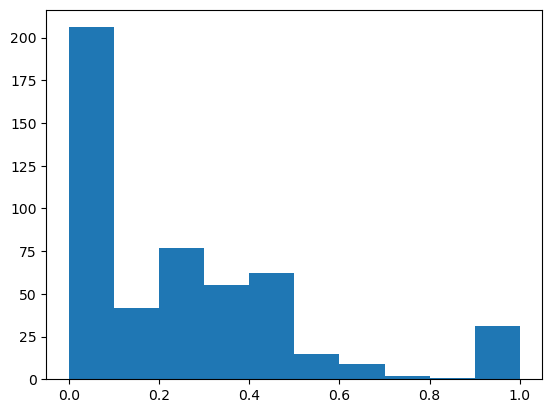

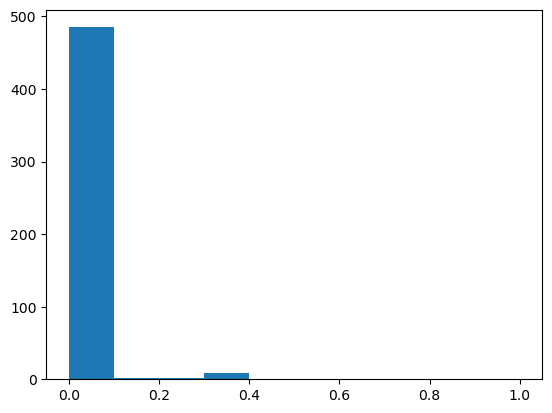

[0.1826073  0.57340179 0.2439909 ]


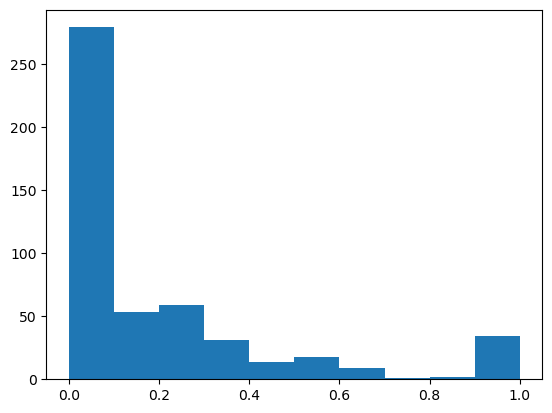

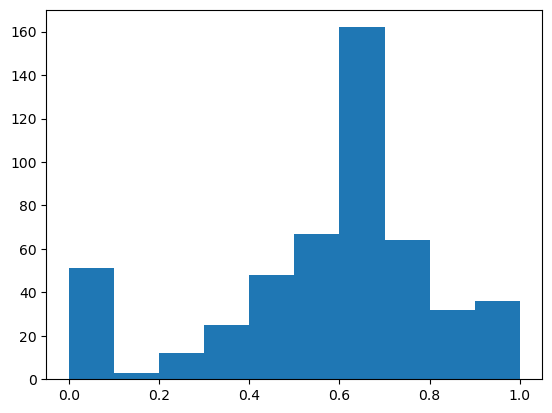

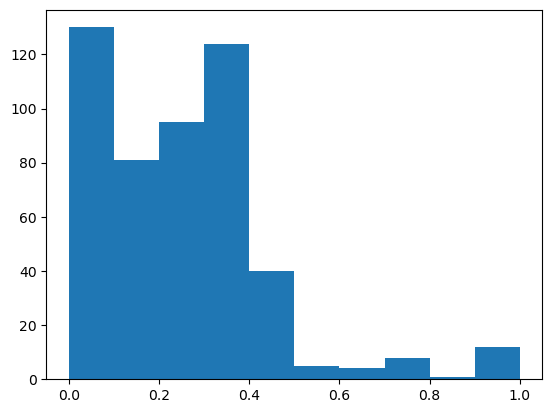

[5.59683794e-04 1.16208288e-02 9.87819487e-01]


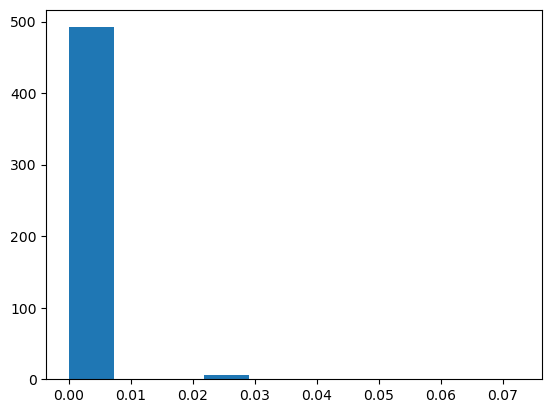

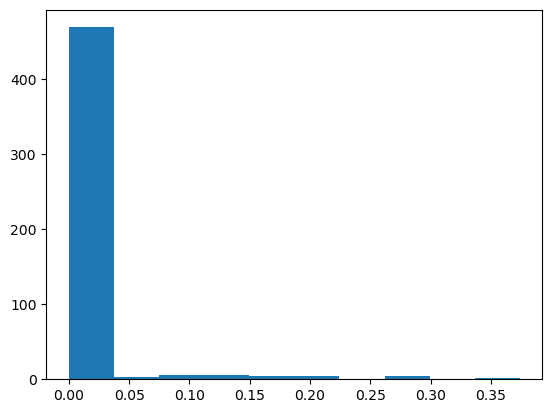

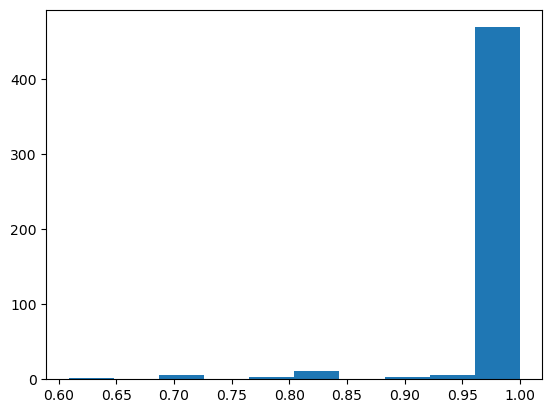

In [575]:
test_rf_obj.predict_experiment_folder('xas paper/', spectra_type = 'csv', theory_column = 'TEAM_1_aligned_925_970', smoothings = [[15,3]], 
                                      show_hist=False, show_inputted_spectrum=False, print_details = False, show_plots=False,
                                     savefigure=False, theory_indicies = [1644, 2246, 824], shifts = [-1])

[0.60573494 0.36398403 0.03028103]


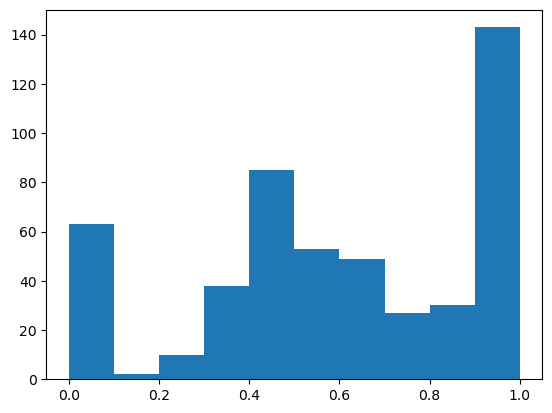

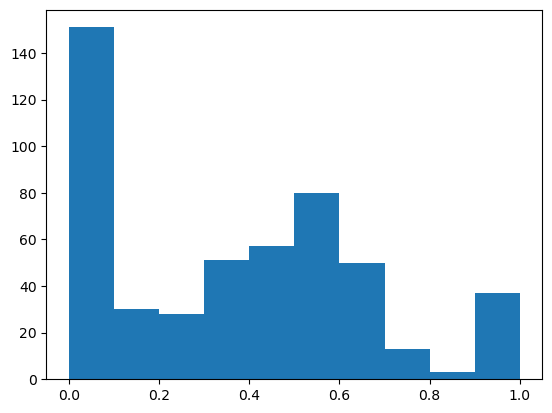

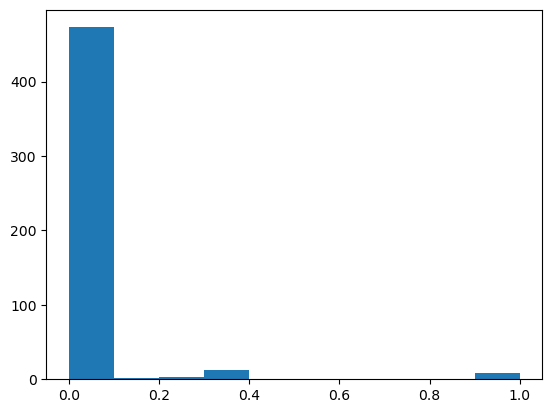

[0.16883575 0.39631233 0.43485193]


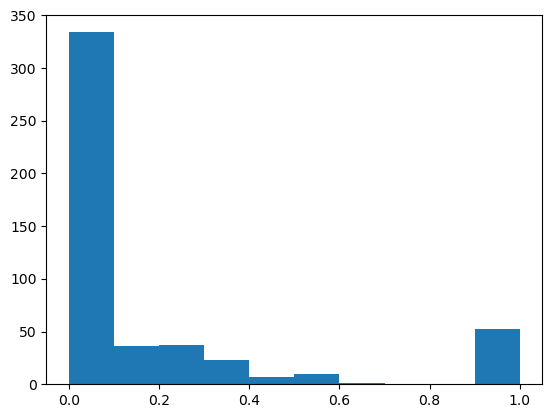

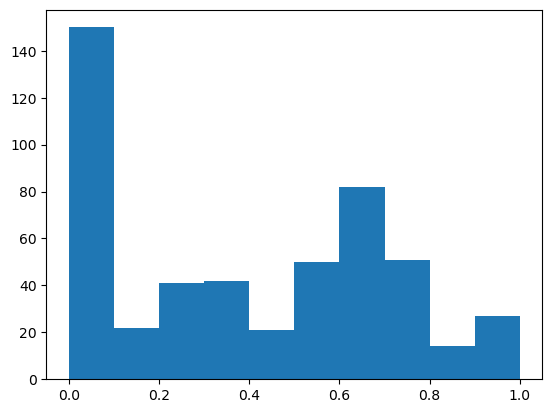

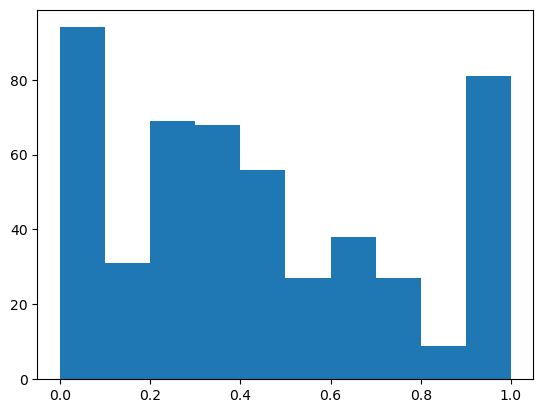

[9.76768698e-04 5.68547772e-03 9.93337754e-01]


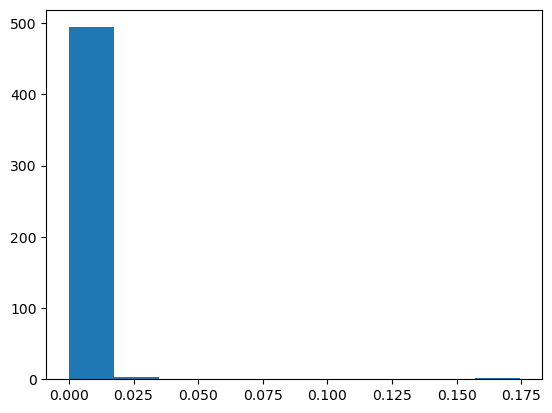

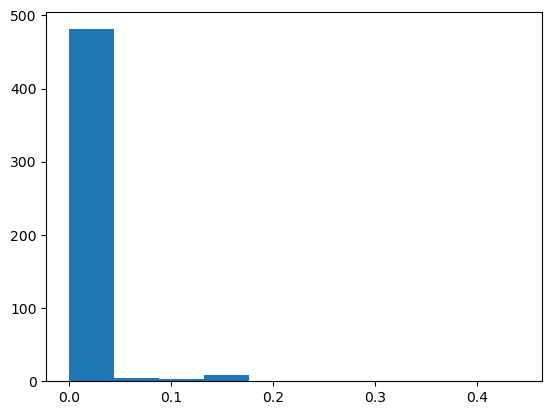

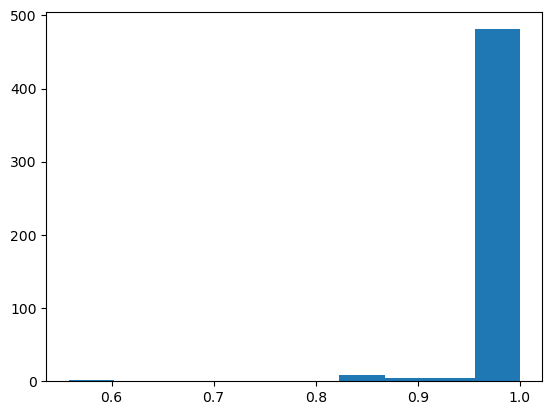

In [589]:
# full test set 
test_rf_obj.predict_experiment_folder('xas paper/', spectra_type = 'csv', theory_column = 'TEAM_1_aligned_925_970', smoothings = [[15,3]], 
                                      show_hist=False, show_inputted_spectrum=False, print_details = False, show_plots=False,
                                     savefigure=False, theory_indicies = [1644, 2246, 824], shifts = [-1])

In [792]:
test_rf_obj.mixed_valent_pred

[[1.86, 0.0, 0.13, 0.8299907511171448],
 [1.87, 0.0, 0.12, 0.944409140658863],
 [1.81, 0.0, 0.15, 1.3100186923024746],
 [1.88, 0.0, 0.11, 0.756786259437623],
 [1.88, 0.0, 0.12, 0.9328092746770664],
 [1.02, 0.03, 0.31, 0.5132113886573821],
 [1.89, 0.0, 0.12, 1.1559211014789428],
 [1.79, 0.0, 0.16, 1.2527139149584734],
 [1.24, 0.0, 0.21, 0.82055857119488],
 [1.94, 0.0, 0.08, 1.0603331197279016]]

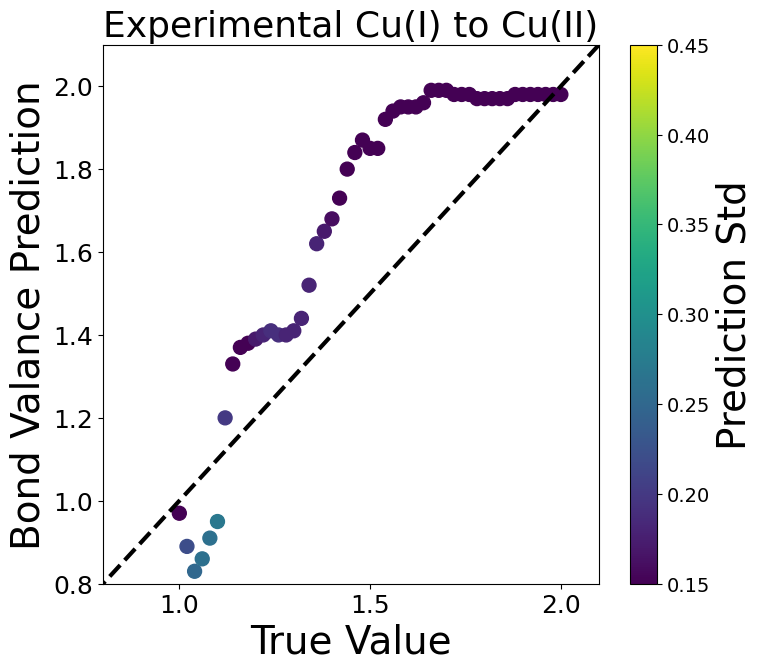

In [793]:
test_rf_obj.experimental_mixed_valent(catagory = '1-2', colorbar_range = [0.15, 0.45], savefigure = False, true_vals = [0.0, 1.00, 2.00],
                                     show_hists = False, first_comp = [], second_comp = [],
                                     prediction_type = 'Mean', folder_path = 'C:/Users/smgls/Materials_database/Cu_deconvolved_spectra',
                                     folder_path_type = 'TEAM I')

mean
[0.68167742 0.31267243 0.00565015]
median
[0.7295833333333333, 0.2704166666666667, 0.0]
mean
[0.67872948 0.31528424 0.00598628]
median
[0.7221269296740995, 0.27787307032590053, 0.0]
mean
[0.67329524 0.32030687 0.00639789]
median
[0.7083333333333334, 0.2916666666666667, 0.0]
mean
[0.66655947 0.32704264 0.00639789]
median
[0.7083333333333334, 0.2916666666666667, 0.0]
mean
[0.66126269 0.33198447 0.00675284]
median
[0.706439393939394, 0.2935606060606061, 0.0]
mean
[0.64142048 0.35117222 0.0074073 ]
median
[0.6752136752136753, 0.3247863247863248, 0.0]
mean
[0.63083936 0.36213495 0.00702568]
median
[0.6499999999999999, 0.35000000000000003, 0.0]
mean
[0.63160256 0.36255641 0.00584103]
median
[0.6752136752136753, 0.3247863247863248, 0.0]
mean
[0.62549205 0.36895751 0.00555044]
median
[0.6752136752136753, 0.3247863247863248, 0.0]
mean
[0.56442044 0.42919957 0.00637999]
median
[0.5927927927927927, 0.40720720720720727, 0.0]
mean
[0.49083632 0.5058434  0.00332028]
median
[0.45370370370370366,

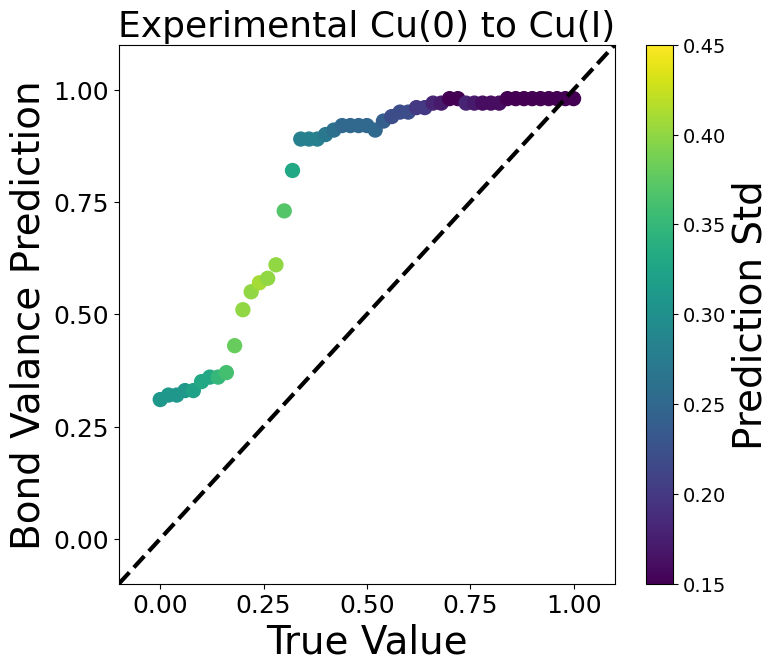

In [590]:
# full test set 
test_rf_obj.experimental_mixed_valent(catagory = '0-1', colorbar_range = [0.15, 0.45], savefigure = False, true_vals = [0.0, 1.00, 2.00],
                                     show_hists = False, first_comp = [], second_comp = [],
                                     prediction_type = 'Mean', folder_path = 'C:/Users/smgls/Materials_database/Cu_deconvolved_spectra',
                                     folder_path_type = 'TEAM I')

prediction = 0.27
Prediction Median = 0.16
prediction std = 0.34
prediction = 0.26
Prediction Median = 0.12
prediction std = 0.33
prediction = 0.24
Prediction Median = 0.12
prediction std = 0.33
prediction = 0.23
Prediction Median = 0.12
prediction std = 0.32
prediction = 0.23
Prediction Median = 0.12
prediction std = 0.32
prediction = 0.24
Prediction Median = 0.12
prediction std = 0.32
prediction = 0.26
Prediction Median = 0.15
prediction std = 0.32
prediction = 0.28
Prediction Median = 0.23
prediction std = 0.33
prediction = 0.32
Prediction Median = 0.24
prediction std = 0.35
prediction = 0.37
Prediction Median = 0.27
prediction std = 0.38
prediction = 0.4
Prediction Median = 0.32
prediction std = 0.39
prediction = 0.42
Prediction Median = 0.32
prediction std = 0.4
prediction = 0.45
Prediction Median = 0.32
prediction std = 0.42
prediction = 0.54
Prediction Median = 0.45
prediction std = 0.44
prediction = 0.72
Prediction Median = 0.78
prediction std = 0.46
prediction = 0.82
Predictio

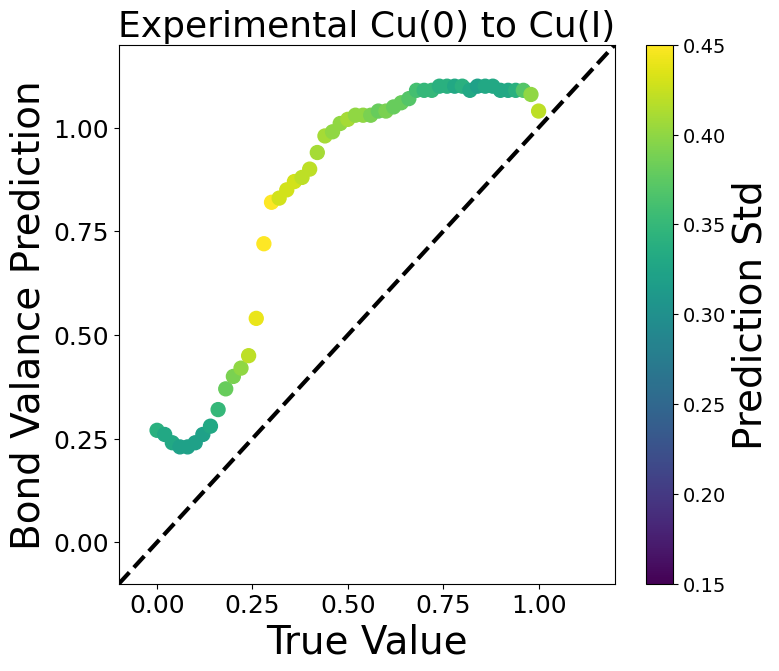

In [741]:
test_rf_obj.experimental_mixed_valent(catagory = '0-1', colorbar_range = [0.15, 0.45], savefigure = False, true_vals = [0.0, 1.00, 2.00],
                                     show_hists = False, first_comp = [], second_comp = [],
                                     prediction_type = 'Mean', folder_path = 'C:/Users/smgls/Materials_database/xas paper',
                                     folder_path_type = 'csv', spectrum_shift = -1.0, smoothing_params = (5,3), print_predictions = True)

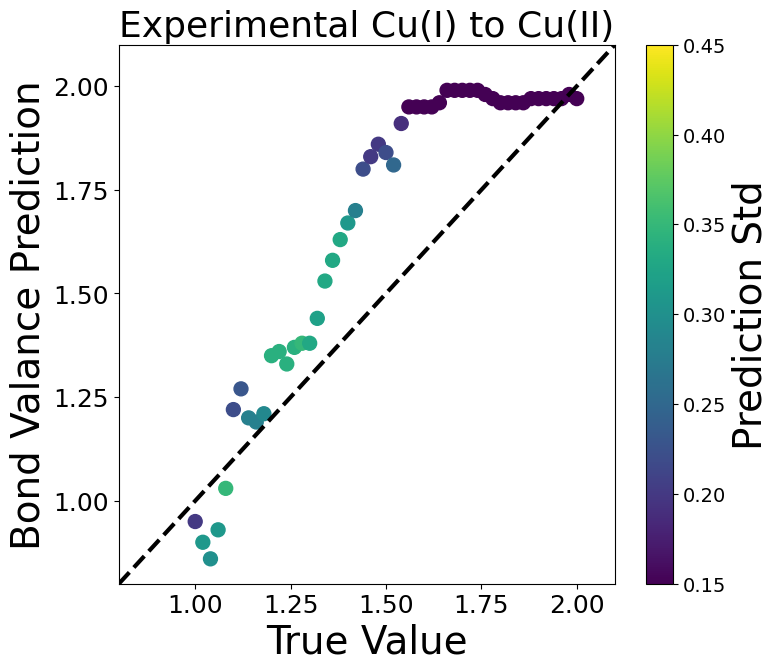

In [743]:
test_rf_obj.experimental_mixed_valent(catagory = '1-2', colorbar_range = [0.15, 0.45], savefigure = False, true_vals = [0.0, 1.00, 2.0],
                                     show_hists = False, folder_path = 'C:/Users/smgls/Materials_database/Cu_deconvolved_spectra',
                                     folder_path_type = 'TEAM I')

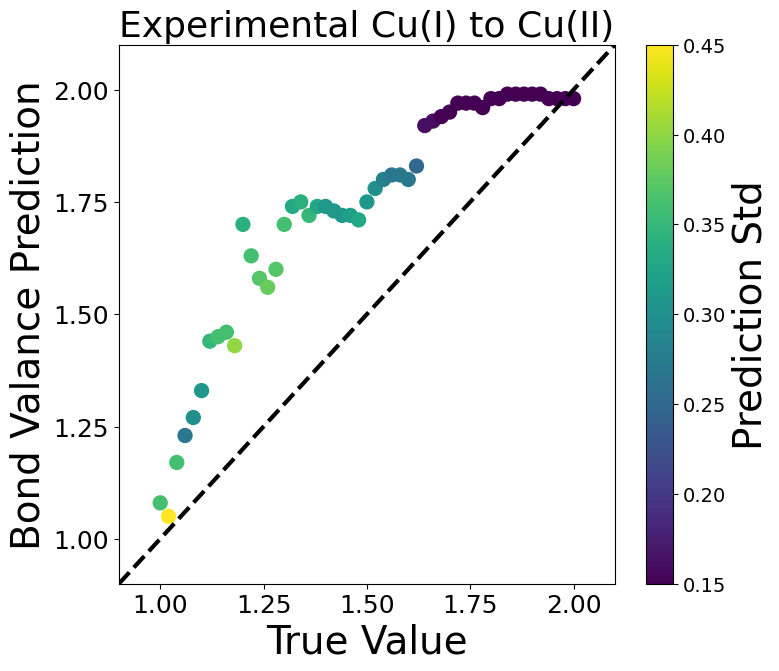

In [428]:
test_rf_obj.experimental_mixed_valent(catagory = '1-2', colorbar_range = [0.15, 0.45], savefigure = False, true_vals = [0.0, 1.00, 2.0],
                                     show_hists = False, folder_path = 'C:/Users/smgls/Materials_database/xas paper',
                                     folder_path_type = 'csv', spectrum_shift = -1.0, smoothing_params = (15,3))

100%|█████████████████████████████████████████████████████████████████████████████████| 1000/1000 [02:11<00:00,  7.59it/s]


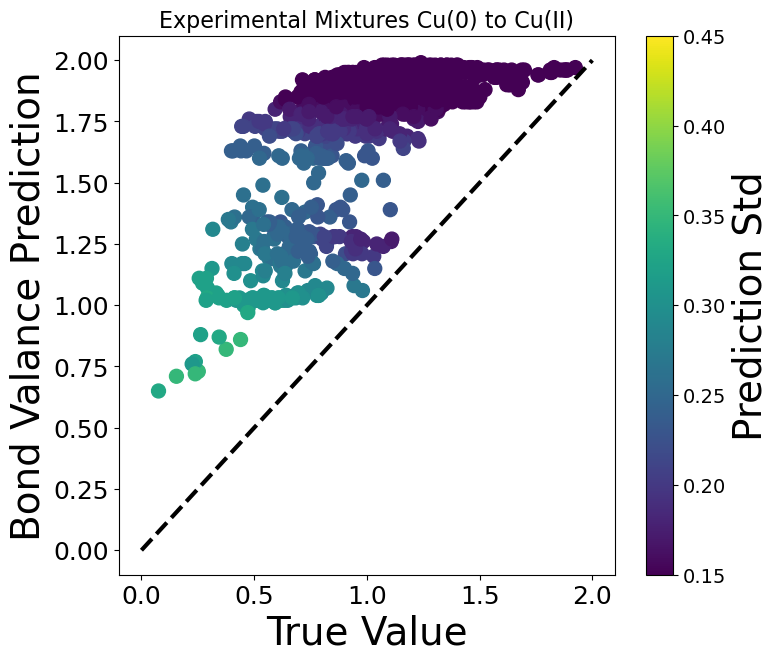

In [795]:
# full test set training 
test_rf_obj.experimental_mixed_valent(catagory = '0-2', colorbar_range = [0.15, 0.45], savefigure = False, true_vals = [0.0, 1.00, 2.0],
                                     show_hists = False,  num_mixed_vals = 1000, folder_path = 'C:/Users/smgls/Materials_database/xas paper',
                                     folder_path_type = 'csv', spectrum_shift = 0.0)

In [430]:
from sklearn.linear_model import LinearRegression
inputs = []
for i in range(len(test_rf_obj.mixed_valent_summary[0])):
    inputs.append([test_rf_obj.mixed_valent_summary[0][i], test_rf_obj.mixed_valent_summary[1][i], test_rf_obj.mixed_valent_summary[2][i]])
    
    # inputs.append([test_rf_obj.mixed_valent_summary[0][i], test_rf_obj.mixed_valent_summary[2][i]])

    # inputs.append([test_rf_obj.mixed_valent_summary[0][i]])
# X = test_rf_obj.mixed_valent_summary[0]
y = test_rf_obj.mixed_valent_summary[3]
reg = LinearRegression().fit(inputs, y)
reg.score(inputs, y)

0.5820490774071597

0.5820490774071597

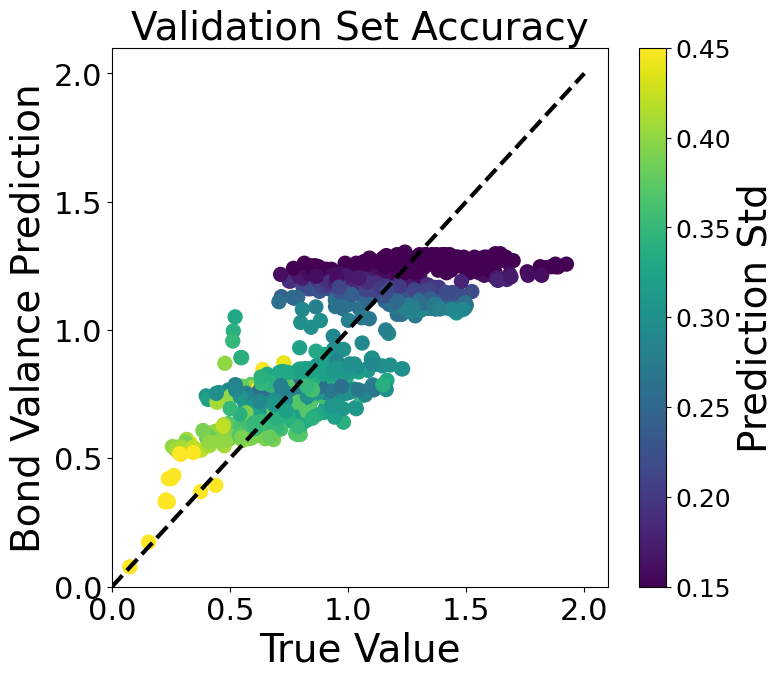

In [431]:
plt.figure(figsize=(8, 7))

sc = plt.scatter(y, reg.predict(inputs), s=100, c=test_rf_obj.mixed_valent_summary[2], vmin=0.15,
                     vmax=0.45, alpha = 1)
cb = plt.colorbar(sc, label='Prediction Std')
# print(len(count))
plt.plot(np.linspace(0,2,21), np.linspace(0,2,21), color='k', linestyle='--', linewidth=3)

ax = cb.ax
text = ax.yaxis.label
font = matplotlib.font_manager.FontProperties(size=28)
text.set_font_properties(font)
for t in cb.ax.get_yticklabels():
    t.set_fontsize(18)
    # t.set_weight('bold')

plt.xlim([0,2.1])
plt.ylim([0,2.1])

plt.yticks(fontsize = 18)
plt.xticks([0,0.5,1,1.5,2], fontsize = 22)
plt.yticks([0,0.5,1,1.5,2], fontsize = 22)

plt.xlabel('True Value', fontsize=28)
plt.ylabel('Bond Valance Prediction', fontsize=28)
plt.title('Validation Set Accuracy', fontsize = 28)

r2_score(y, reg.predict(inputs))

100%|████████████████████████████████████████████████████████████████████████████| 1000/1000 [03:05<00:00,  5.39it/s]


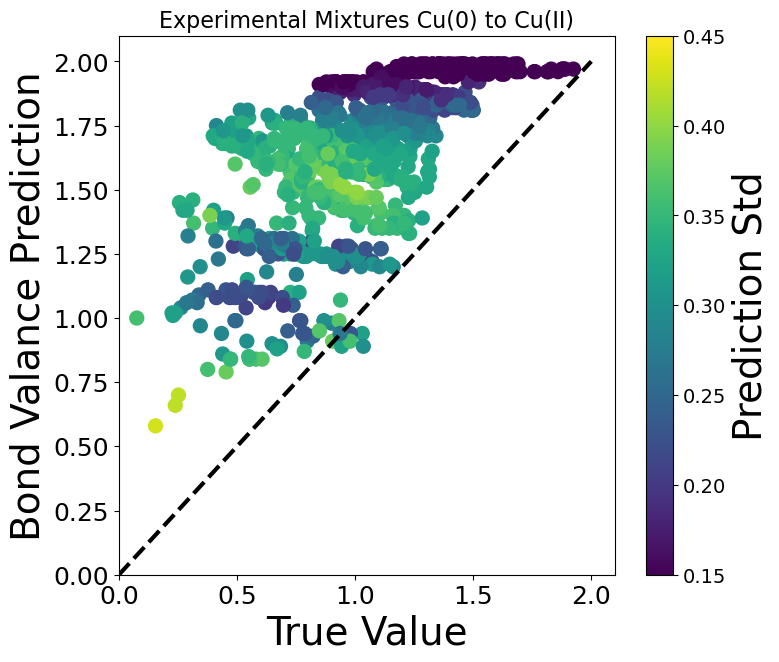

In [749]:
# full test set training 
test_rf_obj.experimental_mixed_valent(catagory = '0-2', colorbar_range = [0.15, 0.45], savefigure = False, true_vals = [0.0, 1.00, 2.0],
                                     show_hists = False,  num_mixed_vals = 1000, folder_path = 'C:/Users/smgls/Materials_database/Cu_deconvolved_spectra/',
                                     folder_path_type = 'TEAM I', spectrum_shift = 0.0)

Text(0, 0.5, 'Bond Valance Prediction')

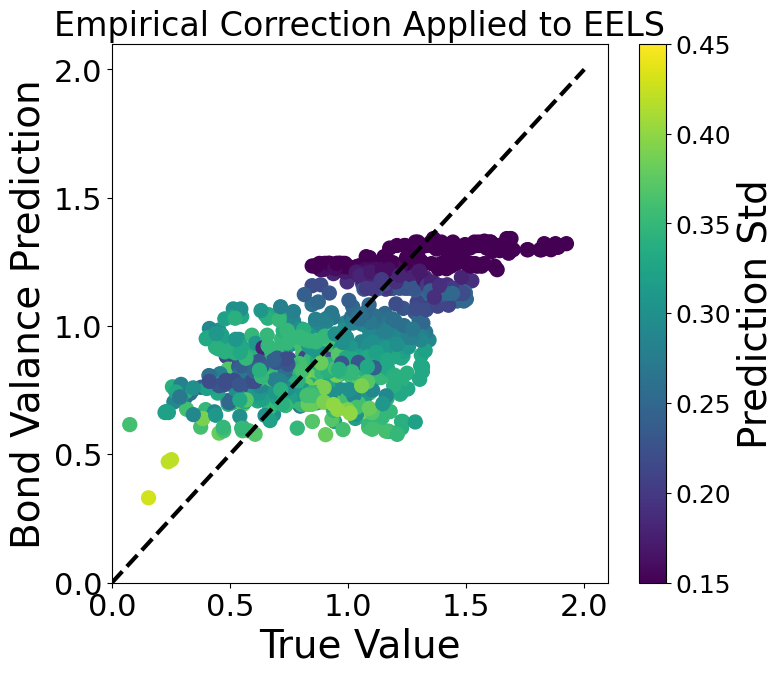

In [433]:
inputs = []
for i in range(len(test_rf_obj.mixed_valent_summary[0])):
    inputs.append([test_rf_obj.mixed_valent_summary[0][i], test_rf_obj.mixed_valent_summary[1][i], test_rf_obj.mixed_valent_summary[2][i]])

plt.figure(figsize=(8, 7))

sc = plt.scatter(y, reg.predict(inputs), s=100, c=test_rf_obj.mixed_valent_summary[2], vmin=0.15,
                     vmax=0.45, alpha = 1)
cb = plt.colorbar(sc, label='Prediction Std')
# print(len(count))
plt.plot(np.linspace(0,2,21), np.linspace(0,2,21), color='k', linestyle='--', linewidth=3)

ax = cb.ax
text = ax.yaxis.label
font = matplotlib.font_manager.FontProperties(size=28)
text.set_font_properties(font)
for t in cb.ax.get_yticklabels():
    t.set_fontsize(18)
    # t.set_weight('bold')

plt.xlim([0,2.1])
plt.ylim([0,2.1])

plt.yticks(fontsize = 18)
plt.xticks([0,0.5,1,1.5,2], fontsize = 22)
plt.yticks([0,0.5,1,1.5,2], fontsize = 22)

plt.title('Empirical Correction Applied to EELS', fontsize = 24)
plt.xlabel('True Value', fontsize=28)
plt.ylabel('Bond Valance Prediction', fontsize=28)

100%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:55<00:00,  8.68it/s]


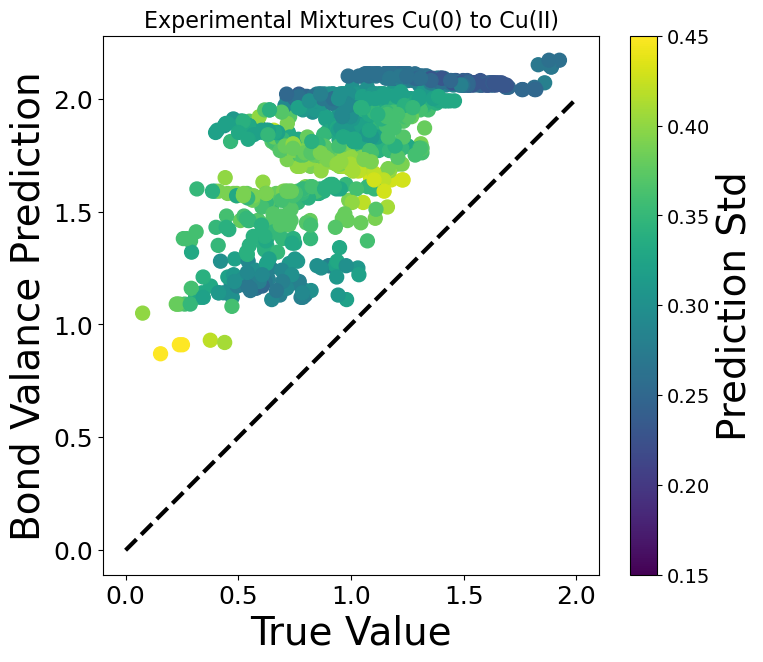

In [78]:
# normal model xas spectra 
test_rf_obj.experimental_mixed_valent(catagory = '0-2', colorbar_range = [0.15, 0.45], savefigure = False, true_vals = [0.0, 1.00, 2.0],
                                     show_hists = False,  num_mixed_vals = 1000, folder_path = 'C:/Users/smgls/Materials_database/xas paper',
                                     folder_path_type = 'csv', spectrum_shift = -1.0)

100%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [02:59<00:00,  5.57it/s]


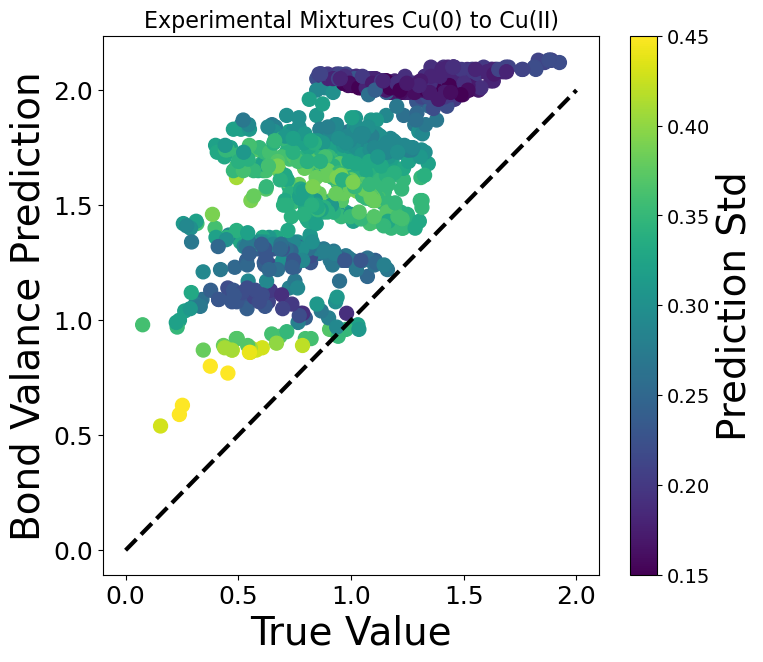

In [79]:
# normal model team I spectra 
test_rf_obj.experimental_mixed_valent(catagory = '0-2', colorbar_range = [0.15, 0.45], savefigure = False, true_vals = [0.0, 1.00, 2.0],
                                     show_hists = False,  num_mixed_vals = 1000)

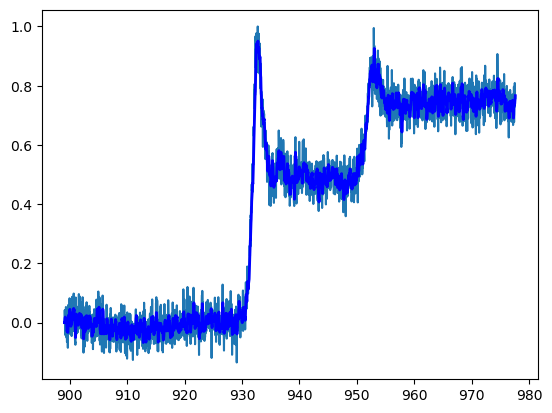

In [264]:
from scipy.signal import lfilter
intens_zero_norm = intens_zero/max(intens_zero)
plt.plot(energies_zero, intens_zero_norm, label = 'Cu(0)')
n = 5  # the larger n is, the smoother curve will be
b = [1.0 / n] * n
a = 1
yy = lfilter(b, a, intens_zero_norm)
plt.plot(energies_zero, yy, linewidth=2, linestyle="-", c="b")  # smooth by filter

In [268]:
from scipy import signal
b, a = signal.butter(1, 0.05)
zi = signal.lfilter_zi(b, a)
z, _ = signal.lfilter(b, a, intens_zero_norm, zi=zi*intens_zero_norm[0])

In [269]:
y = signal.filtfilt(b, a, intens_zero_norm)

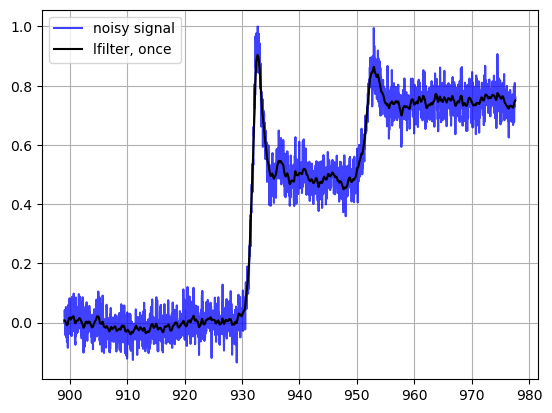

In [270]:
plt.figure
plt.plot(energies_zero, intens_zero_norm, 'b', alpha=0.75)
plt.plot(energies_zero, y, 'k')
plt.legend(('noisy signal', 'lfilter, once', 'lfilter, twice',
            'filtfilt'), loc='best')
plt.grid(True)
plt.show()

C:\Users\smgls\anaconda3\envs\Materials_database\lib\site-packages\matplotlib\cbook\__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


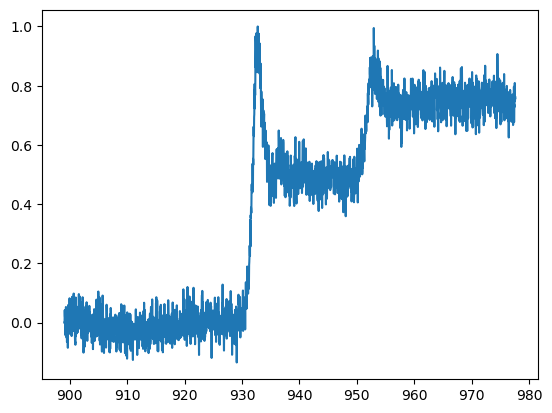

In [253]:
fft_zero_norm = np.fft.fft(intens_zero_norm)
inv_fft_zero_norm = np.fft.ifft(fft_zero_norm)
plt.plot(energies_zero, inv_fft_zero_norm)

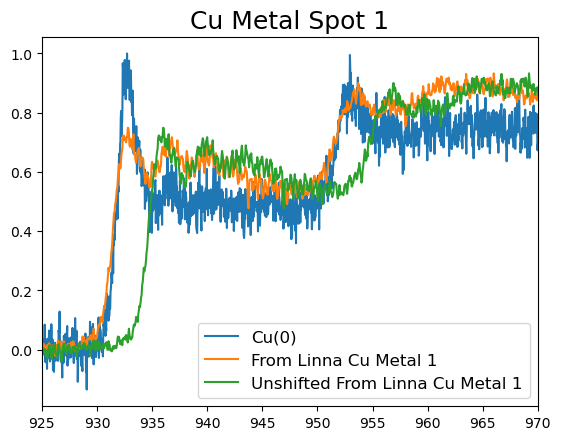

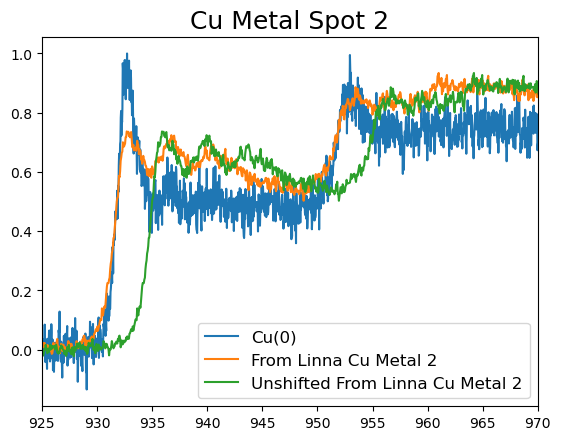

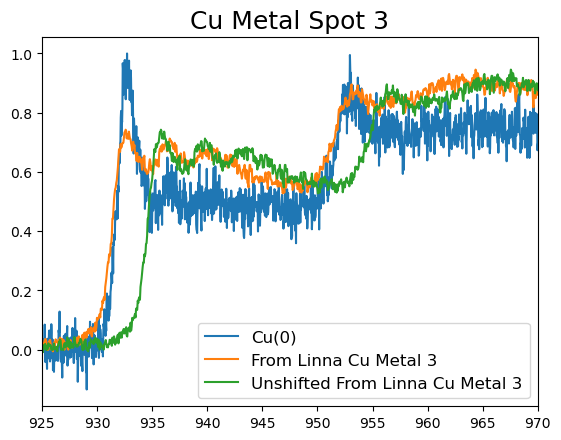

In [293]:
# output_spec = 'usable_spec_SI_2_initial_view_SI_deconvolved'
spots = ['1', '2', '3']
shifts = [3.2,3.2,3.2]
count = 0
for spot in spots:
    # output = nio.dm.dmReader("C:/Users/smgls/PycharmProjects/new_eels_data/Hitachi 112923/"+ output_spec +".dm4")
    output = nio.dm.dmReader("C:/Users/smgls/PycharmProjects/new_eels_data/Cu Metal 011224 Spot "+spot+"/Deconvolved Spectrum spot "+spot+".dm4")
    output_zero = nio.dm.dmReader("Cu_deconvolved_spectra/Cu Metal Deconvolved Spectrum.dm4")
    output_one = nio.dm.dmReader("Cu_deconvolved_spectra/Cu2O Deconvolved Spectrum.dm4")
    output_two = nio.dm.dmReader("Cu_deconvolved_spectra/CuO Deconvolved Spectrum.dm4")

    intens = output['data']
    energies = output['coords'][0]

    
    intens_zero = output_zero['data']
    energies_zero = output_zero['coords'][0]

    intens_one = output_one['data']
    energies_one = output_one['coords'][0]

    intens_two = output_two['data']
    energies_two = output_two['coords'][0]
    
    plt.plot(energies_zero, intens_zero/max(intens_zero), label = 'Cu(0)')
    plt.plot(energies-shifts[count], intens/max(intens), label = 'From Linna Cu Metal '+spot)
    plt.plot(energies, intens/max(intens), label = 'Unshifted From Linna Cu Metal '+spot)

    plt.legend(fontsize = 12, loc='lower right')
    plt.xlim([925, 970])
    plt.title('Cu Metal Spot '+spot, fontsize = 18)
    plt.xlim([925,970])
    plt.show()
    count += 1 

41
0
0


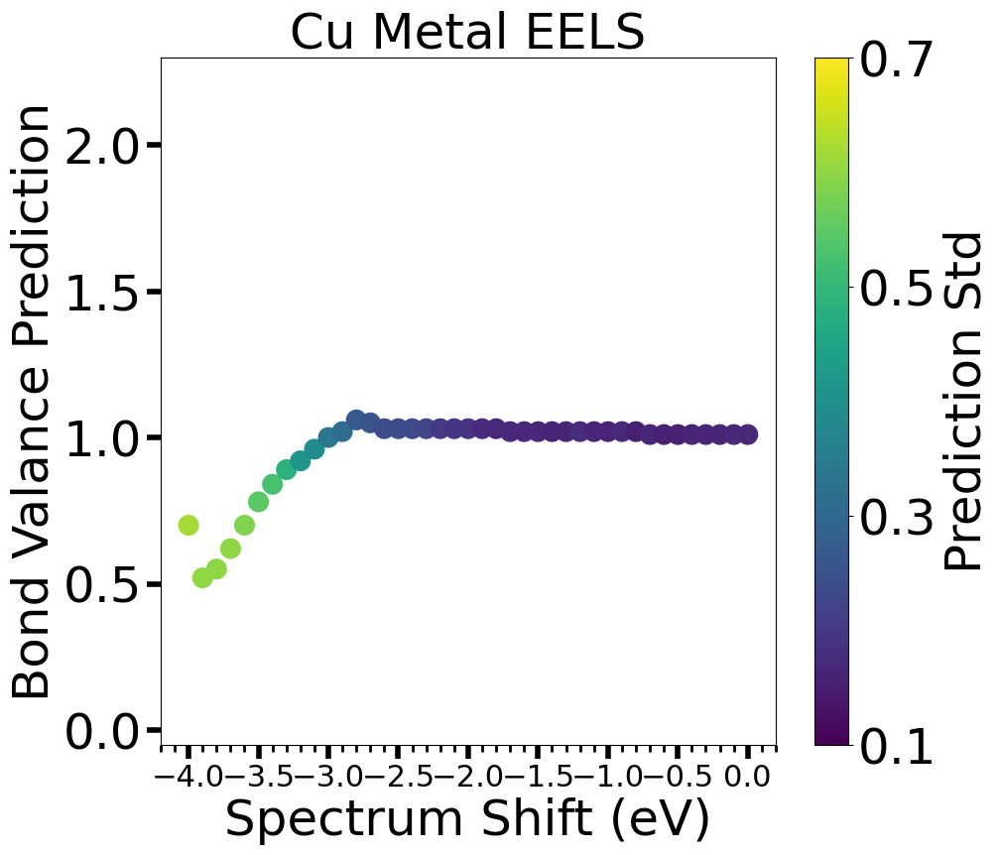

41
0
0


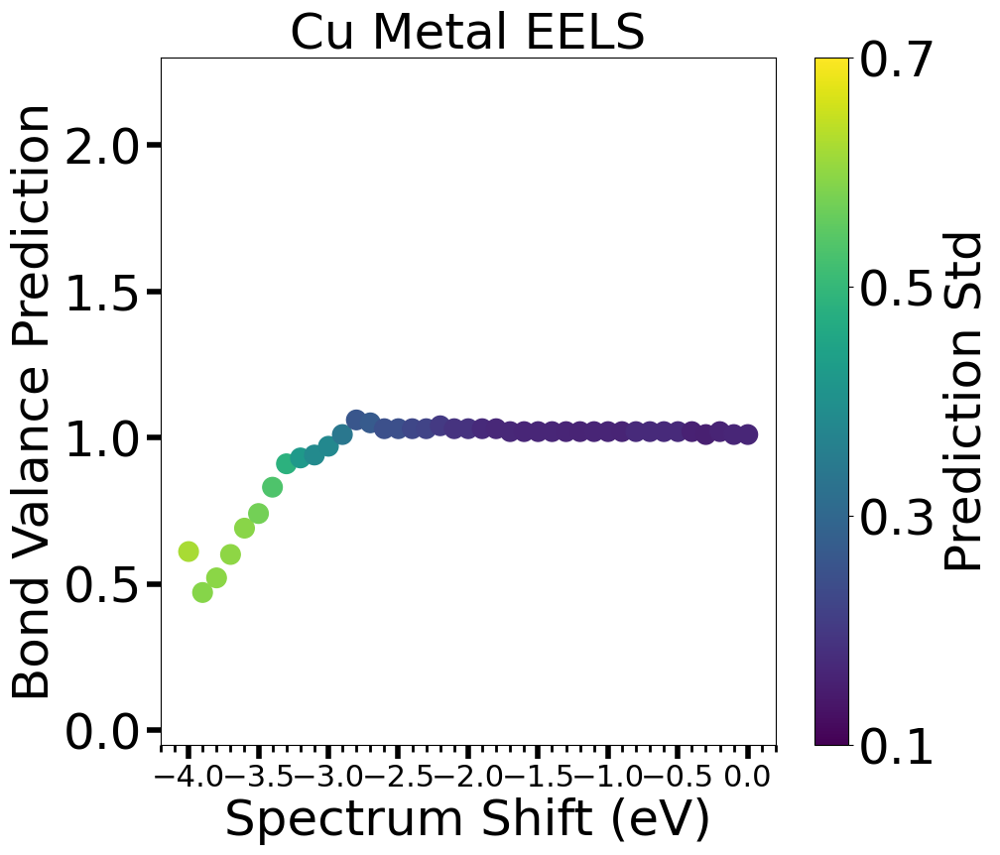

41
0
0


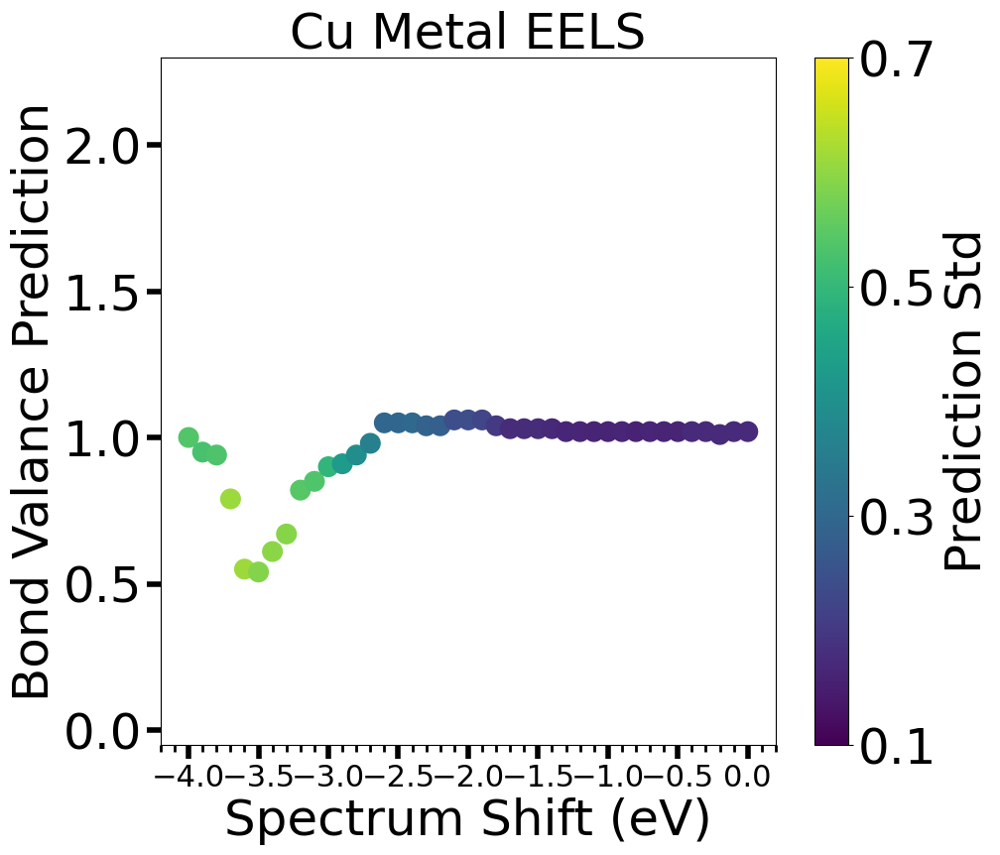

In [294]:
shifts = np.linspace(-4,0,41)
for spot in spots:
    test_rf_obj.predict_experiment_folder("C:/Users/smgls/PycharmProjects/new_eels_data/Cu Metal 011224 spot "+spot+"/", 
                                          spectra_type = 'TEAM I', 
                                          prediction_type = 'Mean', show_plots = False, 
                                          shifts = shifts, theory_column = 'TEAM_1_aligned_925_970', smoothings = [[51,3]],
                                         print_details = False, theory_indicies = [1644, 1644, 1644], model_type = 'regression')

    test_rf_obj.visualize_shift(material = 'All', show_stds = False, show_table = False, savefigure=False, spectrum_type = 'EELS')

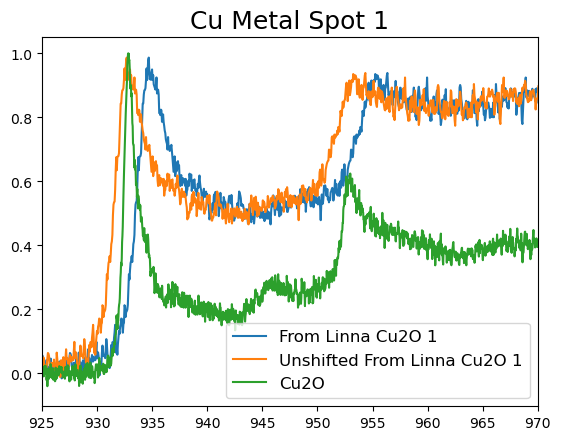

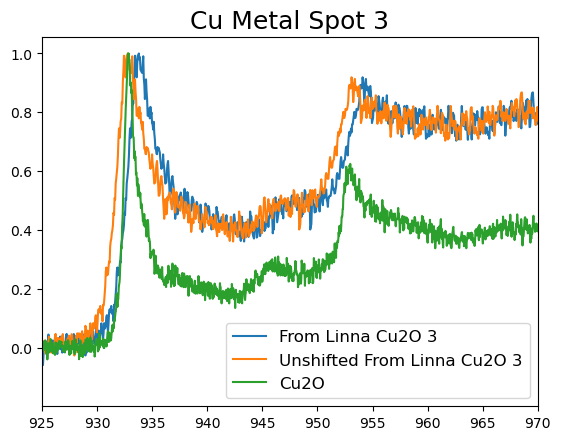

In [295]:
# output_spec = 'usable_spec_SI_2_initial_view_SI_deconvolved'
spots = ['1', '3']
shifts = [2, 1]
count = 0
for spot in spots:
    # output = nio.dm.dmReader("C:/Users/smgls/PycharmProjects/new_eels_data/Hitachi 112923/"+ output_spec +".dm4")
    output = nio.dm.dmReader("C:/Users/smgls/PycharmProjects/new_eels_data/Cu2O 011224 Spot "+spot+"/Deconvolved Spectrum spot "+spot+".dm4")
    output_zero = nio.dm.dmReader("Cu_deconvolved_spectra/Cu Metal Deconvolved Spectrum.dm4")
    output_one = nio.dm.dmReader("Cu_deconvolved_spectra/Cu2O Deconvolved Spectrum.dm4")
    output_two = nio.dm.dmReader("Cu_deconvolved_spectra/CuO Deconvolved Spectrum.dm4")

    intens = output['data']
    energies = output['coords'][0]

    
    intens_zero = output_zero['data']
    energies_zero = output_zero['coords'][0]

    intens_one = output_one['data']
    energies_one = output_one['coords'][0]

    intens_two = output_two['data']
    energies_two = output_two['coords'][0]

    plt.plot(energies, intens/max(intens), label = 'From Linna Cu2O '+spot, zorder = 0)
    plt.plot(energies-shifts[count], intens/max(intens), label = 'Unshifted From Linna Cu2O '+spot, zorder = 0)

    # plt.plot(energies_zero+shifts[count], intens_zero/max(intens_zero), label = 'Cu(0)')
    plt.plot(energies_one, intens_one/max(intens_one), label = 'Cu2O')
    # plt.plot(energies_two, intens_two/max(intens_two), label = 'CuO')
    plt.legend(fontsize = 12, loc='lower right')
    plt.xlim([925, 970])
    plt.title('Cu Metal Spot '+spot, fontsize = 18)
    plt.xlim([925,970])
    plt.show()
    count += 1 

0
41
0


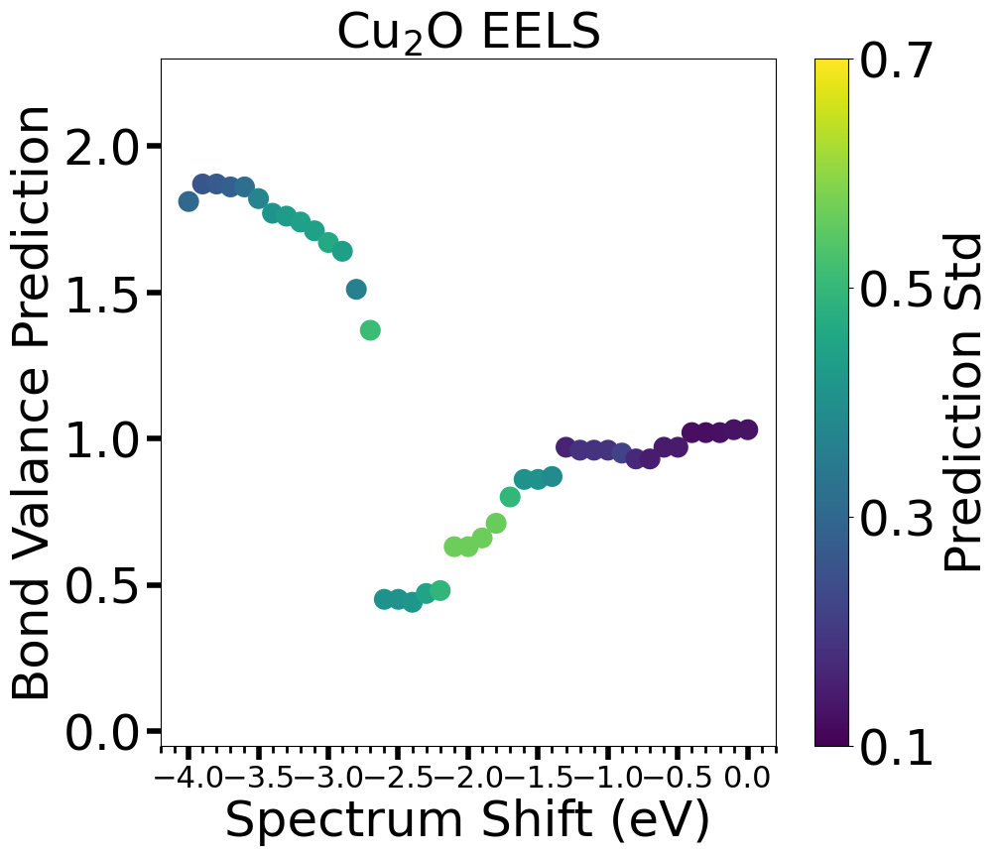

0
41
0


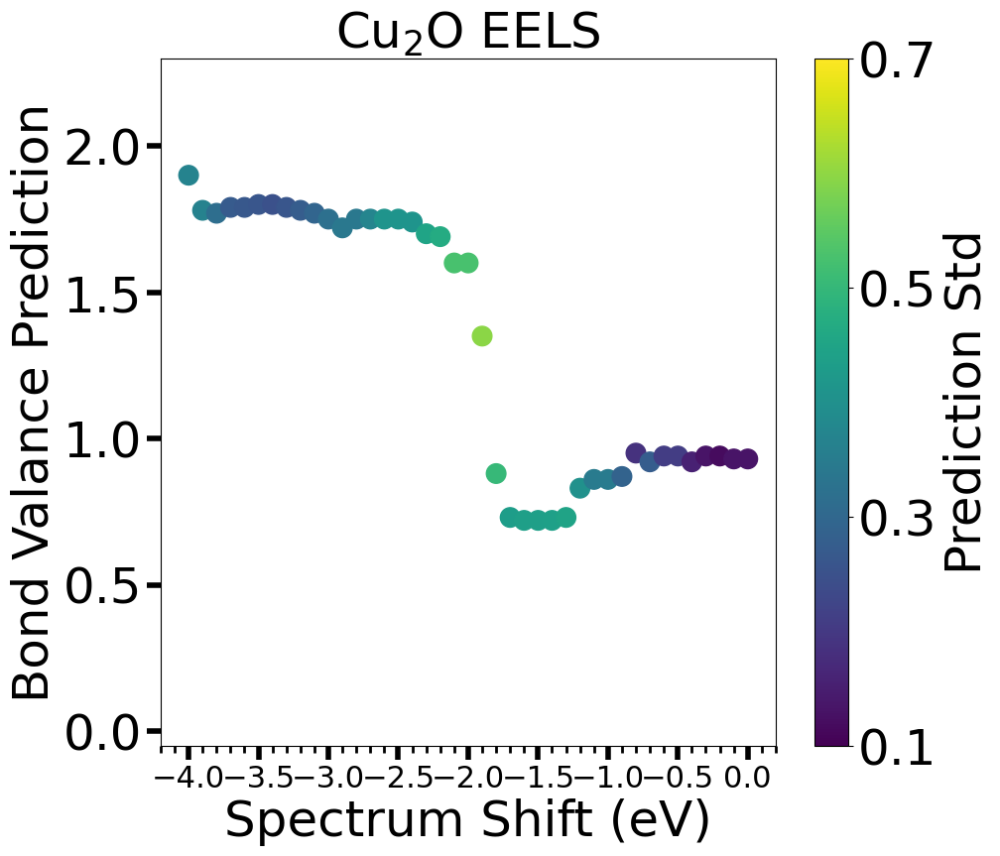

In [296]:
shifts = np.linspace(-4,0,41)
for spot in spots:
    test_rf_obj.predict_experiment_folder("C:/Users/smgls/PycharmProjects/new_eels_data/Cu2O 011224 Spot "+spot+"/",
                                          spectra_type = 'TEAM I', 
                                          prediction_type = 'Mean',
                                          shifts = shifts, theory_column = 'TEAM_1_aligned_925_970', smoothings = [[51,3]],
                                         print_details = False, theory_indicies = [1644, 1644, 1644], model_type = 'regression')

    test_rf_obj.visualize_shift(material = 'All', show_stds = False, show_table = False, savefigure=False, spectrum_type = 'EELS')

In [96]:
test_rf_obj.add_interp_spec_to_ERROR_df([0.03], False,925)

0.03


0


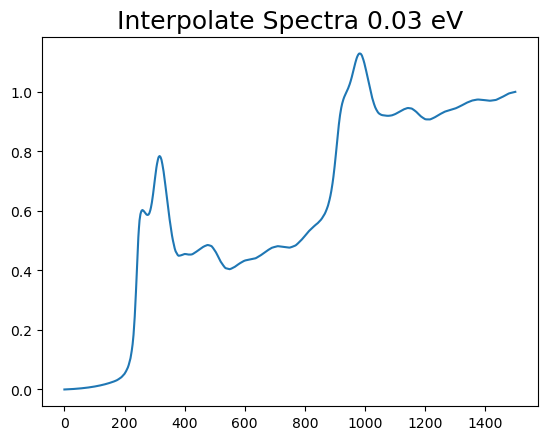

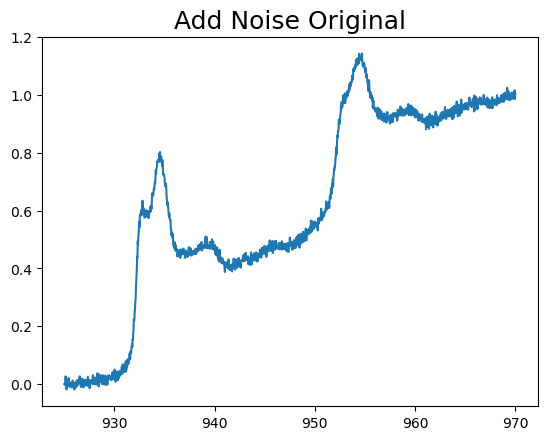

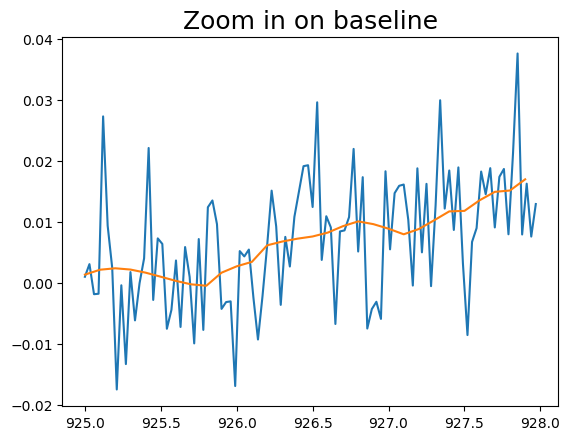

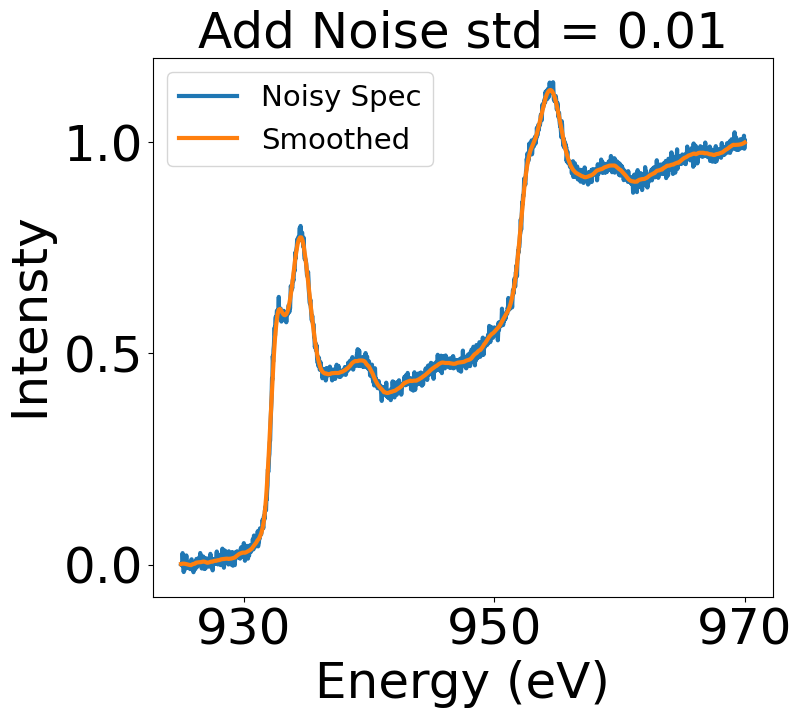

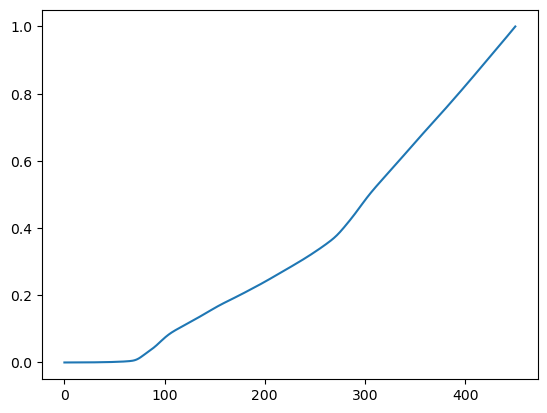

model accuracy (R^2) on simulated test data 0.810804348101537
0.27061703164369266


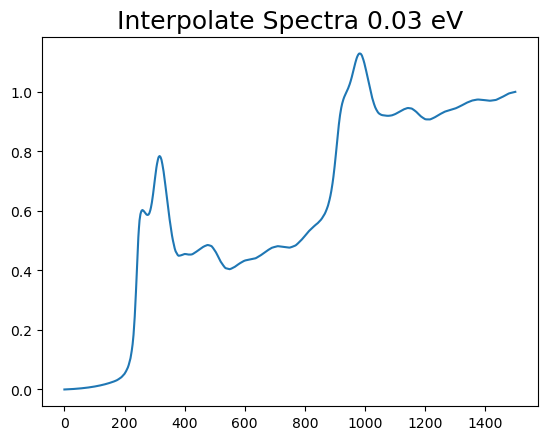

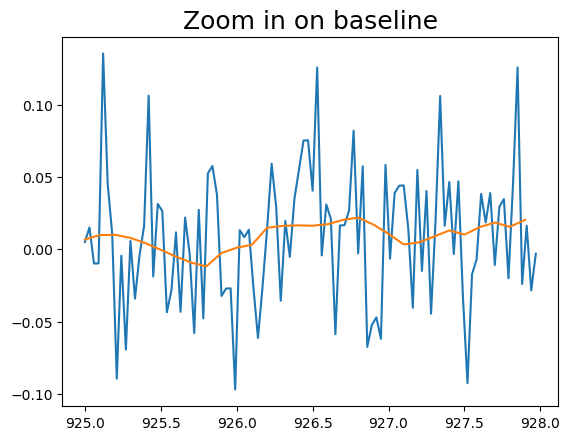

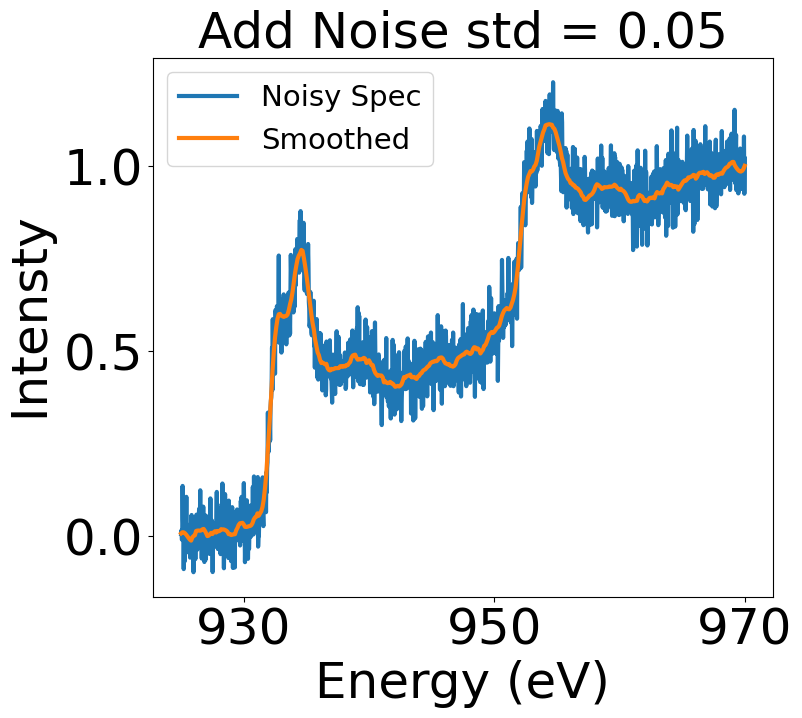

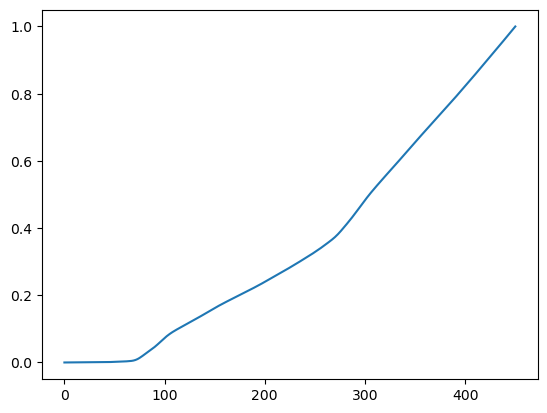

model accuracy (R^2) on simulated test data 0.766403807169165
0.30069930933433553


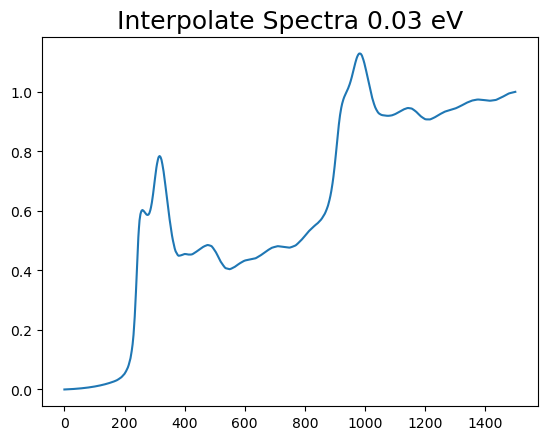

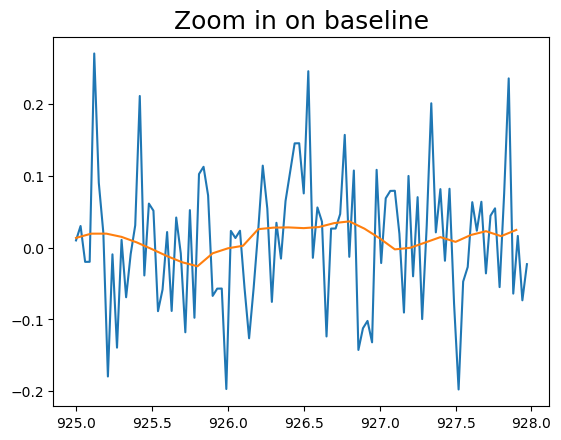

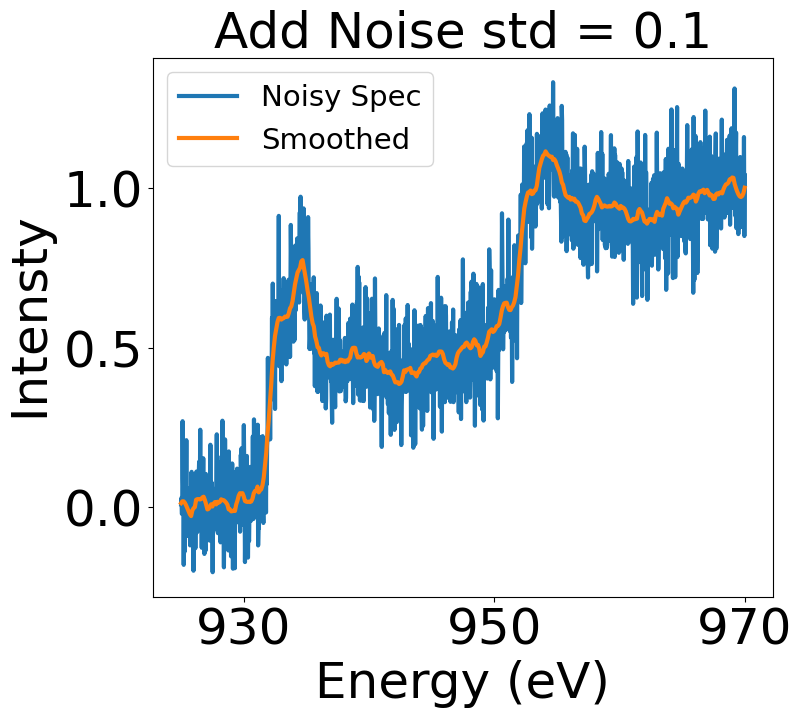

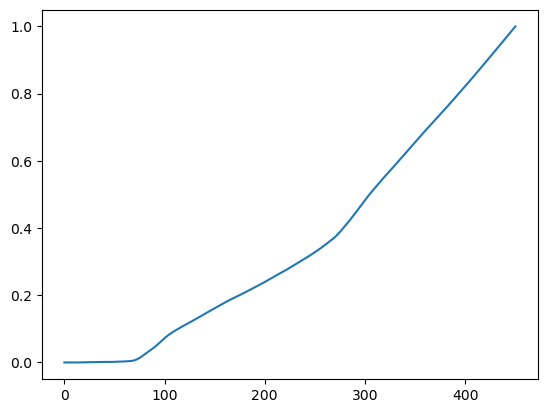

model accuracy (R^2) on simulated test data 0.7563399344025469
0.30710842363918145


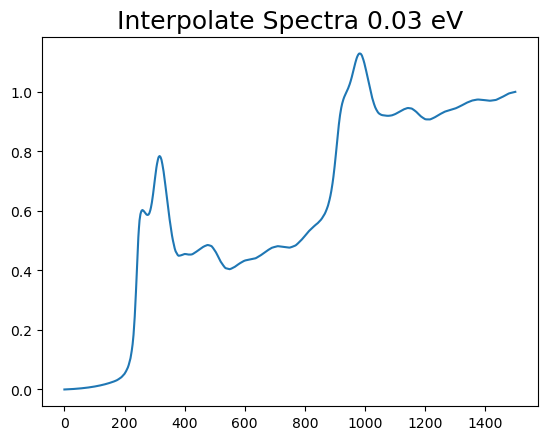

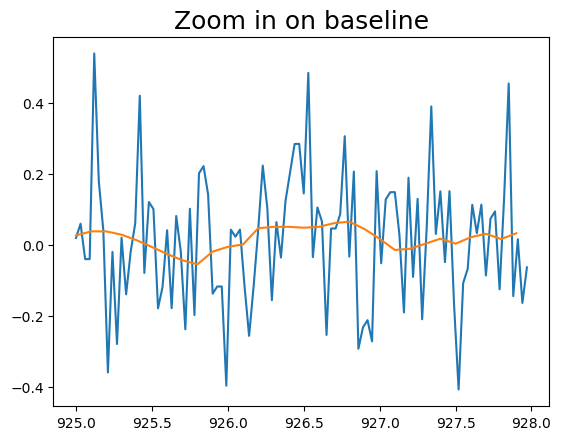

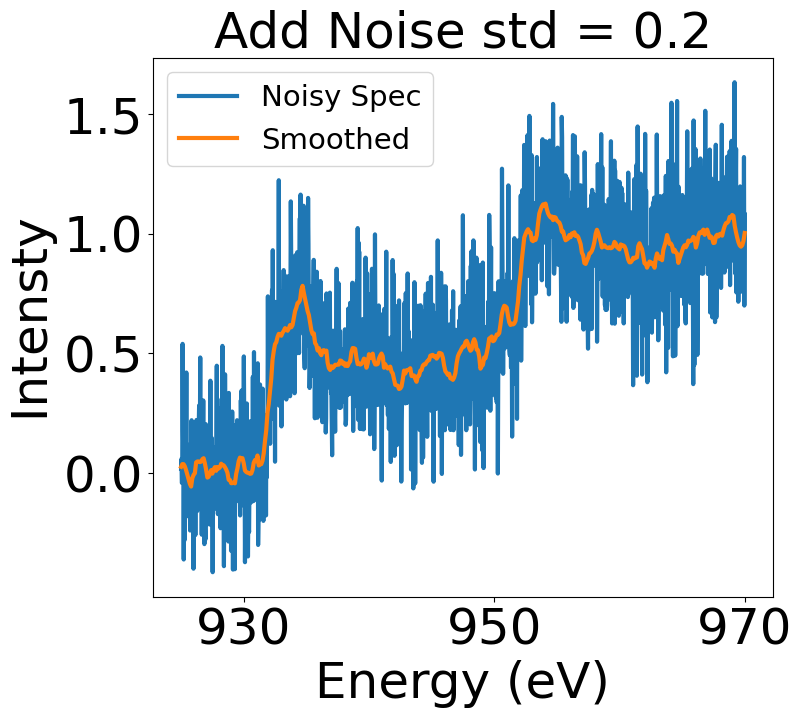

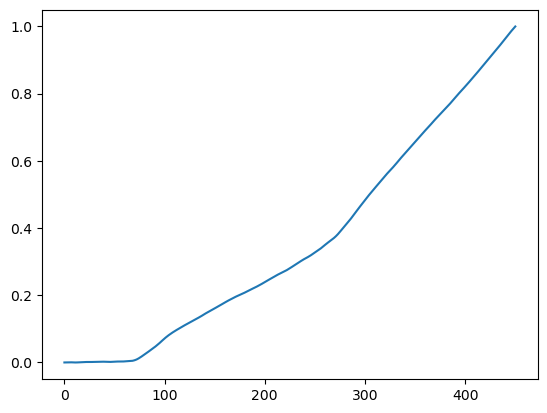

model accuracy (R^2) on simulated test data 0.7478253706217943
0.31242821389374803
1
model accuracy (R^2) on simulated test data 0.7508458103987904
0.31055151166942985
model accuracy (R^2) on simulated test data 0.6036338938189993
0.39169479955678715
model accuracy (R^2) on simulated test data 0.5721694870059936
0.40694472945923665
model accuracy (R^2) on simulated test data 0.5497336411356891
0.4174786790109927
2
model accuracy (R^2) on simulated test data 0.7756134477145
0.29471209741741466
model accuracy (R^2) on simulated test data 0.6320611483903921
0.37738738139766054
model accuracy (R^2) on simulated test data 0.5787772024927822
0.4037899304498772
model accuracy (R^2) on simulated test data 0.5400743718868306
0.42193286589630014
3
model accuracy (R^2) on simulated test data 0.6961923842772695
0.3429247878301107
model accuracy (R^2) on simulated test data 0.5369180707063852
0.42337817586009
model accuracy (R^2) on simulated test data 0.5072871113110531
0.4367133939658067
model ac

In [121]:
test_rf_obj.full_noise_setup('Interpolated_spec_0.03', 'Interpolated_spec_energies_0.03', 0.03, 51, 
                             filename='Dataset_generation/BUG_FIXED_reproducable_alignment_model_full_noise_df_poisson_03.joblib',
                            show_plots = True, num_random_seeds = 100)

In [278]:
poisson_noise_df_03 = joblib.load('Dataset_generation/BUG_FIXED_reproducable_alignment_model_full_noise_df_poisson_03.joblib')

R2s
0.7620922440387122 0.707940159862977 0.6822135321841841 0.6320280410261636
RMSEs
0.30027906294406603 0.3319158880940154 0.3466050503403884 0.37359246657414047


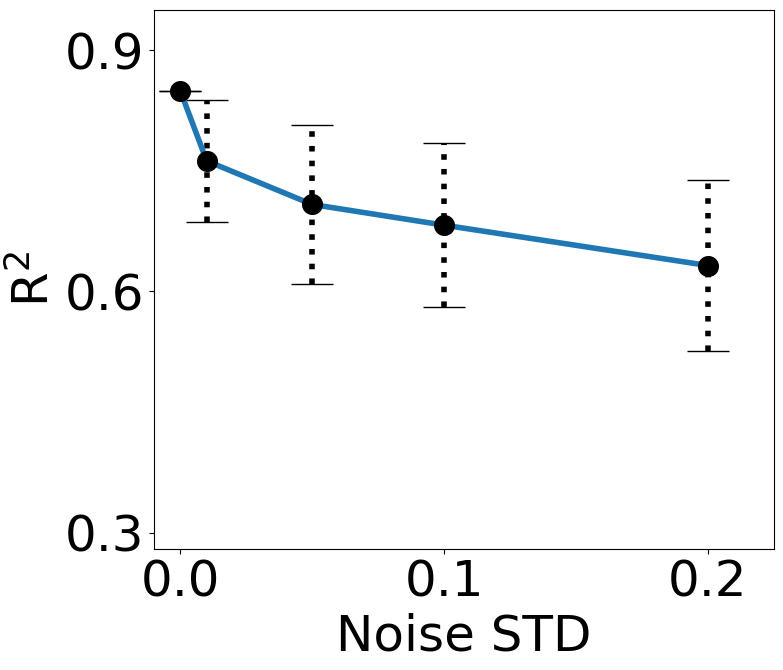

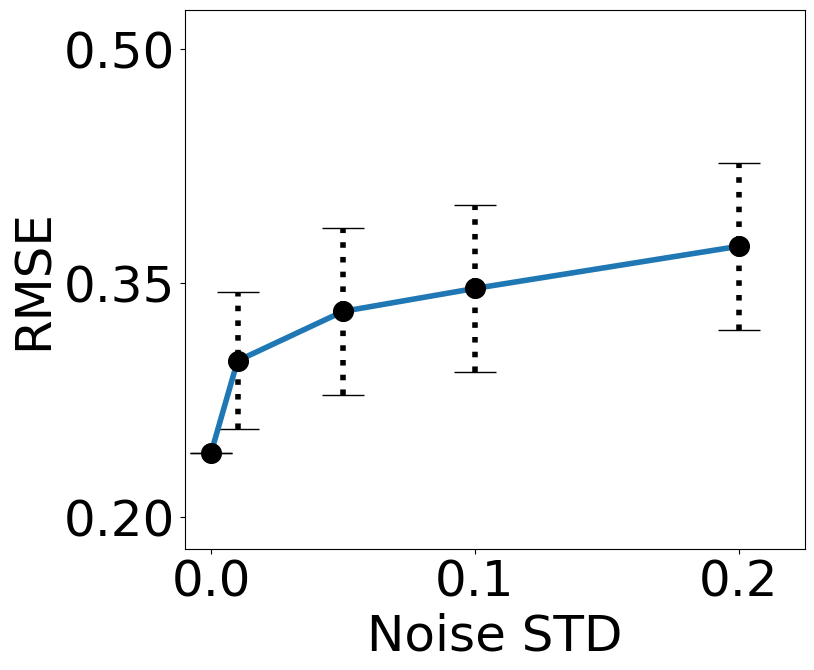

In [282]:
visualize_full_noise_test_set([poisson_noise_df_03], [0.03], savefigure=True, top_line_accuracy = [test_rf_obj.accuracy, test_rf_obj.rmse])